In [1]:
import snapatac2 as snap    
import nbformat as nbf
import umap
import scvi
import numpy as np
import scanpy as sc
import anndata as ad

In [6]:
data = snap.pp.import_fragments(
    "/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/raw/brain_epilepsy/data/outs/fragments.tsv.gz",
    chrom_sizes=snap.genome.hg38,  #
    sorted_by_barcode=False,
)
data          

AnnData object with n_obs × n_vars = 4824 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito'
    uns: 'reference_sequences'
    obsm: 'fragment_paired'

In [5]:
## Bit of extra information:
'''
1. Nucleosome-Free Region (NFR): The majority of fragments are short, typically around 80-300 base pairs (bp) in length. 
These short fragments represent regions of open chromatin where DNA is relatively accessible and not bound to nucleosomes. 
These regions are often referred to as nucleosome-free regions (NFRs) and correspond to regions of active transcriptional 
regulation.

2. Mono-Nucleosome Peaks: There is often a peak in the fragment size distribution at around 147-200 bp, 
which corresponds to the size of a single nucleosome wrapped DNA. These fragments result from the 
cutting of DNA by the transposase enzyme when it encounters a nucleosome, 
causing the DNA to be protected and resulting in fragments of the same size.

3. Di-Nucleosome Peaks: In addition to the mono-nucleosome peak, you may also observe 
a smaller peak at approximately 300-400 bp, corresponding to di-nucleosome fragments. 
These fragments occur when transposase cuts the DNA between two neighboring nucleosomes.

4. Large Fragments: Some larger fragments, greater than 500 bp in size, may be observed. 
These fragments can result from various sources, such as the presence of 
longer stretches of open chromatin or technical artifacts.
'''

#Idk why this isn't wokring something to do with chrome wtf

snap.pl.frag_size_distr(data, interactive=False)

ValueError: 
Image export using the "kaleido" engine requires the Kaleido package,
which can be installed using pip:

    $ pip install --upgrade kaleido


In [ ]:
## Same plot with axis to log scale
fig = snap.pl.frag_size_distr(data, show=False)
fig.update_yaxes(type="log")
fig.show()

2025-11-20 20:01:09 - INFO - Computing fragment size distribution...
/home/elliot/miniconda3/envs/atac_env_new2/lib/python3.9/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




: 

In [7]:
## TSS enrichment implies there is an increased accessibility or fragmentation of chromatin around the TSS
## Often indicative of promoter regions
snap.metrics.tsse(data, snap.genome.hg38)

In [8]:
## To identify usable/high-quality cells, we can plot TSSe scores against number of unique fragments for each cell.
snap.pl.tsse(data, interactive=True)
data
##The cells in the upper right represent valid or high-quality cells, whereas those in the lower left represent low-quality 
# cells or empty droplets. Based on this plot, 
#we decided to set a minimum TSS enrichment of 10 and a minimum number of fragments of 5,000 to filter the cells.

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/snapatac2/plotting/__init__.py:97: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  x = adata.obs["n_fragment"][selected_cells]
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/snapatac2/plotting/__init__.py:98: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = adata.obs["tsse"][selected_cells]
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or 

AnnData object with n_obs × n_vars = 4824 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse'
    uns: 'reference_sequences', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile'
    obsm: 'fragment_paired'

In [9]:
## OprionL - Filtering cells here results in fewer mitochondrial variants deteced
snap.pp.filter_cells(data, min_counts=1000, min_tsse=10, max_counts=100000)
data

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning:

Transforming to str index.

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning:

Transforming to str index.



AnnData object with n_obs × n_vars = 3507 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse'
    uns: 'reference_sequences', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile'
    obsm: 'fragment_paired'

In [10]:
## Cell by bin matrix containng insertion counts across 500bp bins across the genome
snap.pp.add_tile_matrix(data)

In [11]:
## Feature selection, which will be stored in data.var['selected'] this is particularly relevant for scrublet and spectral
## Selects most accessible features 
## n_features determines number of features, experiment with n_features to find the optimal number for your dataset
snap.pp.select_features(data, n_features=250000)

2025-12-09 18:29:40 - INFO - Selected 250000 features.


In [12]:

## Scrublet is used to remove potential dublets. It will assign probabilities to each cell, and then we can filter
snap.pp.scrublet(data)
#snap.pp.scrublet(data)
snap.pp.filter_doublets(data)
data

2025-12-09 18:29:41 - INFO - Simulating doublets...
2025-12-09 18:29:42 - INFO - Spectral embedding ...
2025-12-09 18:32:38 - INFO - Calculating doublet scores...
2025-12-09 18:32:42 - INFO - Detected doublet rate = 4.591%


AnnData object with n_obs × n_vars = 3346 × 6062095
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'doublet_probability', 'doublet_score'
    var: 'count', 'selected'
    uns: 'reference_sequences', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile', 'scrublet_sim_doublet_score', 'doublet_rate'
    obsm: 'fragment_paired'

In [13]:
## Spectral embedding is used for dimensionality reduction
## Stored in data.obsm['X_spectral']
snap.tl.spectral(data)
snap.tl.umap(data)

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [14]:
## Perform graph based clustering, build k-nearest neighbour graph then use leiden algorithm to identify clusters
snap.pp.knn(data)
snap.tl.leiden(data, resolution=0.7)  # Adjust resolution for more or fewer clusters

In [17]:
snap.pl.umap(data, color='leiden', interactive=True, height=500)


In [18]:
data.write_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx.h5ad")

... storing 'leiden' as categorical


In [16]:
#ELLIOT - lucas' Clustering done annotation begins 
## Annotate the clusters and assign them to known cell types
## Compute gene activities for each cell using pp.make_gene_matrix

gene_matrix = snap.pp.make_gene_matrix(
    data, 
    gene_anno=snap.genome.hg38,
    gene_name_key='gene_name'  # Use Ensembl IDs instead of gene symbols
)

# Remove version numbers from Ensembl IDs
#gene_matrix.var_names = gene_matrix.var_names.str.replace(r'\.\d+$', '', regex=True)



thread '<unnamed>' panicked at /root/.cargo/registry/src/index.crates.io-6f17d22bba15001f/pyanndata-0.4.1/src/anndata/memory.rs:148:33:
called `Result::unwrap()` on an `Err` value: PyErr { type: <class 'KeyboardInterrupt'>, value: KeyboardInterrupt(), traceback: Some(<traceback object at 0x7fa707fcfd40>) }
note: run with `RUST_BACKTRACE=1` environment variable to display a backtrace


PanicException: called `Result::unwrap()` on an `Err` value: PyErr { type: <class 'KeyboardInterrupt'>, value: KeyboardInterrupt(), traceback: Some(<traceback object at 0x7fa707fcfd40>) }

... storing 'leiden' as categorical


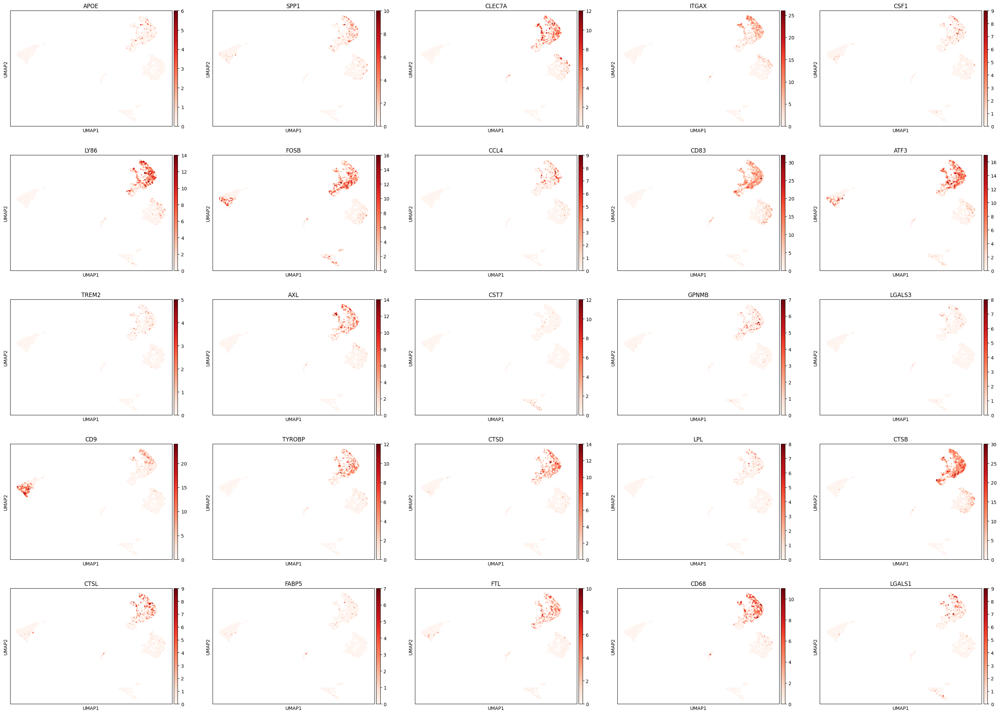

In [27]:
import matplotlib.pyplot as plt

# Copy UMAP coordinates from original data
gene_matrix.obsm['X_umap'] = data.obsm['X_umap']

# Plot all 25 DAM genes (remove cmap and ncols - not supported by snapatac2)
all_dam_genes = ['APOE', 'SPP1', 'CLEC7A', 'ITGAX', 'CSF1', 'LY86', 
                 'FOSB', 'CCL4', 'CD83', 'ATF3', 'TREM2', 'AXL', 'CST7',
                 'GPNMB', 'LGALS3', 'CD9', 'TYROBP', 'CTSD', 'LPL',
                 'CTSB', 'CTSL', 'FABP5', 'FTL', 'CD68', 'LGALS1']

# Plot one at a time or use scanpy instead
import scanpy as sc

sc.pl.umap(gene_matrix, color=all_dam_genes, cmap='Reds', ncols=5)

In [ ]:
#ELLIOT - Lucas' annotation method 
#import RNA reference data

reference = sc.read_h5ad('/mnt/claw-raid/elliot/brainvasc_ref.h5ad')
reference = reference.raw.to_adata() #mkaes sure ref is raw data also not nomrlised
reference


# Check the cell type column name in your reference
print(reference.obs.columns)  # Find which column has cell types


Index(['author_cell_type', 'cell_type_ontology_term_id', 'donor_id',
       'development_stage_ontology_term_id', 'sex_ontology_term_id',
       'disease_ontology_term_id', 'is_primary_data', 'suspension_type',
       'tissue_ontology_term_id', 'tissue_type', 'assay_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay',
       'disease', 'sex', 'tissue', 'self_reported_ethnicity',
       'development_stage', 'observation_joinid'],
      dtype='object')


In [ ]:
#ELLIOT - Merge reference data and query data

# CRITICAL: Convert reference to use Ensembl IDs
reference.var_names = reference.var['ensembl_id'].values
reference.var_names_make_unique()

# Now merge
gene_matrix.obs['cell_type'] = 'Unknown'
integrated = ad.concat(  # ← Fixed typo: intergrated → integrated
    [reference, gene_matrix],
    join='inner',
    label='batch',
    keys=["reference", "query"],
    index_unique='_',
)

print(f"Combined shape: {integrated.shape}")

Combined shape: (66691, 30704)


In [16]:
# scanpy finds highly variable genes (batch correction)
#if you ask callum he will say this is shit because this is porabbly just to make it faster
sc.pp.filter_genes(integrated, min_cells=5)
#find hvg
sc.pp.highly_variable_genes(
    integrated,
    n_top_genes = 5000,
    flavor="seurat_v3",
    batch_key="batch",
    subset=True
)

In [17]:
#set up machine learning 
scvi.model.SCVI.setup_anndata(integrated, batch_key="batch")
vae = scvi.model.SCVI(
    integrated,
    n_layers=2,
    n_latent=30,
    gene_likelihood="nb",
    dispersion="gene-batch",
)

2025-11-22 15:52:09 - INFO - Unable to initialize backend 'cuda': 
2025-11-22 15:52:09 - INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2025-11-22 15:52:09 - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


In [18]:
#pretraining model?
vae.train(max_epochs=100, early_stopping=True, enable_progress_bar=True)
#if it's taking forever, maybe subset your ref dataset or uncrease that batch size


/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

INFO: GPU available: False, used: False
2025-11-22 15:52:17 - INFO - GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
2025-11-22 15:52:17 - INFO - TPU available: False, using: 0 TPU cores
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

/home/elliot/miniconda3/en

Epoch 100/100: 100%|██████████| 100/100 [17:50<00:00, 10.61s/it, v_num=1, train_loss_step=971, train_loss_epoch=1e+3]     

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-11-22 16:10:07 - INFO - `Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [17:50<00:00, 10.70s/it, v_num=1, train_loss_step=971, train_loss_epoch=1e+3]


<Axes: xlabel='epoch'>

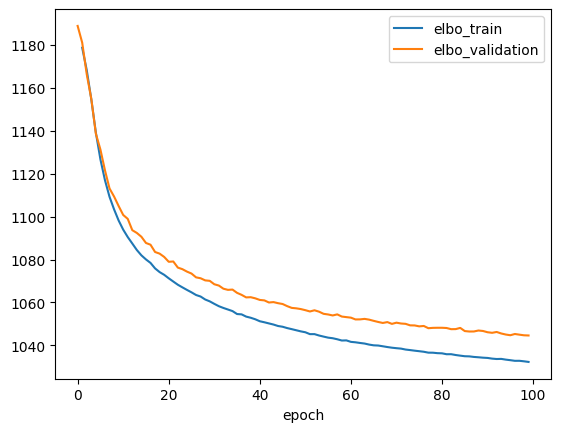

In [19]:
#plot training model to make sure it has converged 
ax = vae.history['elbo_train'][1:].plot()
vae.history['elbo_validation'].plot(ax=ax)


In [20]:
#setting up training model, check the 'class' or quivalent column is presetn in the refernce an merged object 
integrated.obs["celltype_scanvi"] = 'Unknown'
ref_idx = integrated.obs['batch'] == "reference"
integrated.obs.loc[ref_idx, "celltype_scanvi"] = integrated.obs.loc[ref_idx, 'cell_type'].astype(str) 


In [21]:
#who knows what this does maybe callum 
lvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=integrated,
    labels_key="celltype_scanvi",
    unlabeled_category="Unknown",
)

In [22]:
lvae.train(max_epochs=100, n_samples_per_label=100, early_stopping=True)

INFO     Training for 100 epochs.                                                                                  


/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

INFO: GPU available: False, used: False
2025-11-22 16:10:43 - INFO - GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
2025-11-22 16:10:43 - INFO - TPU available: False, using: 0 TPU cores
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

/home/elliot/miniconda3/en

Epoch 100/100: 100%|██████████| 100/100 [41:59<00:00, 25.22s/it, v_num=1, train_loss_step=972, train_loss_epoch=999]    

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-11-22 16:52:43 - INFO - `Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [41:59<00:00, 25.19s/it, v_num=1, train_loss_step=972, train_loss_epoch=999]


<Axes: xlabel='epoch'>

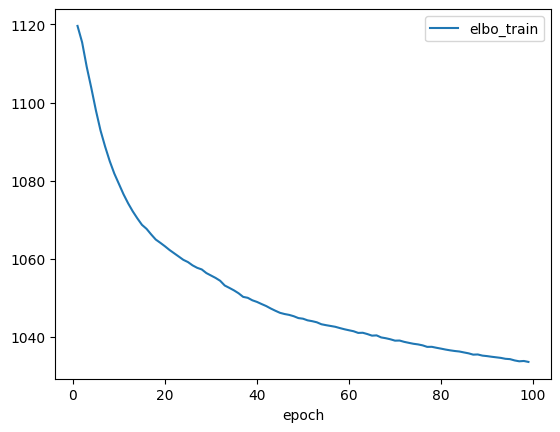

In [23]:
#plotting history as normal (if not saved)
lvae.history['elbo_train'][1:].plot()


In [24]:
# Now you can use the model
integrated.obs["C_scANVI"] = lvae.predict()
integrated.obsm["X_scANVI"] = lvae.get_latent_representation()

In [25]:
#generating uMAP
sc.pp.neighbors(integrated, use_rep="X_scANVI")
sc.tl.umap(integrated)

... storing 'cell_type' as categorical
... storing 'celltype_scanvi' as categorical
... storing 'C_scANVI' as categorical


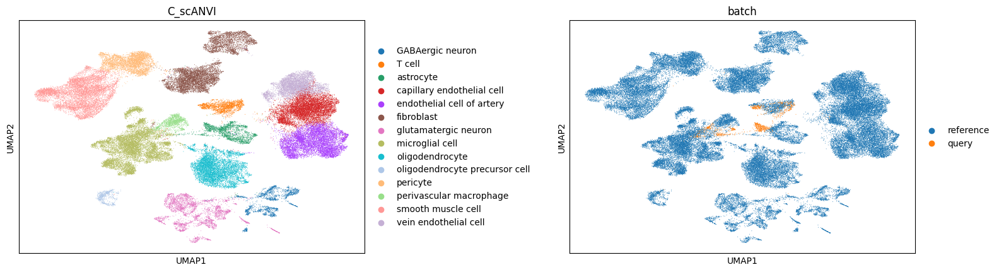

In [26]:
#Plotting uMAP querey and reference
sc.pl.umap(integrated, color=['C_scANVI', "batch"], wspace=0.45)


In [27]:
# Transfer predicted cell types back to original SnapATAC2 object
data.obs['cell_type'] = integrated.obs.loc[data.obs_names + '_query', 'C_scANVI'].to_numpy()

... storing 'leiden' as categorical
... storing 'cell_type' as categorical


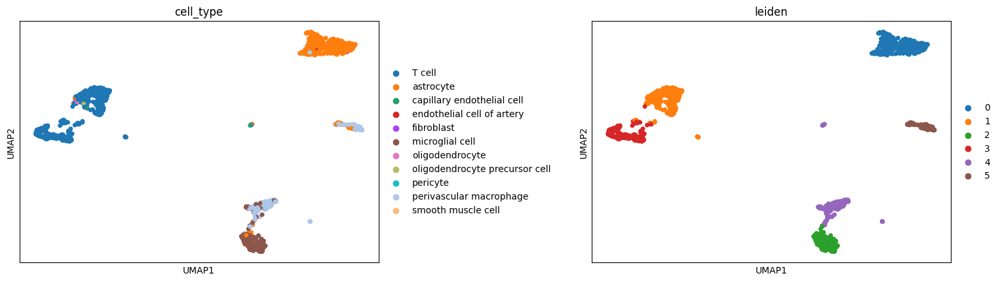

In [28]:
sc.pl.umap(data  , color=['cell_type', "leiden"], wspace=0.45)


In [ ]:
#save annotated data as h5ad file
data.write("annotated_PM.h5ad")


In [14]:
import matplotlib.pyplot as plt

# Define marker genes for each cell type
celltype_markers = {
    #'PBMCs': ["CD4","CD8A","CD3D","NCAM1","FCGR3A","CD14","CD1C","CLEC9A","IL3RA","GZMB","C5AR1","CD34","CD19","MS4A1"], ## PTPRC is CD45, sample should be 70/30 CD4+/CD4-
    'cortex': ["SPI1","P2RY12","RBFOX3","SYT1","SNAP25","OLIG1","GFAP","CD3D","CD14","CD68","PTPRC"],
  
}

# Plot UMAPs for each cell type's marker genes
for celltype, genes in celltype_markers.items():
    sc.pl.umap(
        gene_matrix, 
        color=genes, 
        ncols=2, 
        cmap='coolwarm',
        vmax='p95',
        size=10,
        title=[f"{celltype}: {gene}" for gene in genes],
        show=True
    )
plt.show()


... storing 'leiden' as categorical


KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [ ]:
#Elliot - mkaing a DEGs list actually, gene_matrix is an object NOT an acutal matrix 

# Get the number of top genes (should be 20 based on your plot)
n_genes = len(gene_matrix.uns['rank_genes_groups']['names'])

# Create a dictionary with DEG lists for each cluster
deg_lists = {}
for i in range(n_genes):
    for j, cluster in enumerate(gene_matrix.uns['rank_genes_groups']['names'].dtype.names):
        if cluster not in deg_lists:
            deg_lists[cluster] = []
        deg_lists[cluster].append(gene_matrix.uns['rank_genes_groups']['names'][i][j])

# Now deg_lists contains clean lists of top DEGs for each cluster
for cluster, genes in deg_lists.items():
    print(f"Cluster {cluster}: {genes[:20]}...")  # Show first 5 genes

Cluster 0: ['LRP1B', 'GRID2', 'ENSG00000231918', 'CNTN5', 'CNTNAP2', 'DPP10', 'ENSG00000251574', 'EYS', 'ROBO2', 'ERBB4', 'DMD', 'NAALADL2', 'CSMD3', 'ENSG00000254394', 'CDH18', 'RBMS3', 'ROBO1', 'ENSG00000248752', 'SPAG16', 'CADM2']...
Cluster 1: ['PELATON', 'CDH23', 'ENSG00000285565', 'RAD51B', 'PSAP', 'DAPK1', 'SLC24A4', 'PGS1', 'ENSG00000234261', 'PFKFB3', 'ZMIZ1', 'ENSG00000273112', 'HSPD1', 'MGAT1', 'BAG3', 'MBP', 'HSPH1', 'ENSG00000285016', 'DNAJB6', 'XYLT1']...
Cluster 2: ['ENSG00000234261', 'LINC00877', 'SCIRT', 'ENSG00000258137', 'HK2', 'JARID2', 'ZMIZ1', 'ENSG00000258086', 'CUX1', 'PRKAG2', 'RBM47', 'RIN2', 'SLCO3A1', 'GAS7', 'RFX2', 'NCOR2', 'TIMP2', 'ENSG00000289728', 'DMXL2', 'FNDC3B']...
Cluster 3: ['HK2', 'CUX1', 'FNDC3B', 'RUNX1', 'PRKAG2', 'MAML3', 'JARID2', 'ASAP1', 'ENSG00000289728', 'DOCK5', 'ENSG00000259345', 'SLCO3A1', 'RPTOR', 'SLC24A4', 'ENSG00000286022', 'IGF2BP2', 'DOCK2', 'PPARG', 'LUCAT1', 'NIBAN2']...
Cluster 4: ['BCL11B', 'RORA', 'RORA-AS1', 'SCML4', 'ITK

... storing 'leiden' as categorical


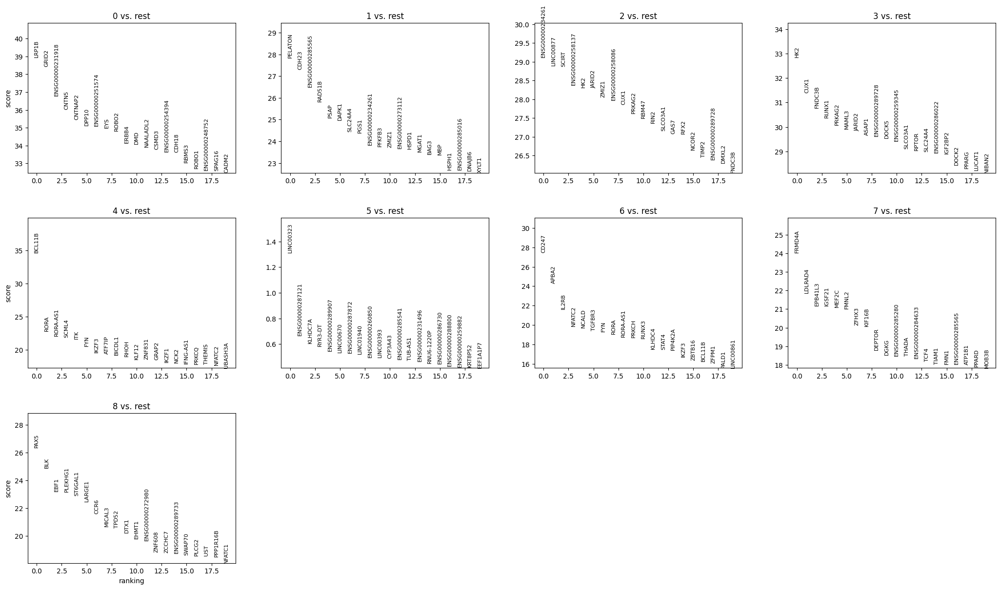

In [ ]:
# Run differential expression analysis between clusters (e.g., 'leiden' clusters)
sc.tl.rank_genes_groups(gene_matrix, groupby='leiden', method='wilcoxon')

# Show the top marker genes for each cluster
sc.pl.rank_genes_groups(gene_matrix, n_genes=20, sharey=False)



In [ ]:
# !!!!!!!!!!!!!!!!!! !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!OK SO NOW THE MT VARIANT CALLING BEGINS STOP HERE !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [3]:
import anndata as ad

data = ad.read_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx.h5ad")
mgatk = mgatk = ad.read_h5ad('/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/mgatk_processed.h5ad')



In [5]:
import sys
sys.path.insert(0, '/mnt/claw-raid/elliot/P002_mtscATAC-seq/scripts/Py_mTCall_tools')
from Py_mTCall_tools import variant_calling_fast as vc
mgatk = vc.process_variants_fast("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/raw/brain_epilepsy/data/mgatk_output/final", data, min_strand_count=1, coverage_threshold=20)


=== Fast Variant Calling Pipeline ===
Loaded counts data: (131835, 4028)
Loaded coverage data: (63327769, 3)
Identifying variants (memory-optimized chunked method)...
Processing all 98699 variant observations
Extracting unique cells...
Found 4025 cells, processing 17 chunks...
  Processing chunk 0/17...
  Processing chunk 5/17...
  Processing chunk 10/17...
  Processing chunk 15/17...
Integrating with AnnData...
Matched 3303 cells out of 3346 in adata
=== Pipeline Complete ===
Processed 44436 variants in 3303 cells
Matrix shapes: (3346, 44436) (cells x variants)


In [ ]:
#looking for vairnts enrichment without the pattern filter
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

# Settings
min_cells_total = 10
max_prevalence = 0.5

results = []

# Loop through all variants
for i, variant in enumerate(variant_names):
    if i % 25 == 0:
        print(f"Progress: {i}/{len(variant_names)}")
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]
    g13_vaf = variant_vaf[group_1_3_mask]
    
    # Count cells at 2% threshold
    g246_with = (g246_vaf > 0.02).sum()
    g13_with = (g13_vaf > 0.02).sum()
    
    # Mean VAF
    mean_g246 = np.mean(g246_vaf)
    mean_g13 = np.mean(g13_vaf)
    
    # Total prevalence check (at 1% threshold)
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    # Skip uninformative variants
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # Fisher's exact test
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    # Log2 fold change
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    results.append({
        'variant': variant,
        'n_246': g246_with,
        'n_13': g13_with,
        'mean_246': mean_g246,
        'mean_13': mean_g13,
        'log2FC': log2fc,
        'odds_ratio': odds_ratio,
        'p_value': p_value
    })

df = pd.DataFrame(results)

# Filter significant, then sort by effect size
df_sig = df[df['p_value'] < 0.05].sort_values('log2FC', ascending=False)

print(f"\nFound {len(df)} testable variants")
print(f"Significant (p<0.05): {len(df_sig)}")
print("\n=== TOP 20 SIGNIFICANT VARIANTS (by log2FC) ===")
print(df_sig.head(20))
print("\n=== ALL VARIANTS (sorted by p-value) ===")
print(df.sort_values('p_value').head(20))


Progress: 0/44436
Progress: 25/44436
Progress: 50/44436
Progress: 75/44436
Progress: 100/44436
Progress: 125/44436
Progress: 150/44436
Progress: 175/44436
Progress: 200/44436
Progress: 225/44436
Progress: 250/44436
Progress: 275/44436
Progress: 300/44436
Progress: 325/44436
Progress: 350/44436
Progress: 375/44436
Progress: 400/44436
Progress: 425/44436
Progress: 450/44436
Progress: 475/44436
Progress: 500/44436
Progress: 525/44436
Progress: 550/44436
Progress: 575/44436
Progress: 600/44436
Progress: 625/44436
Progress: 650/44436
Progress: 675/44436
Progress: 700/44436
Progress: 725/44436
Progress: 750/44436
Progress: 775/44436
Progress: 800/44436
Progress: 825/44436
Progress: 850/44436
Progress: 875/44436
Progress: 900/44436
Progress: 925/44436
Progress: 950/44436
Progress: 975/44436
Progress: 1000/44436
Progress: 1025/44436
Progress: 1050/44436
Progress: 1075/44436
Progress: 1100/44436
Progress: 1125/44436
Progress: 1150/44436
Progress: 1175/44436
Progress: 1200/44436
Progress: 1225/4

... storing 'group' as categorical


Plotting 10 variants:

=== INFLAMMATORY-ENRICHED (top 5) ===
  C-5561-T: 246=11 vs 13=0 cells | log2FC=3.26 | p=0.0034
  C-10440-T: 246=8 vs 13=0 cells | log2FC=2.85 | p=0.0111
  G-12184-A: 246=7 vs 13=0 cells | log2FC=2.69 | p=0.0205
  G-1645-A: 246=7 vs 13=0 cells | log2FC=2.69 | p=0.0205
  T-12284-C: 246=6 vs 13=0 cells | log2FC=2.50 | p=0.0381

=== HOMEOSTATIC-ENRICHED (top 5) ===
  G-4267-A: 246=0 vs 13=9 cells | log2FC=-3.31 | p=0.0006
  G-1643-A: 246=0 vs 13=5 cells | log2FC=-2.58 | p=0.0162
  G-14708-A: 246=1 vs 13=7 cells | log2FC=-2.16 | p=0.0250
  G-12217-A: 246=1 vs 13=7 cells | log2FC=-2.16 | p=0.0250
  A-5773-G: 246=1 vs 13=6 cells | log2FC=-1.97 | p=0.0484


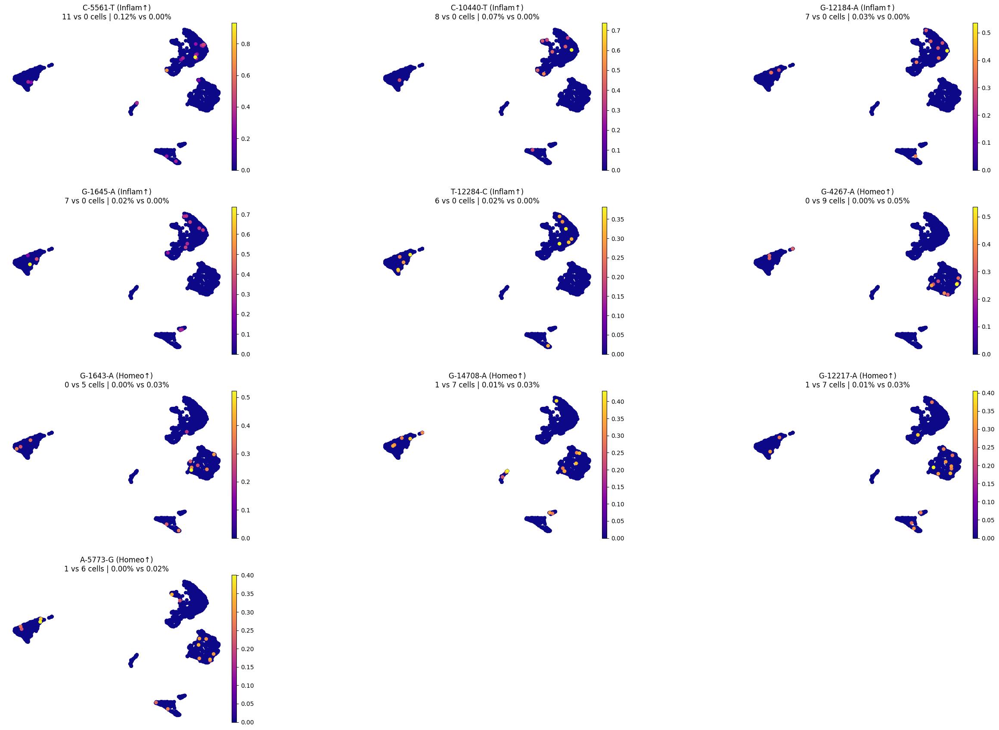


✓ Plotted 10 variants (top 5 from each direction)
✓ Cube root transformed VAF for better visualization
✓ Saved to figures/umap_top_enriched_variants.pdf


In [ ]:
#plot top 5 enriched variants from each direction by log2FC
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Get top 5 inflammatory-enriched (positive log2FC)
df_inflammatory = df_sig[df_sig['log2FC'] > 0].sort_values('log2FC', ascending=False).head(5)

# Get top 5 homeostatic-enriched (negative log2FC)
df_homeostatic = df_sig[df_sig['log2FC'] < 0].sort_values('log2FC', ascending=True).head(5)

# Combine them
df_top = pd.concat([df_inflammatory, df_homeostatic])
sig_variants = df_top['variant'].tolist()

print(f"Plotting {len(sig_variants)} variants:")
print("\n=== INFLAMMATORY-ENRICHED (top 5) ===")
for v in df_inflammatory['variant'].tolist():
    row = df_top[df_top['variant'] == v].iloc[0]
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    log2fc = row['log2FC']
    pval = row['p_value']
    print(f"  {v}: 246={n_246} vs 13={n_13} cells | log2FC={log2fc:.2f} | p={pval:.4f}")

print("\n=== HOMEOSTATIC-ENRICHED (top 5) ===")
for v in df_homeostatic['variant'].tolist():
    row = df_top[df_top['variant'] == v].iloc[0]
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    log2fc = row['log2FC']
    pval = row['p_value']
    print(f"  {v}: 246={n_246} vs 13={n_13} cells | log2FC={log2fc:.2f} | p={pval:.4f}")

# Apply cube root transformation to enhance low VAF signals
for variant in sig_variants:
    vaf_col = f'vaf_{variant}'
    if vaf_col in mgatk.obs.columns:
        vaf_values = mgatk.obs[vaf_col].values
    else:
        # Get from vaf_matrix
        variant_idx = np.where(variant_names == variant)[0][0]
        vaf_values = vaf_matrix[:, variant_idx]
        mgatk.obs[vaf_col] = vaf_values
    
    # Cube root transform
    mgatk.obs[f'vaf_{variant}_transformed'] = np.power(vaf_values, 1/3)

# Create informative titles
titles = []
for v in sig_variants:
    row = df_top[df_top['variant'] == v].iloc[0]
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    mean_246 = row['mean_246'] * 100
    mean_13 = row['mean_13'] * 100
    log2fc = row['log2FC']
    
    # Determine enrichment direction
    if log2fc > 0:
        direction = "Inflam↑"
    elif log2fc < 0:
        direction = "Homeo↑"
    else:
        direction = "Equal"
    
    titles.append(f"{v} ({direction})\n{n_246} vs {n_13} cells | {mean_246:.2f}% vs {mean_13:.2f}%")

# Plot with high contrast
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}_transformed' for v in sig_variants],
           cmap='plasma',
           size=150,
           frameon=False,
           ncols=3 if len(sig_variants) > 6 else 2,
           wspace=0.5,
           title=titles,
           vmin=0,
           save='_top_enriched_variants.pdf')

print(f"\n✓ Plotted {len(sig_variants)} variants (top 5 from each direction)")
print("✓ Cube root transformed VAF for better visualization")
print("✓ Saved to figures/umap_top_enriched_variants.pdf")


Plotting 10 variants:

=== INFLAMMATORY-ENRICHED (top 5 by cell count) ===
  C-5886-T: 246=14 vs 13=3 cells | log2FC=1.58 | p=0.0464
  A-12275-G: 246=13 vs 13=1 cells | log2FC=2.48 | p=0.0052
  C-5728-T: 246=12 vs 13=2 cells | log2FC=1.79 | p=0.0294
  G-581-A: 246=11 vs 13=1 cells | log2FC=2.26 | p=0.0162
  C-5561-T: 246=11 vs 13=0 cells | log2FC=3.26 | p=0.0034

=== HOMEOSTATIC-ENRICHED (top 5 by cell count) ===
  C-5796-T: 246=12 vs 13=20 cells | log2FC=-1.02 | p=0.0468
  C-12145-T: 246=5 vs 13=13 cells | log2FC=-1.51 | p=0.0173
  G-4267-A: 246=0 vs 13=9 cells | log2FC=-3.31 | p=0.0006
  C-15956-T: 246=2 vs 13=7 cells | log2FC=-1.64 | p=0.0483
  T-5696-C: 246=2 vs 13=7 cells | log2FC=-1.64 | p=0.0483


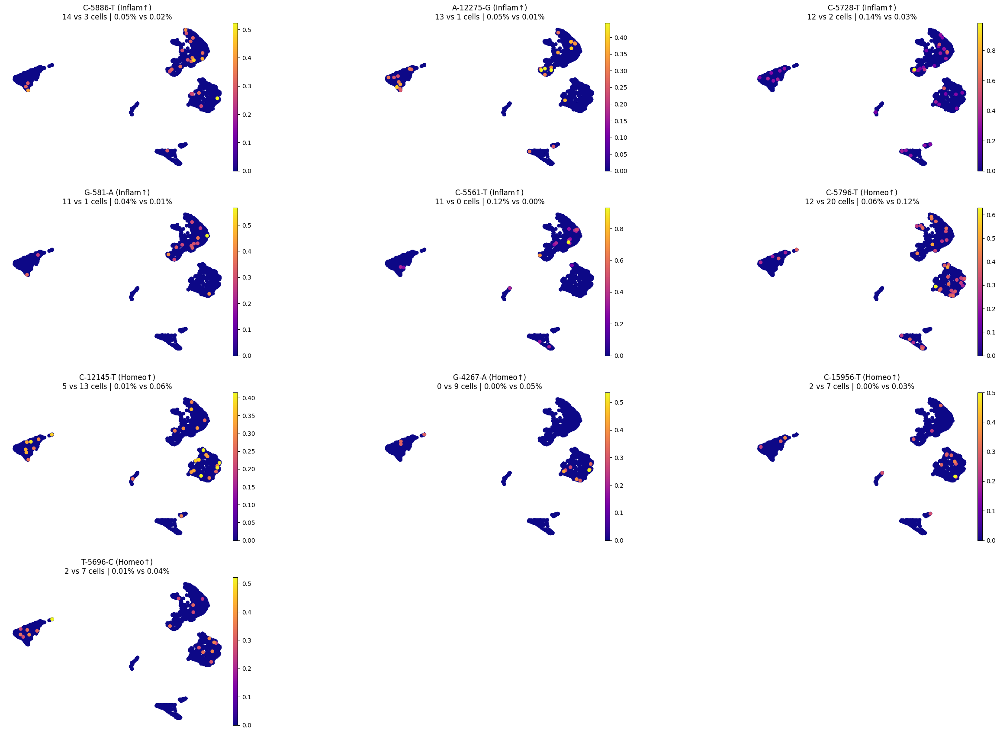


✓ Plotted 10 variants (top 5 by cell count from each direction)
✓ Saved to figures/umap_top_enriched_variants_by_count.pdf


In [56]:
#plot top 5 enriched variants from each direction by % in that cluster
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Get top 5 inflammatory-enriched by % of cells (n_246)
df_inflammatory = df_sig[df_sig['log2FC'] > 0].sort_values('n_246', ascending=False).head(5)

# Get top 5 homeostatic-enriched by % of cells (n_13)
df_homeostatic = df_sig[df_sig['log2FC'] < 0].sort_values('n_13', ascending=False).head(5)

# OR if you want by mean VAF %:
# df_inflammatory = df_sig[df_sig['log2FC'] > 0].sort_values('mean_246', ascending=False).head(5)
# df_homeostatic = df_sig[df_sig['log2FC'] < 0].sort_values('mean_13', ascending=False).head(5)

# Combine them
df_top = pd.concat([df_inflammatory, df_homeostatic])
sig_variants = df_top['variant'].tolist()

print(f"Plotting {len(sig_variants)} variants:")
print("\n=== INFLAMMATORY-ENRICHED (top 5 by cell count) ===")
for v in df_inflammatory['variant'].tolist():
    row = df_top[df_top['variant'] == v].iloc[0]
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    log2fc = row['log2FC']
    pval = row['p_value']
    print(f"  {v}: 246={n_246} vs 13={n_13} cells | log2FC={log2fc:.2f} | p={pval:.4f}")

print("\n=== HOMEOSTATIC-ENRICHED (top 5 by cell count) ===")
for v in df_homeostatic['variant'].tolist():
    row = df_top[df_top['variant'] == v].iloc[0]
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    log2fc = row['log2FC']
    pval = row['p_value']
    print(f"  {v}: 246={n_246} vs 13={n_13} cells | log2FC={log2fc:.2f} | p={pval:.4f}")

# Apply cube root transformation
for variant in sig_variants:
    vaf_col = f'vaf_{variant}'
    if vaf_col in mgatk.obs.columns:
        vaf_values = mgatk.obs[vaf_col].values
    else:
        variant_idx = np.where(variant_names == variant)[0][0]
        vaf_values = vaf_matrix[:, variant_idx]
        mgatk.obs[vaf_col] = vaf_values
    
    mgatk.obs[f'vaf_{variant}_transformed'] = np.power(vaf_values, 1/3)

# Create titles
titles = []
for v in sig_variants:
    row = df_top[df_top['variant'] == v].iloc[0]
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    mean_246 = row['mean_246'] * 100
    mean_13 = row['mean_13'] * 100
    log2fc = row['log2FC']
    
    direction = "Inflam↑" if log2fc > 0 else "Homeo↑"
    titles.append(f"{v} ({direction})\n{n_246} vs {n_13} cells | {mean_246:.2f}% vs {mean_13:.2f}%")

# Plot
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}_transformed' for v in sig_variants],
           cmap='plasma',
           size=150,
           frameon=False,
           ncols=3 if len(sig_variants) > 6 else 2,
           wspace=0.5,
           title=titles,
           vmin=0,
           save='_top_enriched_variants_by_count.pdf')

print(f"\n✓ Plotted {len(sig_variants)} variants (top 5 by cell count from each direction)")
print("✓ Saved to figures/umap_top_enriched_variants_by_count.pdf")


PATHOGENIC VARIANT ENRICHMENT ANALYSIS

Settings:
  VAF threshold: 3.0%
  APOGEE2 threshold: ≥0.716
  Min cells: 10
  Max prevalence: 50.0%
  Significance: p < 0.05

TECHNICAL CONTROL: Sequencing Depth Check
Total VAF (Inflammatory): 12.477 ± 4.517
Total VAF (Homeostatic):  11.857 ± 5.069
Fold Change: 1.052x
Mann-Whitney U p-value: 6.9378e-03

⚠️  WARNING: Sequencing depth differs significantly!
   Inflammatory cells have 1.05x coverage
   This may confound variant detection rates.
   → Using proportion-based Fisher's test (partially robust)

TESTING PATHOGENIC VARIANTS
Progress: 0/44436
Progress: 5000/44436
Progress: 10000/44436
Progress: 15000/44436
Progress: 20000/44436
Progress: 25000/44436
Progress: 30000/44436
Progress: 35000/44436
Progress: 40000/44436

RESULTS
Pathogenic variants tested: 1056
Significant (p < 0.05): 30
  - Inflammatory-enriched: 15
  - Homeostatic-enriched: 15

Top 10 inflammatory-enriched pathogenic variants:
  variant  apogee2_score  n_inflammatory  n_homeost

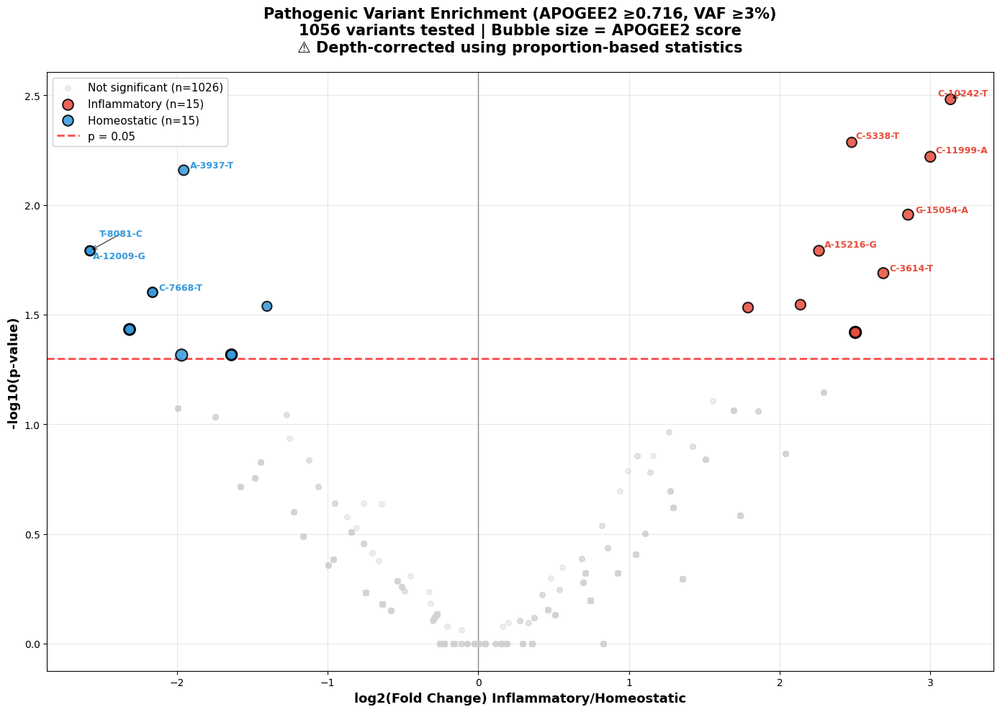


✓ Volcano plot saved to pathogenic_variants_volcano.pdf/png
✓ Results saved:
  - pathogenic_variants_enrichment_results.csv (all 1056 variants)
  - pathogenic_variants_enrichment_significant.csv (30 significant)

SUMMARY
Tested 1056 pathogenic variants
Expected false positives at p<0.05: 52.8
Observed significant variants: 30
⚠ No enrichment over background (weak signal)

⚠ NOTE: Depth bias detected (FC=1.05x)
  Fisher's test is partially robust (uses proportions, not counts)
  Results should be interpreted cautiously


In [ ]:
import numpy as np
from scipy.stats import fisher_exact, mannwhitneyu
import pandas as pd
import matplotlib.pyplot as plts

from adjustText import adjust_text

  
print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT ANALYSIS")
print("=" * 70)

# Settings
vaf_threshold = 0.03  # 3% VAF for detection
min_cells_total = 10
max_prevalence = 0.5
pathogenicity_threshold = 0.716  # APOGEE2 cutoff for pathogenic
p_threshold = 0.05  # Nominal p-value threshold

print(f"\nSettings:")
print(f"  VAF threshold: {vaf_threshold*100}%")
print(f"  APOGEE2 threshold: ≥{pathogenicity_threshold}")
print(f"  Min cells: {min_cells_total}")
print(f"  Max prevalence: {max_prevalence*100}%")
print(f"  Significance: p < {p_threshold}")

# ============================================================================
# TECHNICAL CONTROL: Check for Sequencing Depth Bias
# ============================================================================
print("\n" + "=" * 70)
print("TECHNICAL CONTROL: Sequencing Depth Check")
print("=" * 70)

# Calculate total VAF per cell (proxy for mtDNA coverage/depth)
total_vaf_per_cell = vaf_matrix.sum(axis=1)
total_vaf_inflam = total_vaf_per_cell[group_2_4_6_mask]
total_vaf_homeo = total_vaf_per_cell[group_1_3_mask]

# Test if depth differs between groups
stat_depth, p_depth = mannwhitneyu(total_vaf_inflam, total_vaf_homeo)

print(f"Total VAF (Inflammatory): {total_vaf_inflam.mean():.3f} ± {total_vaf_inflam.std():.3f}")
print(f"Total VAF (Homeostatic):  {total_vaf_homeo.mean():.3f} ± {total_vaf_homeo.std():.3f}")
print(f"Fold Change: {total_vaf_inflam.mean() / total_vaf_homeo.mean():.3f}x")
print(f"Mann-Whitney U p-value: {p_depth:.4e}")

if p_depth < 0.05:
    fc_depth = total_vaf_inflam.mean() / total_vaf_homeo.mean()
    print(f"\n⚠️  WARNING: Sequencing depth differs significantly!")
    print(f"   Inflammatory cells have {fc_depth:.2f}x coverage")
    print(f"   This may confound variant detection rates.")
    print(f"   → Using proportion-based Fisher's test (partially robust)")
else:
    print("\n✓ No significant depth difference detected - analysis is unbiased")

# ============================================================================
# VARIANT ENRICHMENT TESTING
# ============================================================================
print("\n" + "=" * 70)
print("TESTING PATHOGENIC VARIANTS")
print("=" * 70)

results = []

# Test all pathogenic variants
for i, variant in enumerate(variant_names):
    if i % 5000 == 0:
        print(f"Progress: {i}/{len(variant_names)}")
    
    # Filter: Only pathogenic variants
    apogee_score = variant_info[variant]['pathogenicity']
    if apogee_score < pathogenicity_threshold:
        continue
    
    # Get VAFs for each group
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]  # Inflammatory
    g13_vaf = variant_vaf[group_1_3_mask]      # Homeostatic
    
    # Count cells above VAF threshold
    g246_with = (g246_vaf > vaf_threshold).sum()
    g13_with = (g13_vaf > vaf_threshold).sum()
    
    # Quality filters
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # Fisher's exact test (two-sided)
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table, alternative='two-sided')
    
    # Calculate log2 fold change
    prop_246 = g246_with / len(g246_vaf)
    prop_13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_246 + 0.001) / (prop_13 + 0.001))
    
    results.append({
        'variant': variant,
        'apogee2_score': apogee_score,
        'n_inflammatory': g246_with,
        'n_homeostatic': g13_with,
        'prop_inflammatory': prop_246,
        'prop_homeostatic': prop_13,
        'log2FC': log2fc,
        'odds_ratio': odds_ratio,
        'p_value': p_value,
        'total_cells': total_with
    })

# Create dataframe
df = pd.DataFrame(results)

# Identify significant variants
df['significant'] = df['p_value'] < p_threshold
df['direction'] = df['log2FC'].apply(lambda x: 'Inflammatory' if x > 0 else 'Homeostatic')

df_sig = df[df['significant'] == True]
df_inflam = df_sig[df_sig['log2FC'] > 0]
df_homeo = df_sig[df_sig['log2FC'] < 0]

print(f"\n" + "=" * 70)
print("RESULTS")
print("=" * 70)
print(f"Pathogenic variants tested: {len(df)}")
print(f"Significant (p < {p_threshold}): {len(df_sig)}")
print(f"  - Inflammatory-enriched: {len(df_inflam)}")
print(f"  - Homeostatic-enriched: {len(df_homeo)}")

# Print top results
print(f"\nTop 10 inflammatory-enriched pathogenic variants:")
if len(df_inflam) > 0:
    print(df_inflam.nsmallest(10, 'p_value')[['variant', 'apogee2_score', 'n_inflammatory', 
                                                'n_homeostatic', 'log2FC', 'p_value']].to_string(index=False))
else:
    print("  None found")

print(f"\nTop 10 homeostatic-enriched pathogenic variants:")
if len(df_homeo) > 0:
    print(df_homeo.nsmallest(10, 'p_value')[['variant', 'apogee2_score', 'n_inflammatory', 
                                               'n_homeostatic', 'log2FC', 'p_value']].to_string(index=False))
else:
    print("  None found")

# ============================================================================
# VISUALIZATION
# ============================================================================

fig, ax = plt.subplots(figsize=(14, 10))

# Non-significant variants (gray)
df_ns = df[~df['significant']]
ax.scatter(df_ns['log2FC'], -np.log10(df_ns['p_value']), 
          c='lightgray', s=30, alpha=0.4, label=f'Not significant (n={len(df_ns)})', zorder=1)

# Significant variants (colored by direction)
if len(df_inflam) > 0:
    sizes_inflam = 80 + (df_inflam['apogee2_score'] - 0.7) * 300
    ax.scatter(df_inflam['log2FC'], -np.log10(df_inflam['p_value']), 
              c='#e74c3c', s=sizes_inflam, alpha=0.85, edgecolor='black', linewidth=1.5,
              label=f'Inflammatory (n={len(df_inflam)})', zorder=3)

if len(df_homeo) > 0:
    sizes_homeo = 80 + (df_homeo['apogee2_score'] - 0.7) * 300
    ax.scatter(df_homeo['log2FC'], -np.log10(df_homeo['p_value']), 
              c='#3498db', s=sizes_homeo, alpha=0.85, edgecolor='black', linewidth=1.5,
              label=f'Homeostatic (n={len(df_homeo)})', zorder=3)

# Add significance threshold line
ax.axhline(-np.log10(p_threshold), color='red', linestyle='--', linewidth=2, 
          alpha=0.7, label=f'p = {p_threshold}', zorder=0)
ax.axvline(0, color='black', linestyle='-', linewidth=1, alpha=0.5, zorder=0)

# Label top 10 significant variants
top_variants = df_sig.nsmallest(10, 'p_value')
texts = []

for _, row in top_variants.iterrows():
    color = '#e74c3c' if row['log2FC'] > 0 else '#3498db'
    text = ax.text(row['log2FC'], -np.log10(row['p_value']), 
                   row['variant'],
                   fontsize=9, fontweight='bold', color=color, zorder=4)
    texts.append(text)

# Adjust text to avoid overlap
if len(texts) > 0:
    adjust_text(texts, ax=ax,
               arrowprops=dict(arrowstyle='->', color='black', lw=1, alpha=0.7),
               force_text=(0.3, 0.5),
               force_points=(0.2, 0.3),
               expand_points=(1.5, 1.5),
               lim=300)

ax.set_xlabel('log2(Fold Change) Inflammatory/Homeostatic', fontsize=13, fontweight='bold')
ax.set_ylabel('-log10(p-value)', fontsize=13, fontweight='bold')

# Add depth warning to title if needed
title = f'Pathogenic Variant Enrichment (APOGEE2 ≥{pathogenicity_threshold}, VAF ≥{vaf_threshold*100:.0f}%)\n'
title += f'{len(df)} variants tested | Bubble size = APOGEE2 score'
if p_depth < 0.05:
    title += '\n⚠ Depth-corrected using proportion-based statistics'
    
ax.set_title(title, fontsize=15, fontweight='bold', pad=20)
ax.legend(loc='upper left', fontsize=11, framealpha=0.95)
ax.grid(alpha=0.3, zorder=0)

plt.tight_layout()
plt.savefig('pathogenic_variants_volcano.pdf', dpi=300, bbox_inches='tight')
plt.savefig('pathogenic_variants_volcano.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Volcano plot saved to pathogenic_variants_volcano.pdf/png")

# Save results
df.to_csv('pathogenic_variants_enrichment_results.csv', index=False)
df_sig.to_csv('pathogenic_variants_enrichment_significant.csv', index=False)

print(f"✓ Results saved:")
print(f"  - pathogenic_variants_enrichment_results.csv (all {len(df)} variants)")
print(f"  - pathogenic_variants_enrichment_significant.csv ({len(df_sig)} significant)")

# ============================================================================
# SUMMARY
# ============================================================================
print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)
print(f"Tested {len(df)} pathogenic variants")
print(f"Expected false positives at p<0.05: {len(df)*0.05:.1f}")
print(f"Observed significant variants: {len(df_sig)}")

if len(df_sig) > len(df)*0.05:
    print(f"✓ {len(df_sig) - len(df)*0.05:.1f} excess hits over background")
else:
    print(f"⚠ No enrichment over background (weak signal)")

if p_depth < 0.05:
    print(f"\n⚠ NOTE: Depth bias detected (FC={total_vaf_inflam.mean() / total_vaf_homeo.mean():.2f}x)")
    print(f"  Fisher's test is partially robust (uses proportions, not counts)")
    print(f"  Results should be interpreted cautiously")
else:
    print(f"\n✓ No depth bias - results are unbiased")

print("=" * 70)


Do inflammatory microglia carry pathogenic variants more frequently
than homeostatic microglia?

Settings:
  - Pathogenic threshold: APOGEE2 ≥ 0.716
  - VAF threshold: ≥ 2.0%
  - Test: Fisher's exact test (two-sided)

Found 3521 pathogenic variants (APOGEE2 ≥0.716)

RESULTS

Inflammatory microglia (Groups 2,4,6):
  Total cells: 1286
  With ≥1 pathogenic variant: 1094 (85.1%)
  Without pathogenic variants: 192 (14.9%)

Homeostatic microglia (Groups 1,3):
  Total cells: 1006
  With ≥1 pathogenic variant: 814 (80.9%)
  Without pathogenic variants: 192 (19.1%)

--------------------------------------------------------------------------------
Fisher's Exact Test:
  Odds Ratio: 1.344
  P-value: 0.0095
  Significance: YES (α = 0.05)
--------------------------------------------------------------------------------


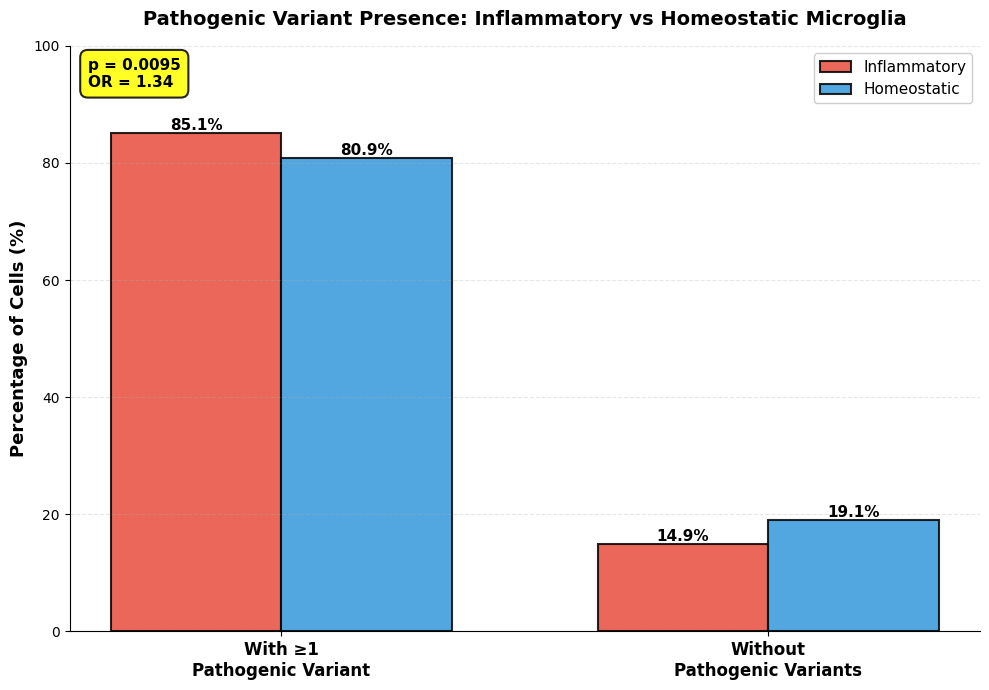


✓ Figure saved to pathogenic_presence_grouped_bars.pdf/png

ANSWER

✓ YES - Inflammatory microglia are significantly MORE LIKELY to carry
  pathogenic variants than homeostatic microglia.

  - Inflammatory: 85.1% of cells affected
  - Homeostatic: 80.9% of cells affected
  - Odds Ratio: 1.344 (inflammatory cells are 34.4% more likely)
  - P-value: 0.0095


In [ ]:
#Are inflammatory microglia cells more likely to carry at least one pathogenic variant compared to homeostatic microglia cells?
#❌ How many pathogenic variants each cell carries (that would need Mann-Whitney U test)

#❌ Which specific pathogenic variants are enriched (that would need individual variant Fisher's tests)

#❌ Whether pathogenic burden differs between groups (that's a different analysis)

#❌ Why inflammatory cells have more pathogenic variants (causation vs correlation)
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt

print("="*80)
print("Do inflammatory microglia carry pathogenic variants more frequently")
print("than homeostatic microglia?")
print("="*80)

# Settings
pathogenic_threshold = 0.716  # APOGEE2 cutoff
vaf_threshold = 0.02  # 2% VAF for calling a variant "present"

print(f"\nSettings:")
print(f"  - Pathogenic threshold: APOGEE2 ≥ {pathogenic_threshold}")
print(f"  - VAF threshold: ≥ {vaf_threshold*100}%")
print(f"  - Test: Fisher's exact test (two-sided)")

# Identify pathogenic variants
pathogenic_indices = []
for i, variant in enumerate(variant_names):
    if variant_info[variant]['pathogenicity'] >= pathogenic_threshold:
        pathogenic_indices.append(i)

pathogenic_indices = np.array(pathogenic_indices)
print(f"\nFound {len(pathogenic_indices)} pathogenic variants (APOGEE2 ≥{pathogenic_threshold})")

# Extract VAF matrix for pathogenic variants only
vaf_pathogenic = vaf_matrix[:, pathogenic_indices]

# For each cell, does it have ≥1 pathogenic variant above threshold?
cells_with_pathogenic = (vaf_pathogenic > vaf_threshold).any(axis=1)

# Split by group
inflammatory_cells = cells_with_pathogenic[group_2_4_6_mask]
homeostatic_cells = cells_with_pathogenic[group_1_3_mask]

# Count cells with/without pathogenic variants
inflammatory_with = inflammatory_cells.sum()
inflammatory_without = len(inflammatory_cells) - inflammatory_with

homeostatic_with = homeostatic_cells.sum()
homeostatic_without = len(homeostatic_cells) - homeostatic_with

# Construct 2x2 contingency table
contingency_table = [
    [inflammatory_with, inflammatory_without],
    [homeostatic_with, homeostatic_without]
]

# Fisher's exact test (two-sided)
odds_ratio, p_value = fisher_exact(contingency_table, alternative='two-sided')

# Calculate proportions
prop_inflammatory = inflammatory_with / len(inflammatory_cells)
prop_homeostatic = homeostatic_with / len(homeostatic_cells)

# Report results
print("\n" + "="*80)
print("RESULTS")
print("="*80)

print(f"\nInflammatory microglia (Groups 2,4,6):")
print(f"  Total cells: {len(inflammatory_cells)}")
print(f"  With ≥1 pathogenic variant: {inflammatory_with} ({prop_inflammatory*100:.1f}%)")
print(f"  Without pathogenic variants: {inflammatory_without} ({(1-prop_inflammatory)*100:.1f}%)")

print(f"\nHomeostatic microglia (Groups 1,3):")
print(f"  Total cells: {len(homeostatic_cells)}")
print(f"  With ≥1 pathogenic variant: {homeostatic_with} ({prop_homeostatic*100:.1f}%)")
print(f"  Without pathogenic variants: {homeostatic_without} ({(1-prop_homeostatic)*100:.1f}%)")

print(f"\n" + "-"*80)
print(f"Fisher's Exact Test:")
print(f"  Odds Ratio: {odds_ratio:.3f}")
print(f"  P-value: {p_value:.4f}")
print(f"  Significance: {'YES' if p_value < 0.05 else 'NO'} (α = 0.05)")
print("-"*80)

# ============================================================================
# GROUPED BAR PLOT (like your second image)
# ============================================================================

fig, ax = plt.subplots(figsize=(10, 7))

# Categories on x-axis
categories = ['With ≥1\nPathogenic Variant', 'Without\nPathogenic Variants']

# Data for each group (as percentages)
inflammatory_data = [prop_inflammatory * 100, (1-prop_inflammatory) * 100]
homeostatic_data = [prop_homeostatic * 100, (1-prop_homeostatic) * 100]

x = np.arange(len(categories))
width = 0.35

# Create grouped bars
bars1 = ax.bar(x - width/2, inflammatory_data, width, label='Inflammatory',
              color='#e74c3c', edgecolor='black', linewidth=1.5, alpha=0.85)
bars2 = ax.bar(x + width/2, homeostatic_data, width, label='Homeostatic',
              color='#3498db', edgecolor='black', linewidth=1.5, alpha=0.85)

# Add value labels on bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.1f}%',
               ha='center', va='bottom', fontsize=11, fontweight='bold')

# Axis labels and title
ax.set_ylabel('Percentage of Cells (%)', fontsize=13, fontweight='bold')
ax.set_title('Pathogenic Variant Presence: Inflammatory vs Homeostatic Microglia',
            fontsize=14, fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(categories, fontsize=12, fontweight='bold')
ax.legend(fontsize=11, loc='upper right', framealpha=0.95)
ax.set_ylim(0, 100)

# Clean up spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Add statistics box
stats_text = (f"p = {p_value:.4f}\n"
             f"OR = {odds_ratio:.2f}")
ax.text(0.02, 0.98, stats_text,
       transform=ax.transAxes, fontsize=11, fontweight='bold',
       verticalalignment='top', horizontalalignment='left',
       bbox=dict(boxstyle='round,pad=0.5', 
                facecolor='yellow' if p_value < 0.05 else 'white',
                alpha=0.85, edgecolor='black', linewidth=1.5))

plt.tight_layout()
plt.savefig('pathogenic_presence_grouped_bars.pdf', dpi=300, bbox_inches='tight')
plt.savefig('pathogenic_presence_grouped_bars.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Figure saved to pathogenic_presence_grouped_bars.pdf/png")

# Final answer
print("\n" + "="*80)
print("ANSWER")
print("="*80)

if p_value < 0.05:
    print(f"\n✓ YES - Inflammatory microglia are significantly MORE LIKELY to carry")
    print(f"  pathogenic variants than homeostatic microglia.")
    print(f"\n  - Inflammatory: {prop_inflammatory*100:.1f}% of cells affected")
    print(f"  - Homeostatic: {prop_homeostatic*100:.1f}% of cells affected")
    print(f"  - Odds Ratio: {odds_ratio:.3f} (inflammatory cells are {(odds_ratio-1)*100:.1f}% more likely)")
    print(f"  - P-value: {p_value:.4f}")
else:
    print(f"\n✗ NO - No significant difference in pathogenic variant presence")
    print(f"  - P-value: {p_value:.4f} (not significant at α=0.05)")

print("="*80)


Do inflammatory microglia carry higher AGGREGATE pathogenic burden?

Filtering to pathogenic variants (APOGEE2 ≥ 0.716)
  Total variants: 44436
  Pathogenic variants: 3521

TECHNICAL CONTROL: Total mtDNA variant load
Inflammatory: 12.48 ± 4.52
Homeostatic: 11.86 ± 5.07
Mann-Whitney p = 0.0069

⚠️  WARNING: Sequencing depth differs - normalization REQUIRED

RESULTS

RAW BURDEN:
  Inflammatory: 0.3062 ± 0.2355
  Homeostatic: 0.2810 ± 0.2201
  p = 0.0108, FC = 1.090x, Cohen's d = 0.111

NORMALIZED BURDEN (corrected for sequencing depth):
  Inflammatory: 0.0240 ± 0.0362
  Homeostatic: 0.0225 ± 0.0343
  p = 0.0209, FC = 1.067x, Cohen's d = 0.043


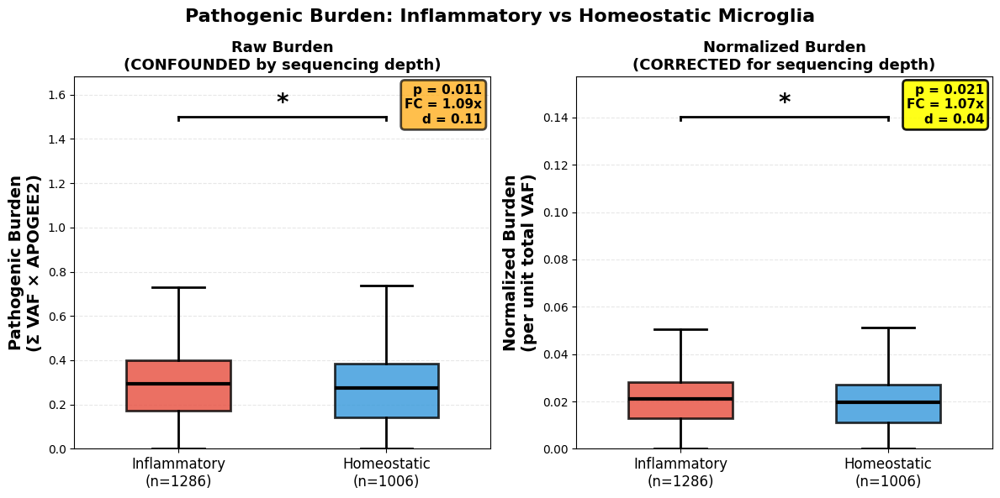


✓ Figure saved to pathogenic_burden_boxplots.pdf/png

FINAL ANSWER

✓ YES - Inflammatory microglia carry significantly higher pathogenic burden

  After controlling for sequencing depth:
    - Fold change: 1.067x (6.7% higher)
    - Cohen's d: 0.043 (small effect)
    - P-value: 0.0209

  This indicates inflammatory cells have a higher PROPORTION of
  pathogenic variants, not just more variants overall.


In [128]:
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt

print("="*80)
print("Do inflammatory microglia carry higher AGGREGATE pathogenic burden?")
print("="*80)

# Filter to pathogenic variants only
pathogenic_threshold = 0.716
pathogenicity_scores = np.array([variant_info[v]['pathogenicity'] for v in variant_names])
pathogenic_mask = pathogenicity_scores >= pathogenic_threshold

print(f"\nFiltering to pathogenic variants (APOGEE2 ≥ {pathogenic_threshold})")
print(f"  Total variants: {len(variant_names)}")
print(f"  Pathogenic variants: {pathogenic_mask.sum()}")

# Extract pathogenic variants only
vaf_pathogenic = vaf_matrix[:, pathogenic_mask]
scores_pathogenic = pathogenicity_scores[pathogenic_mask]

# Calculate raw pathogenic burden
cell_pathogenic_burden_raw = np.dot(vaf_pathogenic, scores_pathogenic)

# Technical control for sequencing depth
total_vaf_per_cell = vaf_matrix.sum(axis=1)
total_vaf_inflam = total_vaf_per_cell[group_2_4_6_mask]
total_vaf_homeo = total_vaf_per_cell[group_1_3_mask]

print(f"\n" + "="*80)
print("TECHNICAL CONTROL: Total mtDNA variant load")
print("="*80)
print(f"Inflammatory: {total_vaf_inflam.mean():.2f} ± {total_vaf_inflam.std():.2f}")
print(f"Homeostatic: {total_vaf_homeo.mean():.2f} ± {total_vaf_homeo.std():.2f}")

stat_tech, p_tech = mannwhitneyu(total_vaf_inflam, total_vaf_homeo)
print(f"Mann-Whitney p = {p_tech:.4f}")

if p_tech < 0.05:
    print(f"\n⚠️  WARNING: Sequencing depth differs - normalization REQUIRED")
else:
    print(f"\n✓ No technical confound detected")

# Normalize burden by total VAF
cell_pathogenic_burden_normalized = cell_pathogenic_burden_raw / (total_vaf_per_cell + 1e-10)

# Split by group
burden_inflam_raw = cell_pathogenic_burden_raw[group_2_4_6_mask]
burden_homeo_raw = cell_pathogenic_burden_raw[group_1_3_mask]

burden_inflam_norm = cell_pathogenic_burden_normalized[group_2_4_6_mask]
burden_homeo_norm = cell_pathogenic_burden_normalized[group_1_3_mask]

# Statistics
stat_raw, p_raw = mannwhitneyu(burden_inflam_raw, burden_homeo_raw, alternative='two-sided')
fc_raw = burden_inflam_raw.mean() / burden_homeo_raw.mean()
cohen_d_raw = (burden_inflam_raw.mean() - burden_homeo_raw.mean()) / np.sqrt(
    (burden_inflam_raw.std()**2 + burden_homeo_raw.std()**2) / 2
)

stat_norm, p_norm = mannwhitneyu(burden_inflam_norm, burden_homeo_norm, alternative='two-sided')
fc_norm = burden_inflam_norm.mean() / burden_homeo_norm.mean()
cohen_d_norm = (burden_inflam_norm.mean() - burden_homeo_norm.mean()) / np.sqrt(
    (burden_inflam_norm.std()**2 + burden_homeo_norm.std()**2) / 2
)

# Print results
print("\n" + "="*80)
print("RESULTS")
print("="*80)

print(f"\nRAW BURDEN:")
print(f"  Inflammatory: {burden_inflam_raw.mean():.4f} ± {burden_inflam_raw.std():.4f}")
print(f"  Homeostatic: {burden_homeo_raw.mean():.4f} ± {burden_homeo_raw.std():.4f}")
print(f"  p = {p_raw:.4f}, FC = {fc_raw:.3f}x, Cohen's d = {cohen_d_raw:.3f}")

print(f"\nNORMALIZED BURDEN (corrected for sequencing depth):")
print(f"  Inflammatory: {burden_inflam_norm.mean():.4f} ± {burden_inflam_norm.std():.4f}")
print(f"  Homeostatic: {burden_homeo_norm.mean():.4f} ± {burden_homeo_norm.std():.4f}")
print(f"  p = {p_norm:.4f}, FC = {fc_norm:.3f}x, Cohen's d = {cohen_d_norm:.3f}")

# ============================================================================
# VISUALIZATION WITH COMPACT BRACKETS
# ============================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Panel A: Raw burden
bp1 = ax1.boxplot([burden_inflam_raw, burden_homeo_raw], 
                   positions=[1, 2], widths=0.5,
                   patch_artist=True, 
                   showfliers=False,
                   notch=False,
                   boxprops=dict(linewidth=2),
                   medianprops=dict(color='black', linewidth=3),
                   whiskerprops=dict(linewidth=2),
                   capprops=dict(linewidth=2))

bp1['boxes'][0].set_facecolor('#e74c3c')
bp1['boxes'][0].set_alpha(0.8)
bp1['boxes'][1].set_facecolor('#3498db')
bp1['boxes'][1].set_alpha(0.8)

ax1.set_ylabel('Pathogenic Burden\n(Σ VAF × APOGEE2)', fontsize=14, fontweight='bold')
ax1.set_title('Raw Burden\n(CONFOUNDED by sequencing depth)', fontsize=13, fontweight='bold')
ax1.set_xticks([1, 2])
ax1.set_xticklabels(['Inflammatory\n(n=1286)', 'Homeostatic\n(n=1006)'], fontsize=12)
ax1.grid(axis='y', alpha=0.3, linestyle='--')

# BETTER: Compact bracket just above whiskers
y_max_whisker = np.percentile(burden_inflam_raw, 99.5)  # Top of whisker range
y_bracket = y_max_whisker * 1.08  # Only 8% above
h = y_bracket * 0.01  # Small tick height

ax1.plot([1, 2], [y_bracket, y_bracket], 'k-', linewidth=2)
ax1.plot([1, 1], [y_bracket-h, y_bracket], 'k-', linewidth=2)
ax1.plot([2, 2], [y_bracket-h, y_bracket], 'k-', linewidth=2)
sig_text = '*' if p_raw < 0.05 else 'ns'
ax1.text(1.5, y_bracket + h*2, sig_text, ha='center', fontsize=20, fontweight='bold')

# Set reasonable y-limit
ax1.set_ylim(0, y_bracket * 1.12)

# Stats box
stats_text = f"p = {p_raw:.3f}\nFC = {fc_raw:.2f}x\nd = {cohen_d_raw:.2f}"
ax1.text(0.98, 0.98, stats_text, transform=ax1.transAxes,
        fontsize=11, fontweight='bold', verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='orange', alpha=0.7, edgecolor='black', linewidth=2))

# Panel B: Normalized burden
bp2 = ax2.boxplot([burden_inflam_norm, burden_homeo_norm], 
                   positions=[1, 2], widths=0.5,
                   patch_artist=True, 
                   showfliers=False,
                   notch=False,
                   boxprops=dict(linewidth=2),
                   medianprops=dict(color='black', linewidth=3),
                   whiskerprops=dict(linewidth=2),
                   capprops=dict(linewidth=2))

bp2['boxes'][0].set_facecolor('#e74c3c')
bp2['boxes'][0].set_alpha(0.8)
bp2['boxes'][1].set_facecolor('#3498db')
bp2['boxes'][1].set_alpha(0.8)

ax2.set_ylabel('Normalized Burden\n(per unit total VAF)', fontsize=14, fontweight='bold')
ax2.set_title('Normalized Burden\n(CORRECTED for sequencing depth)', fontsize=13, fontweight='bold')
ax2.set_xticks([1, 2])
ax2.set_xticklabels(['Inflammatory\n(n=1286)', 'Homeostatic\n(n=1006)'], fontsize=12)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

# BETTER: Compact bracket
y_max_whisker_norm = np.percentile(burden_inflam_norm, 99.5)
y_bracket_norm = y_max_whisker_norm * 1.08
h_norm = y_bracket_norm * 0.01

ax2.plot([1, 2], [y_bracket_norm, y_bracket_norm], 'k-', linewidth=2)
ax2.plot([1, 1], [y_bracket_norm-h_norm, y_bracket_norm], 'k-', linewidth=2)
ax2.plot([2, 2], [y_bracket_norm-h_norm, y_bracket_norm], 'k-', linewidth=2)
sig_text_norm = '*' if p_norm < 0.05 else 'ns'
ax2.text(1.5, y_bracket_norm + h_norm*2, sig_text_norm, ha='center', fontsize=20, fontweight='bold')

# Set reasonable y-limit
ax2.set_ylim(0, y_bracket_norm * 1.12)

# Stats box
stats_text_norm = f"p = {p_norm:.3f}\nFC = {fc_norm:.2f}x\nd = {cohen_d_norm:.2f}"
color = 'yellow' if p_norm < 0.05 else 'lightgray'
ax2.text(0.98, 0.98, stats_text_norm, transform=ax2.transAxes,
        fontsize=11, fontweight='bold', verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor=color, alpha=0.9, edgecolor='black', linewidth=2))

plt.suptitle('Pathogenic Burden: Inflammatory vs Homeostatic Microglia', 
            fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()

plt.savefig('pathogenic_burden_boxplots.pdf', dpi=300, bbox_inches='tight')
plt.savefig('pathogenic_burden_boxplots.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Figure saved to pathogenic_burden_boxplots.pdf/png")

# Save to AnnData
mgatk.obs['pathogenic_burden_raw'] = cell_pathogenic_burden_raw
mgatk.obs['pathogenic_burden_normalized'] = cell_pathogenic_burden_normalized

# ============================================================================
# FINAL ANSWER
# ============================================================================

print("\n" + "="*80)
print("FINAL ANSWER")
print("="*80)

if p_norm < 0.05:
    print(f"\n✓ YES - Inflammatory microglia carry significantly higher pathogenic burden")
    print(f"\n  After controlling for sequencing depth:")
    print(f"    - Fold change: {fc_norm:.3f}x ({(fc_norm-1)*100:.1f}% higher)")
    print(f"    - Cohen's d: {cohen_d_norm:.3f} ({'small' if abs(cohen_d_norm) < 0.5 else 'medium'} effect)")
    print(f"    - P-value: {p_norm:.4f}")
    print(f"\n  This indicates inflammatory cells have a higher PROPORTION of")
    print(f"  pathogenic variants, not just more variants overall.")
else:
    print(f"\n✗ NO - After normalization, no significant difference (p = {p_norm:.4f})")
    print(f"  The raw difference was due to technical sequencing depth artifact.")

print("="*80)


PATHOGENIC VARIANT ENRICHMENT BY GENE (Q3 METHOD)

Mapping variants to genes...
Found 39 unique genes/regions

Analyzing VAF threshold: 1%...

  Testing individual variants at VAF ≥ 1%...

Analyzing VAF threshold: 3%...

  Testing individual variants at VAF ≥ 3%...

Analyzing VAF threshold: 5%...

  Testing individual variants at VAF ≥ 5%...
  VAF 1%: 13 genes tested, 10 with ≥1 sig. variant
  VAF 3%: 13 genes tested, 12 with ≥1 sig. variant
0 [0.0374462  0.54165755]
1 [0.32471051 0.17765334]
  VAF 5%: 13 genes tested, 7 with ≥1 sig. variant


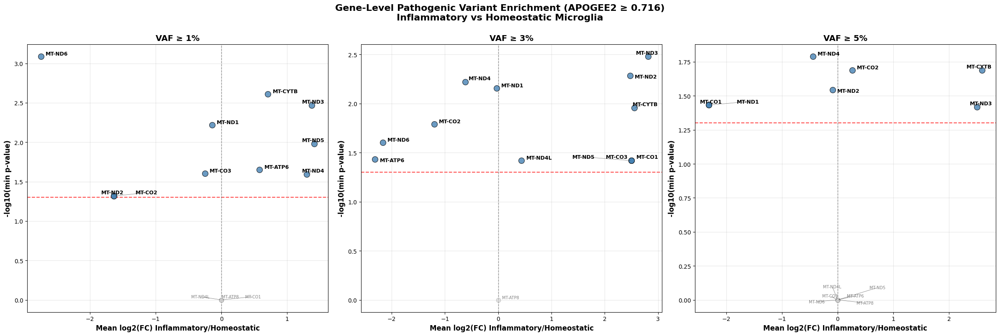


DETAILED RESULTS FOR VAF ≥ 3%

Genes with significant pathogenic variant enrichment:
   gene  n_variants_tested  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc  min_p_value
 MT-ND3                 45               2               2              0     2.817904     0.003304
 MT-ND2                 85               1               1              0     2.477948     0.005188
 MT-ND4                163               6               2              4    -0.618207     0.006036
 MT-ND1                186               7               3              4    -0.026791     0.006953
MT-CYTB                 90               2               2              0     2.556264     0.011085
 MT-CO2                 66               5               1              4    -1.198559     0.016199
 MT-ND6                 39               1               0              1    -2.162517     0.025049
MT-ATP6                 44               1               0              1    -2.315028     0.036989
 MT-CO1       

In [96]:
# Import required libraries
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text




print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT BY GENE (Q3 METHOD)")
print("=" * 70)




# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}




# Map variants to genes
print("\nMapping variants to genes...")
variant_to_gene = {}
for variant_name in variant_names:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        variant_to_gene[variant_name] = assigned_gene
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'




gene_annotations = np.array([variant_to_gene.get(v, 'intergenic') for v in variant_names])
unique_genes = sorted(set(gene_annotations))
print(f"Found {len(unique_genes)} unique genes/regions")




# Settings
VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prevalence = 0.5
pathogenic_threshold = 0.716




# Q3 Analysis function
def analyze_gene_enrichment_q3(vaf_matrix, gene_annotations, vaf_threshold):
    print(f"\n  Testing individual variants at VAF ≥ {vaf_threshold*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names):
        apogee_score = variant_info[variant]['pathogenicity']
        if apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        if gene == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })
    
    df_variants = pd.DataFrame(variant_results)
    
    if len(df_variants) == 0:
        return pd.DataFrame()
    
    df_sig = df_variants[df_variants['p_value'] < 0.05]
    
    gene_results = []
    
    for gene in unique_genes:
        if gene == 'intergenic':
            continue
        
        gene_all = df_variants[df_variants['gene'] == gene]
        gene_sig = df_sig[df_sig['gene'] == gene]
        
        if len(gene_all) == 0:
            continue
        
        n_tested = len(gene_all)
        n_sig = len(gene_sig)
        
        if n_sig == 0:
            gene_results.append({
                'gene': gene,
                'n_variants_tested': n_tested,
                'n_sig_variants': 0,
                'n_inflammatory': 0,
                'n_homeostatic': 0,
                'mean_log2fc': 0,
                'min_p_value': 1.0
            })
            continue
        
        n_inflammatory = (gene_sig['log2FC'] > 0).sum()
        n_homeostatic = (gene_sig['log2FC'] < 0).sum()
        
        mean_log2fc = gene_sig['log2FC'].mean()
        min_p = gene_sig['p_value'].min()
        
        gene_results.append({
            'gene': gene,
            'n_variants_tested': n_tested,
            'n_sig_variants': n_sig,
            'n_inflammatory': n_inflammatory,
            'n_homeostatic': n_homeostatic,
            'mean_log2fc': mean_log2fc,
            'min_p_value': min_p
        })
    
    df_genes = pd.DataFrame(gene_results)
    df_genes['net_enrichment'] = df_genes['n_inflammatory'] - df_genes['n_homeostatic']
    df_genes['neg_log10_p'] = -np.log10(df_genes['min_p_value'] + 1e-300)
    
    return df_genes




# Run analysis
results_by_threshold = {}
for vaf_thresh in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF threshold: {vaf_thresh*100:.0f}%...")
    results_by_threshold[vaf_thresh] = analyze_gene_enrichment_q3(vaf_matrix, gene_annotations, vaf_thresh)




# Volcano plots with connecting lines/arrows for displaced labels
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
alpha = 0.05
neg_log10_alpha = -np.log10(alpha)




for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    ax = axes[idx]
    df_genes = results_by_threshold[vaf_thresh]
    
    if len(df_genes) == 0:
        ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%')
        continue
    
    # Separate significant and non-significant for different coloring
    df_sig = df_genes[df_genes['n_sig_variants'] > 0]
    df_nonsig = df_genes[df_genes['n_sig_variants'] == 0]
    
    # Plot non-significant genes in gray
    if len(df_nonsig) > 0:
        ax.scatter(df_nonsig['mean_log2fc'],
                   df_nonsig['neg_log10_p'],
                   s=60, c='lightgray', edgecolor='gray', linewidth=0.5, alpha=0.6, zorder=1)
    
    # Plot significant genes in blue
    if len(df_sig) > 0:
        ax.scatter(df_sig['mean_log2fc'],
                   df_sig['neg_log10_p'],
                   s=100, c='steelblue', edgecolor='black', linewidth=0.8, alpha=0.8, zorder=2)
    
    ax.axhline(neg_log10_alpha, color='red', linestyle='--', linewidth=1.5, alpha=0.7, zorder=0)
    ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.5, zorder=0)
    
    # Annotate ALL genes
    texts = []
    for _, row in df_genes.iterrows():
        # Make significant genes bold and slightly larger
        if row['n_sig_variants'] > 0:
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          row['gene'], fontsize=9, fontweight='bold', zorder=3)
        else:
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          row['gene'], fontsize=7, color='gray', zorder=3)
        texts.append(text)
    
    # Adjust text positions with visible arrows/connecting lines
    adjust_text(texts, ax=ax,
                # Arrow properties - these create the "sticks"
                arrowprops=dict(arrowstyle='-', color='black', lw=0.5, alpha=0.6),
                # Force parameters - how much to push things apart
                force_text=(0.5, 0.5),
                force_points=(0.2, 0.2),
                expand_points=(2, 2),
                expand_text=(1.5, 1.5),
                # Make sure arrows are always drawn
                only_move={'points': 'xy', 'text': 'xy'},
                lim=500)
    
    ax.set_xlabel('Mean log2(FC) Inflammatory/Homeostatic', fontsize=12, fontweight='bold')
    ax.set_ylabel('-log10(min p-value)', fontsize=12, fontweight='bold')
    ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%', fontsize=14, fontweight='bold')
    ax.grid(alpha=0.3, zorder=0)
    
    n_sig_genes = (df_genes['n_sig_variants'] > 0).sum()
    print(f"  VAF {vaf_thresh*100:.0f}%: {len(df_genes)} genes tested, {n_sig_genes} with ≥1 sig. variant")




plt.suptitle('Gene-Level Pathogenic Variant Enrichment (APOGEE2 ≥ 0.716)\nInflammatory vs Homeostatic Microglia',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()




# Print results
print("\n" + "=" * 70)
print("DETAILED RESULTS FOR VAF ≥ 3%")
print("=" * 70)
df_3pct = results_by_threshold[0.03]
sig_genes_3pct = df_3pct[df_3pct['n_sig_variants'] > 0].sort_values('min_p_value')



print("\nGenes with significant pathogenic variant enrichment:")
print(sig_genes_3pct[['gene', 'n_variants_tested', 'n_sig_variants', 
                       'n_inflammatory', 'n_homeostatic', 'mean_log2fc', 
                       'min_p_value']].to_string(index=False))



print(f"\n{len(sig_genes_3pct)} genes have at least one significantly enriched pathogenic variant")
print(f"Tested {len(df_3pct)} genes total")


PATHOGENIC VARIANT ENRICHMENT BY GENE (LOLLIPOP PLOTS)

Mapping variants to genes...
Found 39 unique genes/regions

Analyzing VAF ≥ 1%...

Analyzing VAF ≥ 3%...

Analyzing VAF ≥ 5%...
  VAF 1%: 10 genes with ≥1 significant variant
  VAF 3%: 12 genes with ≥1 significant variant
  VAF 5%: 7 genes with ≥1 significant variant


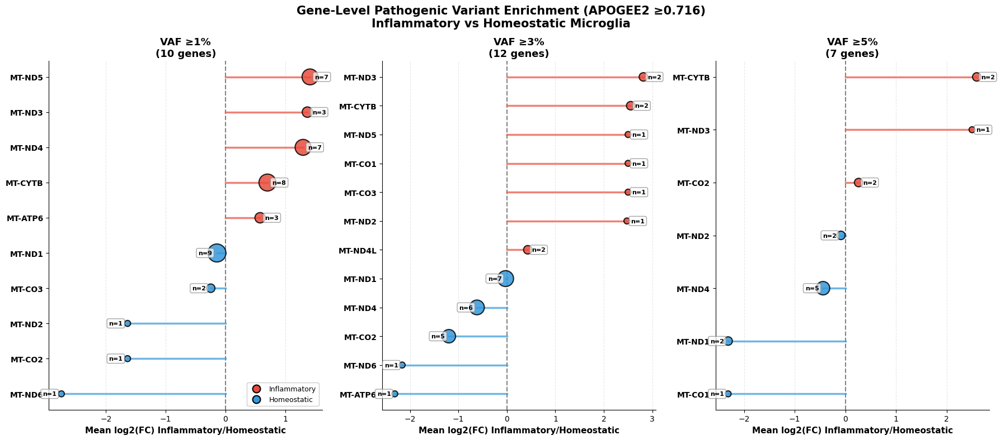


✓ Lollipop plots saved to gene_pathogenic_enrichment_lollipop_3panels.pdf/png

DETAILED RESULTS FOR VAF ≥ 3%
   gene  n_variants_tested  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc  min_p_value
 MT-ND3                 45               2               2              0     2.817904     0.003304
MT-CYTB                 90               2               2              0     2.556264     0.011085
 MT-CO1                 44               1               1              0     2.502236     0.038131
 MT-CO3                 25               1               1              0     2.502236     0.038131
 MT-ND5                234               1               1              0     2.502236     0.038131
 MT-ND2                 85               1               1              0     2.477948     0.005188
MT-ND4L                 32               2               1              1     0.431613     0.038131
 MT-ND1                186               7               3              4    -0.026791    

In [130]:
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt

print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT BY GENE (LOLLIPOP PLOTS)")
print("=" * 70)

# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

# Map variants to genes
print("\nMapping variants to genes...")
variant_to_gene = {}
for variant_name in variant_names:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        variant_to_gene[variant_name] = assigned_gene
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'

gene_annotations = np.array([variant_to_gene.get(v, 'intergenic') for v in variant_names])
unique_genes = sorted(set(gene_annotations))
print(f"Found {len(unique_genes)} unique genes/regions")

# Settings
VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prevalence = 0.5
pathogenic_threshold = 0.716

# Analysis function
def analyze_gene_enrichment(vaf_threshold):
    print(f"\nAnalyzing VAF ≥ {vaf_threshold*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names):
        apogee_score = variant_info[variant]['pathogenicity']
        if apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        if gene == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })
    
    df_variants = pd.DataFrame(variant_results)
    
    if len(df_variants) == 0:
        return pd.DataFrame()
    
    df_sig = df_variants[df_variants['p_value'] < 0.05]
    
    # Gene-level aggregation
    gene_results = []
    
    for gene in unique_genes:
        if gene == 'intergenic':
            continue
        
        gene_all = df_variants[df_variants['gene'] == gene]
        gene_sig = df_sig[df_sig['gene'] == gene]
        
        if len(gene_all) == 0:
            continue
        
        n_tested = len(gene_all)
        n_sig = len(gene_sig)
        
        if n_sig == 0:
            continue  # Skip genes with no significant variants
        
        n_inflammatory = (gene_sig['log2FC'] > 0).sum()
        n_homeostatic = (gene_sig['log2FC'] < 0).sum()
        
        mean_log2fc = gene_sig['log2FC'].mean()
        min_p = gene_sig['p_value'].min()
        
        gene_results.append({
            'gene': gene,
            'n_variants_tested': n_tested,
            'n_sig_variants': n_sig,
            'n_inflammatory': n_inflammatory,
            'n_homeostatic': n_homeostatic,
            'mean_log2fc': mean_log2fc,
            'min_p_value': min_p
        })
    
    df_genes = pd.DataFrame(gene_results)
    return df_genes

# Run analysis for all thresholds
results_by_threshold = {}
for vaf_thresh in VAF_THRESHOLDS:
    results_by_threshold[vaf_thresh] = analyze_gene_enrichment(vaf_thresh)

# ============================================================================
# LOLLIPOP PLOTS (3 PANELS)
# ============================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 8))

for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    ax = axes[idx]
    df_genes = results_by_threshold[vaf_thresh]
    
    if len(df_genes) == 0:
        ax.text(0.5, 0.5, 'No significant genes', ha='center', va='center',
               transform=ax.transAxes, fontsize=12)
        ax.set_title(f'VAF ≥{vaf_thresh*100:.0f}%', fontsize=13, fontweight='bold')
        ax.set_xlabel('Mean log2(FC)')
        continue
    
    # Sort by mean log2FC
    df_genes = df_genes.sort_values('mean_log2fc', ascending=True).reset_index(drop=True)
    
    y_positions = np.arange(len(df_genes))
    
    # Color by direction
    colors = ['#e74c3c' if fc > 0 else '#3498db' for fc in df_genes['mean_log2fc']]
    
    # Draw stems (lollipop sticks)
    for i, (idx_row, row) in enumerate(df_genes.iterrows()):
        ax.plot([0, row['mean_log2fc']], [i, i], 
               color=colors[i], linewidth=2.5, alpha=0.7, zorder=1)
    
    # Draw lollipop heads
    sizes = df_genes['n_sig_variants'] * 60
    ax.scatter(df_genes['mean_log2fc'], y_positions,
              s=sizes, c=colors, edgecolor='black', linewidth=1.5,
              alpha=0.85, zorder=2)
    
    # Vertical reference line at x=0
    ax.axvline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.5, zorder=0)
    
    # Y-axis labels
    ax.set_yticks(y_positions)
    ax.set_yticklabels(df_genes['gene'], fontsize=10, fontweight='bold')
    
    # Axis labels
    ax.set_xlabel('Mean log2(FC) Inflammatory/Homeostatic', fontsize=11, fontweight='bold')
    ax.set_title(f'VAF ≥{vaf_thresh*100:.0f}%\n({len(df_genes)} genes)', 
                fontsize=13, fontweight='bold')
    
    # Add n= annotations
    for i, (idx_row, row) in enumerate(df_genes.iterrows()):
        x_pos = row['mean_log2fc']
        offset = 0.08 if x_pos > 0 else -0.08
        ha = 'left' if x_pos > 0 else 'right'
        ax.text(x_pos + offset, i, f"n={int(row['n_sig_variants'])}", 
               ha=ha, va='center', fontsize=8, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                        edgecolor='gray', alpha=0.7))
    
    # Grid and spines
    ax.grid(axis='x', alpha=0.3, linestyle='--')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Only show legend on first panel
    if idx == 0:
        from matplotlib.lines import Line2D
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#e74c3c', 
                   markersize=10, label='Inflammatory', markeredgecolor='black', markeredgewidth=1.5),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#3498db',
                   markersize=10, label='Homeostatic', markeredgecolor='black', markeredgewidth=1.5)
        ]
        ax.legend(handles=legend_elements, loc='lower right', framealpha=0.95, fontsize=9)
    
    print(f"  VAF {vaf_thresh*100:.0f}%: {len(df_genes)} genes with ≥1 significant variant")

plt.suptitle(f'Gene-Level Pathogenic Variant Enrichment (APOGEE2 ≥{pathogenic_threshold})\n' +
            'Inflammatory vs Homeostatic Microglia',
            fontsize=15, fontweight='bold', y=0.98)
plt.tight_layout()

plt.savefig('gene_pathogenic_enrichment_lollipop_3panels.pdf', dpi=300, bbox_inches='tight')
plt.savefig('gene_pathogenic_enrichment_lollipop_3panels.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Lollipop plots saved to gene_pathogenic_enrichment_lollipop_3panels.pdf/png")

# Print detailed results for VAF 3%
print("\n" + "=" * 70)
print("DETAILED RESULTS FOR VAF ≥ 3%")
print("=" * 70)
df_3pct = results_by_threshold[0.03]
if len(df_3pct) > 0:
    print(df_3pct.sort_values('mean_log2fc', ascending=False)[
        ['gene', 'n_variants_tested', 'n_sig_variants', 
         'n_inflammatory', 'n_homeostatic', 'mean_log2fc', 
         'min_p_value']].to_string(index=False))
else:
    print("No genes with significant enrichment at 3% VAF")


Comparing 13 genes across all three thresholds

Found 12 genes with ≥1 significant variant at any threshold


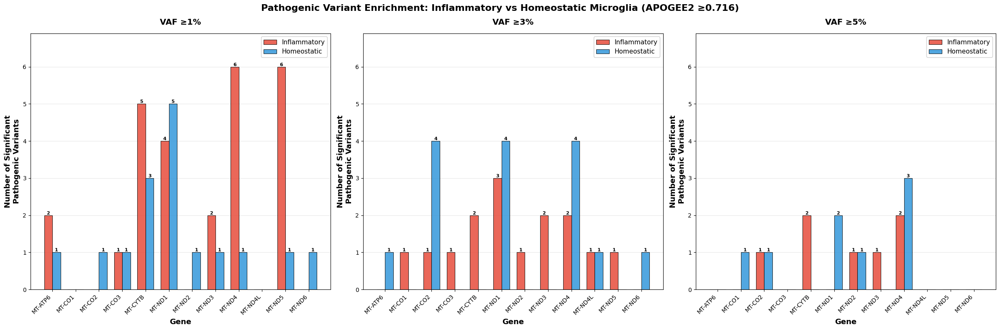


✓ Bar plots saved to gene_variant_enrichment_barplot.pdf/png

SUMMARY TABLE: SIGNIFICANT VARIANTS BY GENE AND THRESHOLD
   Gene  Inflam 1%  Homeo 1%  Inflam 3%  Homeo 3%  Inflam 5%  Homeo 5%
MT-ATP6          2         1          0         1          0         0
 MT-CO1          0         0          1         0          0         1
 MT-CO2          0         1          1         4          1         1
 MT-CO3          1         1          1         0          0         0
MT-CYTB          5         3          2         0          2         0
 MT-ND1          4         5          3         4          0         2
 MT-ND2          0         1          1         0          1         1
 MT-ND3          2         1          2         0          1         0
 MT-ND4          6         1          2         4          2         3
MT-ND4L          0         0          1         1          0         0
 MT-ND5          6         1          1         0          0         0
 MT-ND6          0         

In [105]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Get results at all three thresholds
df_1pct = results_by_threshold[0.01]
df_3pct = results_by_threshold[0.03]
df_5pct = results_by_threshold[0.05]

# Merge all three on gene name
df_compare = df_1pct.merge(df_3pct, on='gene', suffixes=('_1pct', '_3pct'))
df_compare = df_compare.merge(df_5pct, on='gene')
df_compare.rename(columns={
    'n_sig_variants': 'n_sig_variants_5pct',
    'n_inflammatory': 'n_inflammatory_5pct',
    'n_homeostatic': 'n_homeostatic_5pct',
    'mean_log2fc': 'mean_log2fc_5pct',
    'min_p_value': 'min_p_value_5pct'
}, inplace=True)

print(f"Comparing {len(df_compare)} genes across all three thresholds")

# Filter to genes with at least one significant variant at any threshold
df_sig_genes = df_compare[
    (df_compare['n_sig_variants_1pct'] > 0) | 
    (df_compare['n_sig_variants_3pct'] > 0) | 
    (df_compare['n_sig_variants_5pct'] > 0)
].copy()

print(f"\nFound {len(df_sig_genes)} genes with ≥1 significant variant at any threshold")

# Create 3-panel figure (one per VAF threshold)
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

genes = df_sig_genes['gene'].tolist()
x = np.arange(len(genes))
width = 0.35

# Define threshold data
thresholds = [
    ('1%', 0, df_sig_genes['n_inflammatory_1pct'].values, df_sig_genes['n_homeostatic_1pct'].values),
    ('3%', 1, df_sig_genes['n_inflammatory_3pct'].values, df_sig_genes['n_homeostatic_3pct'].values),
    ('5%', 2, df_sig_genes['n_inflammatory_5pct'].values, df_sig_genes['n_homeostatic_5pct'].values)
]

for thresh_name, idx, inflam_counts, homeo_counts in thresholds:
    ax = axes[idx]
    
    # Create bars
    bars1 = ax.bar(x - width/2, inflam_counts, width, label='Inflammatory', 
                   color='#e74c3c', edgecolor='black', linewidth=0.8, alpha=0.85)
    bars2 = ax.bar(x + width/2, homeo_counts, width, label='Homeostatic',
                   color='#3498db', edgecolor='black', linewidth=0.8, alpha=0.85)
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{int(height)}',
                       ha='center', va='bottom', fontsize=8, fontweight='bold')
    
    ax.set_xlabel('Gene', fontsize=13, fontweight='bold')
    ax.set_ylabel('Number of Significant\nPathogenic Variants', fontsize=13, fontweight='bold')
    ax.set_title(f'VAF ≥{thresh_name}', fontsize=14, fontweight='bold', pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(genes, rotation=45, ha='right', fontsize=10)
    ax.legend(loc='upper right', fontsize=11, framealpha=0.95)
    ax.grid(axis='y', alpha=0.3, zorder=0)
    ax.set_axisbelow(True)
    
    # Set same y-axis limits across all panels for easier comparison
    if idx == 0:
        max_y = max(inflam_counts.max(), homeo_counts.max())
        for thresh_data in thresholds:
            max_y = max(max_y, thresh_data[2].max(), thresh_data[3].max())
        global_max_y = max_y * 1.15  # Add 15% headroom for labels

for ax in axes:
    ax.set_ylim(0, global_max_y)

plt.suptitle('Pathogenic Variant Enrichment: Inflammatory vs Homeostatic Microglia (APOGEE2 ≥0.716)',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()

plt.savefig('gene_variant_enrichment_barplot.pdf', dpi=300, bbox_inches='tight')
plt.savefig('gene_variant_enrichment_barplot.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Bar plots saved to gene_variant_enrichment_barplot.pdf/png")

# Print summary table
print("\n" + "="*70)
print("SUMMARY TABLE: SIGNIFICANT VARIANTS BY GENE AND THRESHOLD")
print("="*70)
summary_table = df_sig_genes[['gene', 
                               'n_inflammatory_1pct', 'n_homeostatic_1pct',
                               'n_inflammatory_3pct', 'n_homeostatic_3pct',
                               'n_inflammatory_5pct', 'n_homeostatic_5pct']]
summary_table.columns = ['Gene', 
                         'Inflam 1%', 'Homeo 1%',
                         'Inflam 3%', 'Homeo 3%',
                         'Inflam 5%', 'Homeo 5%']
print(summary_table.to_string(index=False))


VARIANT-LEVEL ANALYSIS FOR ALL GENES

Analyzing 13 genes total

  12 genes with ≥1 significant variant
  1 genes with NO significant variants


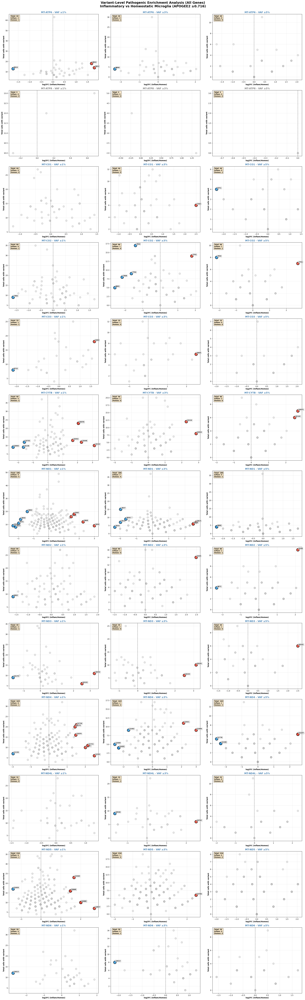


✓ Saved all_genes_variant_details.pdf/png

VARIANT MATRIX: WHICH VARIANTS ARE TESTED AT EACH THRESHOLD

✓ Saved variant_enrichment_matrix_all_genes.csv

Variant Enrichment Summary (first 50 rows):
   gene  position   VAF1%  VAF3%  VAF5%
MT-ATP6      8647  Inflam Inflam Inflam
MT-ATP6      8741  Inflam  Homeo  Homeo
MT-ATP6      8741  Inflam Inflam Inflam
MT-ATP6      8786  Inflam Inflam Inflam
MT-ATP6      8786  Inflam Inflam Inflam
MT-ATP6      8789  Inflam Inflam Inflam
MT-ATP6      8792  Inflam  Homeo  Homeo
MT-ATP6      8831   Homeo Inflam Inflam
MT-ATP6      8840   Homeo  Homeo  Homeo
MT-ATP6      8851  Inflam Inflam Inflam
MT-ATP6      8873  Inflam Inflam Inflam
MT-ATP6      8890   Homeo Homeo*  Homeo
MT-ATP6      8900  Inflam Inflam Inflam
MT-ATP6      8915  Inflam Inflam Inflam
MT-ATP6      8915  Inflam Inflam  Homeo
MT-ATP6      8927   Homeo  Homeo Inflam
MT-ATP6      8927  Inflam Inflam Inflam
MT-ATP6      8936   Homeo  Homeo  Homeo
MT-ATP6      8948  Inflam Inflam Inflam
MT

In [107]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

print("="*70)
print("VARIANT-LEVEL ANALYSIS FOR ALL GENES")
print("="*70)

def get_variant_details_for_gene(gene, vaf_threshold):
    """Get detailed info about ALL variants in a gene at a given VAF threshold (sig and non-sig)"""
    
    variant_details = []
    
    for i, variant in enumerate(variant_names):
        if variant_to_gene.get(variant, 'intergenic') != gene:
            continue
        
        apogee_score = variant_info[variant]['pathogenicity']
        if apogee_score < pathogenic_threshold:
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_details.append({
            'variant': variant,
            'position': int(variant.split('-')[1]) if '-' in variant else 0,
            'n_inflam': g246_with,
            'n_homeo': g13_with,
            'prop_inflam': prop_g246,
            'prop_homeo': prop_g13,
            'log2FC': log2fc,
            'p_value': p_value,
            'odds_ratio': odds_ratio,
            'apogee2': apogee_score,
            'significant': p_value < 0.05
        })
    
    return pd.DataFrame(variant_details)

# Get ALL genes from df_compare (includes those with and without sig variants)
all_genes = df_compare['gene'].tolist()
print(f"\nAnalyzing {len(all_genes)} genes total\n")

# Categorize genes
genes_with_sig = df_sig_genes['gene'].tolist()
genes_without_sig = [g for g in all_genes if g not in genes_with_sig]

print(f"  {len(genes_with_sig)} genes with ≥1 significant variant")
print(f"  {len(genes_without_sig)} genes with NO significant variants")

# PLOT 1: Variant scatter plots (log2FC vs cell count)
fig = plt.figure(figsize=(24, 6*len(all_genes)))

for gene_idx, gene in enumerate(all_genes):
    # Get variant data at all three thresholds
    df_1 = get_variant_details_for_gene(gene, 0.01)
    df_3 = get_variant_details_for_gene(gene, 0.03)
    df_5 = get_variant_details_for_gene(gene, 0.05)
    
    # Check if gene has any significant variants
    has_sig = gene in genes_with_sig
    
    # Create 3 subplots for this gene
    ax1 = plt.subplot(len(all_genes), 3, gene_idx*3 + 1)
    ax2 = plt.subplot(len(all_genes), 3, gene_idx*3 + 2)
    ax3 = plt.subplot(len(all_genes), 3, gene_idx*3 + 3)
    
    axes = [ax1, ax2, ax3]
    dfs = [df_1, df_3, df_5]
    thresholds = ['1%', '3%', '5%']
    
    for ax, df, thresh in zip(axes, dfs, thresholds):
        if len(df) == 0:
            ax.text(0.5, 0.5, 'No variants\ntested', ha='center', va='center', 
                   transform=ax.transAxes, fontsize=11, color='gray')
            title_color = 'steelblue' if has_sig else 'gray'
            ax.set_title(f'{gene} - VAF ≥{thresh}', fontsize=13, fontweight='bold',
                        color=title_color)
            ax.set_xlabel('log2FC (Inflam/Homeo)', fontsize=10, fontweight='bold')
            ax.set_ylabel('Total cells', fontsize=10, fontweight='bold')
            ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.3)
            ax.grid(alpha=0.2)
            continue
        
        # Plot each variant
        for idx, row in df.iterrows():
            if row['significant']:
                color = '#e74c3c' if row['log2FC'] > 0 else '#3498db'  # Red or blue
                size = 250
                alpha = 0.9
                edgewidth = 2
                zorder = 3
            else:
                color = 'lightgray'
                size = 100
                alpha = 0.5
                edgewidth = 0.5
                zorder = 1
            
            total_cells = row['n_inflam'] + row['n_homeo']
            
            ax.scatter(row['log2FC'], total_cells, 
                      c=color, s=size, alpha=alpha,
                      edgecolor='black', linewidth=edgewidth, zorder=zorder)
            
            # Label significant variants with position
            if row['significant']:
                ax.annotate(f"{row['position']}", 
                          (row['log2FC'], total_cells),
                          fontsize=8, fontweight='bold',
                          xytext=(5, 5), textcoords='offset points',
                          bbox=dict(boxstyle='round,pad=0.3', 
                                   facecolor='white', alpha=0.7,
                                   edgecolor='black', linewidth=0.5))
        
        ax.axvline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
        ax.set_xlabel('log2FC (Inflam/Homeo)', fontsize=10, fontweight='bold')
        ax.set_ylabel('Total cells with variant', fontsize=10, fontweight='bold')
        
        # Color code title by whether gene has sig variants
        title_color = 'steelblue' if has_sig else 'gray'
        ax.set_title(f'{gene} - VAF ≥{thresh}', fontsize=13, fontweight='bold',
                    color=title_color)
        ax.grid(alpha=0.3)
        
        # Add text summary
        n_sig_inflam = ((df['log2FC'] > 0) & (df['p_value'] < 0.05)).sum()
        n_sig_homeo = ((df['log2FC'] < 0) & (df['p_value'] < 0.05)).sum()
        n_total = len(df)
        
        summary_text = f'Total: {n_total}\nInflam: {n_sig_inflam}\nHomeo: {n_sig_homeo}'
        ax.text(0.02, 0.98, summary_text,
               transform=ax.transAxes, fontsize=9, fontweight='bold',
               verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

plt.suptitle('Variant-Level Pathogenic Enrichment Analysis (All Genes)\nInflammatory vs Homeostatic Microglia (APOGEE2 ≥0.716)',
            fontsize=18, fontweight='bold', y=0.9995)
plt.tight_layout()
plt.savefig('all_genes_variant_details.pdf', dpi=300, bbox_inches='tight')
plt.savefig('all_genes_variant_details.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n✓ Saved all_genes_variant_details.pdf/png")


# PLOT 2: Variant presence/absence matrix for all genes
print("\n" + "="*70)
print("VARIANT MATRIX: WHICH VARIANTS ARE TESTED AT EACH THRESHOLD")
print("="*70)

variant_matrix_data = []

for gene in all_genes:
    # Collect all variants for this gene across all thresholds
    all_variants = set()
    variant_data = {0.01: {}, 0.03: {}, 0.05: {}}
    
    for vaf_thresh in [0.01, 0.03, 0.05]:
        df = get_variant_details_for_gene(gene, vaf_thresh)
        for _, row in df.iterrows():
            var = row['variant']
            all_variants.add(var)
            variant_data[vaf_thresh][var] = {
                'log2FC': row['log2FC'],
                'significant': row['significant'],
                'n_cells': row['n_inflam'] + row['n_homeo'],
                'p_value': row['p_value']
            }
    
    if len(all_variants) == 0:
        continue
    
    # Create summary for this gene
    for var in sorted(all_variants, key=lambda x: int(x.split('-')[1]) if '-' in x else 0):
        pos = int(var.split('-')[1]) if '-' in var else 0
        row_data = {
            'gene': gene,
            'variant': var,
            'position': pos
        }
        
        for thresh in [0.01, 0.03, 0.05]:
            thresh_pct = int(thresh*100)
            if var in variant_data[thresh]:
                vd = variant_data[thresh][var]
                direction = 'Inflam' if vd['log2FC'] > 0 else 'Homeo'
                sig = '***' if vd['p_value'] < 0.001 else ('**' if vd['p_value'] < 0.01 else ('*' if vd['significant'] else ''))
                row_data[f'VAF{thresh_pct}%'] = f"{direction}{sig}"
                row_data[f'VAF{thresh_pct}%_cells'] = vd['n_cells']
                row_data[f'VAF{thresh_pct}%_log2FC'] = f"{vd['log2FC']:.2f}"
            else:
                row_data[f'VAF{thresh_pct}%'] = '-'
                row_data[f'VAF{thresh_pct}%_cells'] = 0
                row_data[f'VAF{thresh_pct}%_log2FC'] = '-'
        
        variant_matrix_data.append(row_data)

df_variant_matrix = pd.DataFrame(variant_matrix_data)

# Save full matrix to CSV
df_variant_matrix.to_csv('variant_enrichment_matrix_all_genes.csv', index=False)
print("\n✓ Saved variant_enrichment_matrix_all_genes.csv")

# Print summary table (simplified version)
print("\nVariant Enrichment Summary (first 50 rows):")
summary_cols = ['gene', 'position', 'VAF1%', 'VAF3%', 'VAF5%']
print(df_variant_matrix[summary_cols].head(50).to_string(index=False))

print(f"\n✓ Full matrix with {len(df_variant_matrix)} variant-threshold combinations saved")
print("  Legend: Inflam/Homeo followed by * (p<0.05), ** (p<0.01), *** (p<0.001)")


PLOTTING SIGNIFICANT VARIANTS FROM VAF ≥5% ANALYSIS

Significant genes at VAF ≥5%:
   gene  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc
 MT-CO1               1               0              1    -2.315028
 MT-CO2               2               1              1     0.262634
MT-CYTB               2               2              0     2.595011
 MT-ND1               2               0              2    -2.315028
 MT-ND2               2               1              1    -0.088574
 MT-ND3               1               1              0     2.502236
 MT-ND4               5               2              3    -0.440671

15 individual variants to plot from 7 genes

Variant details:
  variant    gene  n_246  n_13    log2FC  p_value  apogee2_score
C-15144-T MT-CYTB      6     0  2.502236 0.038131       0.746558
 C-7701-T  MT-CO2      7     0  2.687785 0.020482       0.781212
 C-5338-T  MT-ND2     10     1  2.137880 0.028521       0.758460
 C-6751-T  MT-CO1      0     4 -2.315028 0.036989 

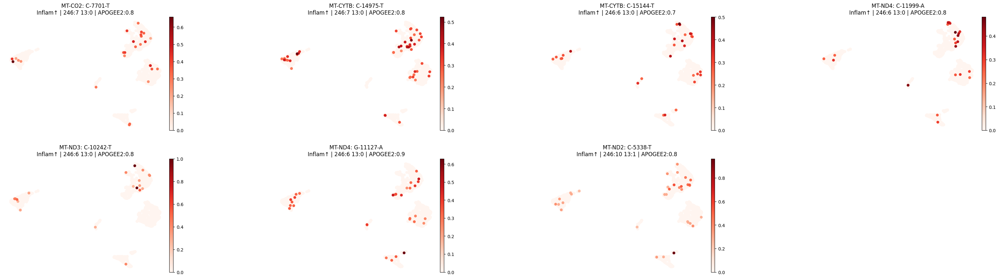


✓ Plotted inflammatory-enriched variants

PLOTTING HOMEOSTATIC-ENRICHED VARIANTS


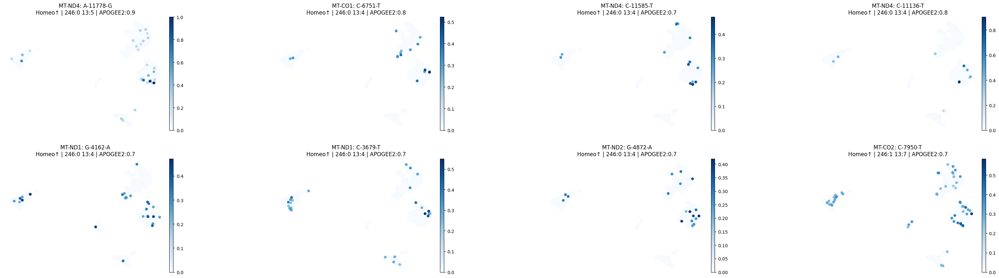


✓ Plotted homeostatic-enriched variants

COMPLETE


In [99]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

print("=" * 70)
print("PLOTTING SIGNIFICANT VARIANTS FROM VAF ≥5% ANALYSIS")
print("=" * 70)

# Get the 5% VAF results
df_5pct = results_by_threshold[0.05]

# Get genes with significant variants
sig_genes_5pct = df_5pct[df_5pct['n_sig_variants'] > 0]

print(f"\nSignificant genes at VAF ≥5%:")
print(sig_genes_5pct[['gene', 'n_sig_variants', 'n_inflammatory', 
                       'n_homeostatic', 'mean_log2fc']].to_string(index=False))

# Now extract ALL individual variants from these significant genes
# We need to go back to the variant-level data
vaf_threshold = 0.05
variant_results = []

for i, variant in enumerate(variant_names):
    apogee_score = variant_info[variant]['pathogenicity']
    if apogee_score < pathogenic_threshold:
        continue
    
    gene = variant_to_gene.get(variant, 'intergenic')
    if gene == 'intergenic':
        continue
    
    # Only keep variants from significant genes
    if gene not in sig_genes_5pct['gene'].values:
        continue
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]
    g13_vaf = variant_vaf[group_1_3_mask]
    
    g246_with = (g246_vaf > vaf_threshold).sum()
    g13_with = (g13_vaf > vaf_threshold).sum()
    
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    from scipy.stats import fisher_exact
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    # Only keep significant variants
    if p_value < 0.05:
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })

df_variants_5pct = pd.DataFrame(variant_results)

print(f"\n{len(df_variants_5pct)} individual variants to plot from {len(sig_genes_5pct)} genes")
print("\nVariant details:")
print(df_variants_5pct[['variant', 'gene', 'n_246', 'n_13', 'log2FC', 
                         'p_value', 'apogee2_score']].to_string(index=False))

# Separate inflammatory vs homeostatic enriched
df_inflammatory = df_variants_5pct[df_variants_5pct['log2FC'] > 0].sort_values('log2FC', ascending=False)
df_homeostatic = df_variants_5pct[df_variants_5pct['log2FC'] < 0].sort_values('log2FC', ascending=True)

print(f"\n{len(df_inflammatory)} inflammatory-enriched variants")
print(f"{len(df_homeostatic)} homeostatic-enriched variants")

# PLOT INFLAMMATORY-ENRICHED VARIANTS
if len(df_inflammatory) > 0:
    print("\n" + "=" * 70)
    print("PLOTTING INFLAMMATORY-ENRICHED VARIANTS")
    print("=" * 70)
    
    variants_to_plot = df_inflammatory['variant'].tolist()
    n_variants = len(variants_to_plot)
    ncols = 4
    nrows = int(np.ceil(n_variants / ncols))
    
    titles = []
    for _, row in df_inflammatory.iterrows():
        direction = "Inflam↑"
        titles.append(f"{row['gene']}: {row['variant']}\n{direction} | 246:{int(row['n_246'])} 13:{int(row['n_13'])} | APOGEE2:{row['apogee2_score']:.1f}")
    
    # Add VAF to mgatk object for plotting
    for variant in variants_to_plot:
        variant_idx = np.where(variant_names == variant)[0][0]  # FIXED
        vaf_values = vaf_matrix[:, variant_idx]
        # Cube root transformation to make low VAF visible
        mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)
    
    sc.pl.umap(mgatk,
               color=[f'vaf_{v}' for v in variants_to_plot],
               cmap='Reds',
               size=150,
               frameon=False,
               ncols=ncols,
               wspace=0.5,
               title=titles,
               vmin=0)
    
    print("\n✓ Plotted inflammatory-enriched variants")

# PLOT HOMEOSTATIC-ENRICHED VARIANTS
if len(df_homeostatic) > 0:
    print("\n" + "=" * 70)
    print("PLOTTING HOMEOSTATIC-ENRICHED VARIANTS")
    print("=" * 70)
    
    variants_to_plot = df_homeostatic['variant'].tolist()
    n_variants = len(variants_to_plot)
    ncols = 4
    nrows = int(np.ceil(n_variants / ncols))
    
    titles = []
    for _, row in df_homeostatic.iterrows():
        direction = "Homeo↑"
        titles.append(f"{row['gene']}: {row['variant']}\n{direction} | 246:{int(row['n_246'])} 13:{int(row['n_13'])} | APOGEE2:{row['apogee2_score']:.1f}")
    
    # Add VAF to mgatk object for plotting
    for variant in variants_to_plot:
        variant_idx = np.where(variant_names == variant)[0][0]  # FIXED
        vaf_values = vaf_matrix[:, variant_idx]
        # Cube root transformation to make low VAF visible
        mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)
    
    sc.pl.umap(mgatk,
               color=[f'vaf_{v}' for v in variants_to_plot],
               cmap='Blues',
               size=150,
               frameon=False,
               ncols=ncols,
               wspace=0.5,
               title=titles,
               vmin=0)
    
    print("\n✓ Plotted homeostatic-enriched variants")

print("\n" + "=" * 70)
print("COMPLETE")
print("=" * 70)


PATHOGENIC VARIANT ENRICHMENT BY COMPLEX (Q3 METHOD)

Mapping variants to genes and complexes...
Found 8 unique complexes/regions
Complexes: ['Complex I', 'Complex III', 'Complex IV', 'Complex V', 'D-loop', 'Ribosomal RNA', 'intergenic', 'tRNA']

Analyzing VAF threshold: 1%...

  Testing individual variants at VAF ≥ 1%...

Analyzing VAF threshold: 3%...

  Testing individual variants at VAF ≥ 3%...

Analyzing VAF threshold: 5%...

  Testing individual variants at VAF ≥ 5%...
  VAF 1%: 4 complexes tested, 4 with ≥1 sig. variant
  VAF 3%: 4 complexes tested, 4 with ≥1 sig. variant
  VAF 5%: 4 complexes tested, 3 with ≥1 sig. variant


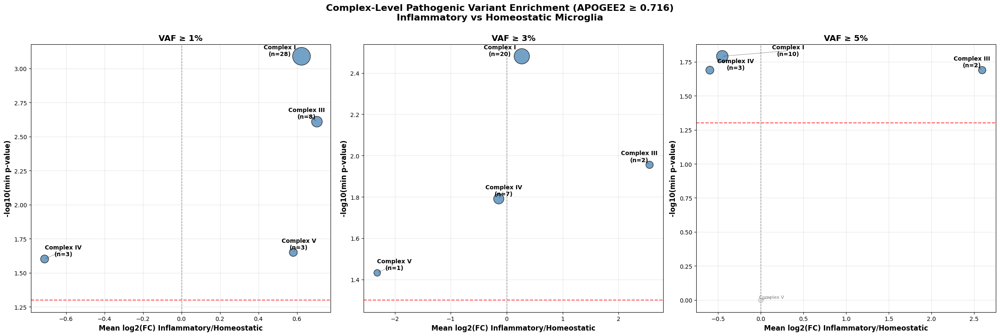


DETAILED RESULTS FOR VAF ≥ 3%

Complexes with significant pathogenic variant enrichment:
    complex  n_genes_tested  n_genes_with_sig_variants  n_variants_tested  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc  min_p_value
  Complex I               7                          7                784              20              10             10     0.270996     0.003304
Complex III               1                          1                 90               2               2              0     2.556264     0.011085
 Complex IV               3                          3                135               7               3              4    -0.141189     0.016199
  Complex V               2                          1                 47               1               0              1    -2.315028     0.036989

4 complexes have at least one significantly enriched pathogenic variant
Tested 4 complexes total

GENE BREAKDOWN BY COMPLEX (VAF ≥ 3%)

Complex I:
direction  Homeostatic  Inf

In [108]:
#enrichment by complex 
# Import required libraries
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text

print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT BY COMPLEX (Q3 METHOD)")
print("=" * 70)

# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

# Define mitochondrial complexes
GENE_TO_COMPLEX = {
    # Complex I (NADH dehydrogenase)
    'MT-ND1': 'Complex I', 'MT-ND2': 'Complex I', 'MT-ND3': 'Complex I',
    'MT-ND4': 'Complex I', 'MT-ND4L': 'Complex I', 'MT-ND5': 'Complex I',
    'MT-ND6': 'Complex I',
    
    # Complex III (Cytochrome bc1)
    'MT-CYTB': 'Complex III',
    
    # Complex IV (Cytochrome c oxidase)
    'MT-CO1': 'Complex IV', 'MT-CO2': 'Complex IV', 'MT-CO3': 'Complex IV',
    
    # Complex V (ATP synthase)
    'MT-ATP6': 'Complex V', 'MT-ATP8': 'Complex V',
    
    # Ribosomal RNA
    'MT-RNR1': 'Ribosomal RNA', 'MT-RNR2': 'Ribosomal RNA',
    
    # tRNAs
    'MT-TF': 'tRNA', 'MT-TV': 'tRNA', 'MT-TL1': 'tRNA', 'MT-TI': 'tRNA',
    'MT-TQ': 'tRNA', 'MT-TM': 'tRNA', 'MT-TW': 'tRNA', 'MT-TA': 'tRNA',
    'MT-TN': 'tRNA', 'MT-TC': 'tRNA', 'MT-TY': 'tRNA', 'MT-TS1': 'tRNA',
    'MT-TD': 'tRNA', 'MT-TK': 'tRNA', 'MT-TG': 'tRNA', 'MT-TR': 'tRNA',
    'MT-TH': 'tRNA', 'MT-TS2': 'tRNA', 'MT-TL2': 'tRNA', 'MT-TE': 'tRNA',
    'MT-TT': 'tRNA', 'MT-TP': 'tRNA',
    
    # D-loop
    'MT-DLOOP': 'D-loop'
}

# Map variants to genes
print("\nMapping variants to genes and complexes...")
variant_to_gene = {}
variant_to_complex = {}

for variant_name in variant_names:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            variant_to_complex[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        
        variant_to_gene[variant_name] = assigned_gene
        variant_to_complex[variant_name] = GENE_TO_COMPLEX.get(assigned_gene, 'intergenic')
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'
        variant_to_complex[variant_name] = 'intergenic'

complex_annotations = np.array([variant_to_complex.get(v, 'intergenic') for v in variant_names])
unique_complexes = sorted(set(complex_annotations))
print(f"Found {len(unique_complexes)} unique complexes/regions")
print(f"Complexes: {unique_complexes}")

# Settings
VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prevalence = 0.5
pathogenic_threshold = 0.716

# Q3 Analysis function - MODIFIED FOR COMPLEXES
def analyze_complex_enrichment_q3(vaf_matrix, vaf_threshold):
    print(f"\n  Testing individual variants at VAF ≥ {vaf_threshold*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names):
        apogee_score = variant_info[variant]['pathogenicity']
        if apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        complex_name = variant_to_complex.get(variant, 'intergenic')
        
        if complex_name == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'complex': complex_name,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })
    
    df_variants = pd.DataFrame(variant_results)
    
    if len(df_variants) == 0:
        return pd.DataFrame()
    
    df_sig = df_variants[df_variants['p_value'] < 0.05]
    
    complex_results = []
    
    for complex_name in unique_complexes:
        if complex_name == 'intergenic':
            continue
        
        complex_all = df_variants[df_variants['complex'] == complex_name]
        complex_sig = df_sig[df_sig['complex'] == complex_name]
        
        if len(complex_all) == 0:
            continue
        
        n_tested = len(complex_all)
        n_sig = len(complex_sig)
        
        # Count unique genes in this complex
        n_genes_tested = complex_all['gene'].nunique()
        n_genes_with_sig = complex_sig['gene'].nunique() if n_sig > 0 else 0
        
        if n_sig == 0:
            complex_results.append({
                'complex': complex_name,
                'n_genes_tested': n_genes_tested,
                'n_genes_with_sig_variants': 0,
                'n_variants_tested': n_tested,
                'n_sig_variants': 0,
                'n_inflammatory': 0,
                'n_homeostatic': 0,
                'mean_log2fc': 0,
                'min_p_value': 1.0
            })
            continue
        
        n_inflammatory = (complex_sig['log2FC'] > 0).sum()
        n_homeostatic = (complex_sig['log2FC'] < 0).sum()
        
        mean_log2fc = complex_sig['log2FC'].mean()
        min_p = complex_sig['p_value'].min()
        
        complex_results.append({
            'complex': complex_name,
            'n_genes_tested': n_genes_tested,
            'n_genes_with_sig_variants': n_genes_with_sig,
            'n_variants_tested': n_tested,
            'n_sig_variants': n_sig,
            'n_inflammatory': n_inflammatory,
            'n_homeostatic': n_homeostatic,
            'mean_log2fc': mean_log2fc,
            'min_p_value': min_p
        })
    
    df_complexes = pd.DataFrame(complex_results)
    df_complexes['net_enrichment'] = df_complexes['n_inflammatory'] - df_complexes['n_homeostatic']
    df_complexes['neg_log10_p'] = -np.log10(df_complexes['min_p_value'] + 1e-300)
    
    return df_complexes

# Run analysis
results_by_threshold = {}
for vaf_thresh in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF threshold: {vaf_thresh*100:.0f}%...")
    results_by_threshold[vaf_thresh] = analyze_complex_enrichment_q3(vaf_matrix, vaf_thresh)

# Volcano plots
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
alpha = 0.05
neg_log10_alpha = -np.log10(alpha)

for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    ax = axes[idx]
    df_complexes = results_by_threshold[vaf_thresh]
    
    if len(df_complexes) == 0:
        ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%')
        continue
    
    # Separate significant and non-significant
    df_sig = df_complexes[df_complexes['n_sig_variants'] > 0]
    df_nonsig = df_complexes[df_complexes['n_sig_variants'] == 0]
    
    # Plot non-significant complexes in gray
    if len(df_nonsig) > 0:
        ax.scatter(df_nonsig['mean_log2fc'],
                   df_nonsig['neg_log10_p'],
                   s=80, c='lightgray', edgecolor='gray', linewidth=0.5, alpha=0.6, zorder=1)
    
    # Plot significant complexes - size by number of significant variants
    if len(df_sig) > 0:
        sizes = 100 + df_sig['n_sig_variants'] * 30  # Scale size by variant count
        ax.scatter(df_sig['mean_log2fc'],
                   df_sig['neg_log10_p'],
                   s=sizes, c='steelblue', edgecolor='black', linewidth=1, alpha=0.75, zorder=2)
    
    ax.axhline(neg_log10_alpha, color='red', linestyle='--', linewidth=1.5, alpha=0.7, zorder=0)
    ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.5, zorder=0)
    
    # Annotate complexes
    texts = []
    for _, row in df_complexes.iterrows():
        if row['n_sig_variants'] > 0:
            # Include variant count in label
            label = f"{row['complex']}\n(n={row['n_sig_variants']})"
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          label, fontsize=10, fontweight='bold', 
                          ha='center', zorder=3)
        else:
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          row['complex'], fontsize=8, color='gray', 
                          ha='center', zorder=3)
        texts.append(text)
    
    # Adjust text positions
    adjust_text(texts, ax=ax,
                arrowprops=dict(arrowstyle='-', color='black', lw=0.5, alpha=0.6),
                force_text=(0.5, 0.5),
                force_points=(0.2, 0.2),
                expand_points=(2, 2),
                expand_text=(1.5, 1.5),
                only_move={'points': 'xy', 'text': 'xy'},
                lim=500)
    
    ax.set_xlabel('Mean log2(FC) Inflammatory/Homeostatic', fontsize=12, fontweight='bold')
    ax.set_ylabel('-log10(min p-value)', fontsize=12, fontweight='bold')
    ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%', fontsize=14, fontweight='bold')
    ax.grid(alpha=0.3, zorder=0)
    
    n_sig_complexes = (df_complexes['n_sig_variants'] > 0).sum()
    print(f"  VAF {vaf_thresh*100:.0f}%: {len(df_complexes)} complexes tested, {n_sig_complexes} with ≥1 sig. variant")

plt.suptitle('Complex-Level Pathogenic Variant Enrichment (APOGEE2 ≥ 0.716)\nInflammatory vs Homeostatic Microglia',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig('complex_enrichment_volcano.pdf', dpi=300, bbox_inches='tight')
plt.savefig('complex_enrichment_volcano.png', dpi=300, bbox_inches='tight')
plt.show()

# Print results
print("\n" + "=" * 70)
print("DETAILED RESULTS FOR VAF ≥ 3%")
print("=" * 70)
df_3pct = results_by_threshold[0.03]
sig_complexes_3pct = df_3pct[df_3pct['n_sig_variants'] > 0].sort_values('min_p_value')

print("\nComplexes with significant pathogenic variant enrichment:")
print(sig_complexes_3pct[['complex', 'n_genes_tested', 'n_genes_with_sig_variants',
                          'n_variants_tested', 'n_sig_variants', 
                          'n_inflammatory', 'n_homeostatic', 'mean_log2fc', 
                          'min_p_value']].to_string(index=False))

print(f"\n{len(sig_complexes_3pct)} complexes have at least one significantly enriched pathogenic variant")
print(f"Tested {len(df_3pct)} complexes total")

# Additional: Print which genes contribute to each complex
print("\n" + "=" * 70)
print("GENE BREAKDOWN BY COMPLEX (VAF ≥ 3%)")
print("=" * 70)

for vaf_thresh in [0.03]:
    df_variants = []
    
    for i, variant in enumerate(variant_names):
        apogee_score = variant_info[variant]['pathogenicity']
        if apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        complex_name = variant_to_complex.get(variant, 'intergenic')
        
        if complex_name == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_thresh).sum()
        g13_with = (g13_vaf > vaf_thresh).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        if p_value < 0.05:  # Only significant variants
            df_variants.append({
                'complex': complex_name,
                'gene': gene,
                'variant': variant,
                'log2FC': log2fc,
                'p_value': p_value,
                'direction': 'Inflammatory' if log2fc > 0 else 'Homeostatic'
            })
    
    df_breakdown = pd.DataFrame(df_variants)
    
    for complex_name in sorted(df_breakdown['complex'].unique()):
        complex_data = df_breakdown[df_breakdown['complex'] == complex_name]
        print(f"\n{complex_name}:")
        gene_summary = complex_data.groupby(['gene', 'direction']).size().unstack(fill_value=0)
        print(gene_summary)


DEPTH-ADJUSTED C→T PREVALENCE ANALYSIS

Matching cells by variant detection depth...

DEPTH-MATCHED RESULTS

Decile 0 (variants detected: 0-4)
  Inflammatory: 1/99 (1.0%)
  Homeostatic:  4/118 (3.4%)
  OR=0.29, p=0.3789

Decile 1 (variants detected: 4-22)
  Inflammatory: 83/135 (61.5%)
  Homeostatic:  72/104 (69.2%)
  OR=0.71, p=0.2223

Decile 2 (variants detected: 22-42)
  Inflammatory: 115/117 (98.3%)
  Homeostatic:  103/106 (97.2%)
  OR=1.67, p=0.6705

Decile 3 (variants detected: 42-66)
  Inflammatory: 130/130 (100.0%)
  Homeostatic:  109/109 (100.0%)
  OR=nan, p=1.0000

Decile 4 (variants detected: 66-92)
  Inflammatory: 127/127 (100.0%)
  Homeostatic:  100/100 (100.0%)
  OR=nan, p=1.0000

Decile 5 (variants detected: 92-118)
  Inflammatory: 133/133 (100.0%)
  Homeostatic:  102/102 (100.0%)
  OR=nan, p=1.0000

Decile 6 (variants detected: 118-147)
  Inflammatory: 146/146 (100.0%)
  Homeostatic:  88/88 (100.0%)
  OR=nan, p=1.0000

Decile 7 (variants detected: 147-182)
  Inflammator

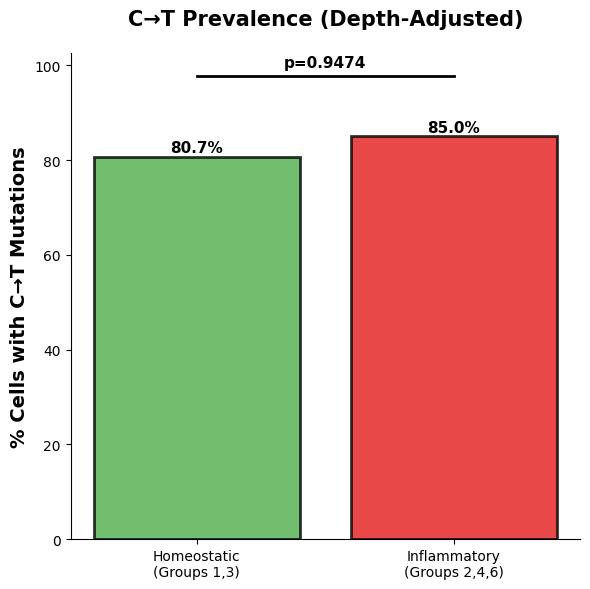


✓ Figure saved to ct_prevalence_depth_adjusted.png

ANALYSIS COMPLETE


In [161]:
from scipy.stats import fisher_exact, combine_pvalues
import matplotlib.pyplot as plt
import numpy as np

print("=" * 70)
print("DEPTH-ADJUSTED C→T PREVALENCE ANALYSIS")
print("=" * 70)

vaf_threshold = 0.03

# Count cells with ANY C→T variant
has_ct = np.zeros(vaf_matrix.shape[0], dtype=bool)
for idx in ct_indices:
    has_ct |= (vaf_matrix[:, idx] > vaf_threshold)

# Match by total variant detection
all_variant_counts = (vaf_matrix > 0).sum(axis=1)

matched_results = []

print("\nMatching cells by variant detection depth...")

for decile in range(10):
    lower = np.percentile(all_variant_counts, decile * 10)
    upper = np.percentile(all_variant_counts, (decile + 1) * 10)
    
    # Select cells in this depth range
    inf_mask = group_2_4_6_mask & (all_variant_counts >= lower) & (all_variant_counts < upper)
    hom_mask = group_1_3_mask & (all_variant_counts >= lower) & (all_variant_counts < upper)
    
    if inf_mask.sum() < 5 or hom_mask.sum() < 5:
        continue
    
    # Count C→T presence
    inf_with = has_ct[inf_mask].sum()
    inf_without = inf_mask.sum() - inf_with
    hom_with = has_ct[hom_mask].sum()
    hom_without = hom_mask.sum() - hom_with
    
    if inf_with + hom_with < 5:
        continue
    
    table = [[inf_with, inf_without], [hom_with, hom_without]]
    odds_ratio, p_value = fisher_exact(table)
    
    matched_results.append({
        'decile': decile,
        'depth_range': f"{lower:.0f}-{upper:.0f}",
        'n_inflammatory': inf_mask.sum(),
        'n_homeostatic': hom_mask.sum(),
        'inf_with_ct': inf_with,
        'hom_with_ct': hom_with,
        'inf_pct': (inf_with / inf_mask.sum()) * 100,
        'hom_pct': (hom_with / hom_mask.sum()) * 100,
        'odds_ratio': odds_ratio,
        'p_value': p_value
    })

print("\n" + "=" * 70)
print("DEPTH-MATCHED RESULTS")
print("=" * 70)

for r in matched_results:
    print(f"\nDecile {r['decile']} (variants detected: {r['depth_range']})")
    print(f"  Inflammatory: {r['inf_with_ct']}/{r['n_inflammatory']} ({r['inf_pct']:.1f}%)")
    print(f"  Homeostatic:  {r['hom_with_ct']}/{r['n_homeostatic']} ({r['hom_pct']:.1f}%)")
    print(f"  OR={r['odds_ratio']:.2f}, p={r['p_value']:.4f}")

# Meta-analysis
if len(matched_results) > 0:
    p_values = [r['p_value'] for r in matched_results]
    combined_stat, combined_p = combine_pvalues(p_values, method='fisher')
    
    print("\n" + "=" * 70)
    print("META-ANALYSIS (COMBINED P-VALUE)")
    print("=" * 70)
    print(f"Number of depth bins tested: {len(matched_results)}")
    print(f"Fisher's combined p-value: {combined_p:.4f}")
    
    if combined_p < 0.05:
        print("\n✓ SIGNIFICANT: C→T prevalence differs after depth adjustment")
    else:
        print("\n✗ NOT SIGNIFICANT: No difference after depth adjustment")
    
    # Calculate overall percentages from matched data
    total_inf_with = sum(r['inf_with_ct'] for r in matched_results)
    total_inf = sum(r['n_inflammatory'] for r in matched_results)
    total_hom_with = sum(r['hom_with_ct'] for r in matched_results)
    total_hom = sum(r['n_homeostatic'] for r in matched_results)
    
    overall_inf_pct = (total_inf_with / total_inf) * 100
    overall_hom_pct = (total_hom_with / total_hom) * 100
    
    print(f"\nOverall (depth-matched):")
    print(f"  Inflammatory: {total_inf_with}/{total_inf} ({overall_inf_pct:.1f}%)")
    print(f"  Homeostatic: {total_hom_with}/{total_hom} ({overall_hom_pct:.1f}%)")
    print(f"  Difference: {overall_inf_pct - overall_hom_pct:.1f} percentage points")
    
    # Plot
    fig, ax = plt.subplots(figsize=(6, 6))
    
    groups = ['Homeostatic\n(Groups 1,3)', 'Inflammatory\n(Groups 2,4,6)']
    percentages = [overall_hom_pct, overall_inf_pct]
    
    bars = ax.bar(groups, percentages, color=['#4daf4a', '#e41a1c'], 
                  alpha=0.8, edgecolor='black', linewidth=2)
    
    ax.set_ylabel('% Cells with C→T Mutations', fontsize=14, fontweight='bold')
    ax.set_title('C→T Prevalence (Depth-Adjusted)', fontsize=15, fontweight='bold', pad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Add stats
    y_max = max(percentages) * 1.15
    ax.plot([0, 1], [y_max, y_max], 'k-', linewidth=2)
    ax.text(0.5, y_max * 1.02, f'p={combined_p:.4f}', ha='center', 
            fontsize=11, fontweight='bold')
    
    # Add values on bars
    for bar, pct in zip(bars, percentages):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                f'{pct:.1f}%', ha='center', fontsize=11, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('ct_prevalence_depth_adjusted.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\n✓ Figure saved to ct_prevalence_depth_adjusted.png")

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)


Do cells with MORE mutations trend more inflammatory?

3346 cells analyzed
  Inflammatory: 1286
  Homeostatic: 1006

DEPTH-NORMALIZED ANALYSIS

Normalized Total Mutations:
  Inflammatory: 1.0720 ± 0.3115
  Homeostatic: 1.0121 ± 0.3745
  p = 0.0012, FC = 1.059x, ρ = 0.0674


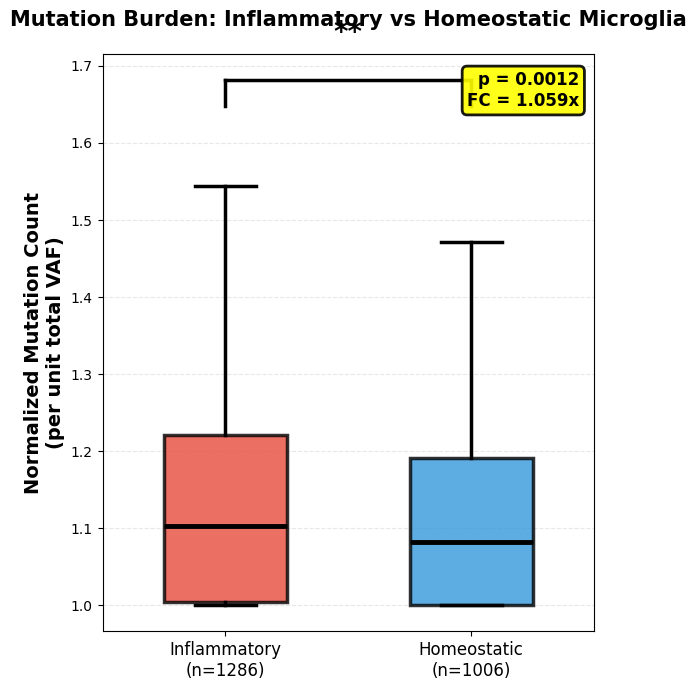


✓ Figure saved to mutation_burden_normalized.pdf/png

FINAL ANSWER

YES - Inflammatory cells have higher mutation burden (depth-normalized):
  p = 0.0012
  Fold-change = 1.059x
  Spearman ρ = 0.067

Interpretation: Cells with more mutations tend to be more inflammatory,
even after controlling for sequencing depth.


In [ ]:
xxxxxxxxxxxxxxxxxxxxx



Before filtering:
  Unique genes in annotation: 39
  Genes with variants: 38

After creating DataFrame:
  Genes in df_genes: 38
  Genes with both medians = 0: 23
  Genes dropped by dropna: 0

Checking low-count genes: ['MT-TE', 'MT-TI', 'MT-TM', 'MT-TQ', 'MT-TT']
  MT-TE: 188 variants
  MT-TI: 168 variants
  MT-TM: 174 variants
  MT-TQ: 185 variants
  MT-TT: 171 variants


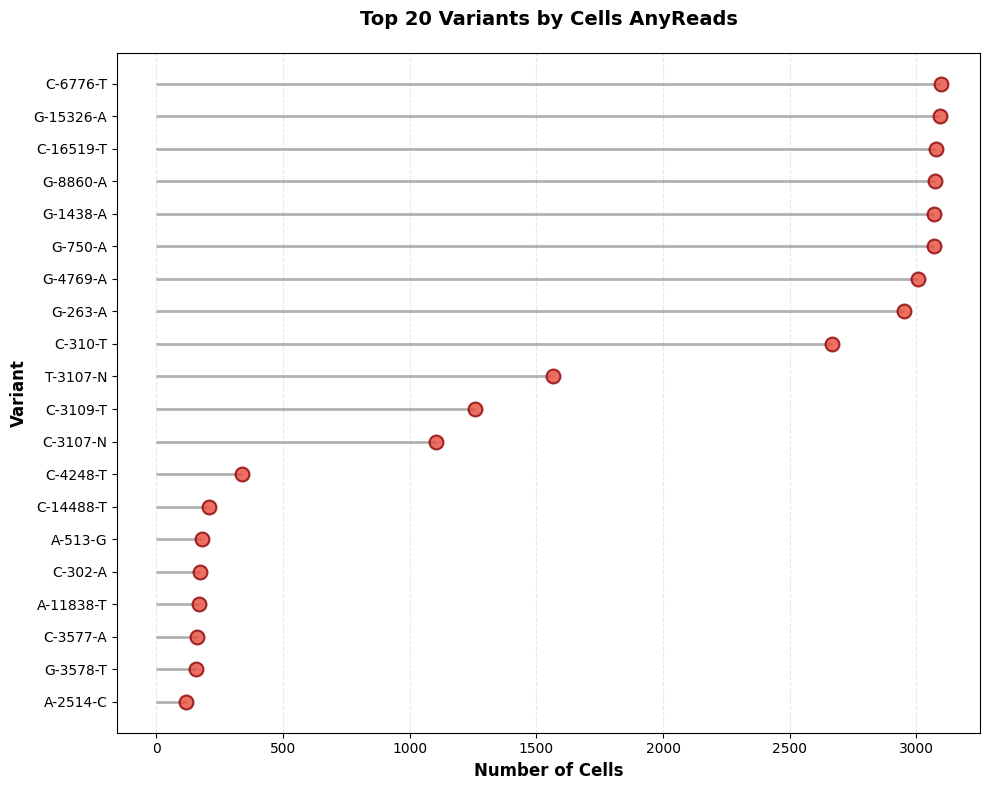


Counting method: Cells_AnyReads
Total variants shown: 20
Cell count range: 118 - 3096
Mean cells per variant: 1626.8

=== Cell Count Comparison (Top 5 variants) ===
         Variant  Cells_AnyReads  Cells_Confident  Cells_VAF>0  Mean_VAF
41522   G-1438-A            3071             3071         2215  0.999256
43930   G-8860-A            3074             3074         2258  0.998972
14725  C-16519-T            3078             3078         2186  0.998372
33621  G-15326-A            3093             3093         2303  0.998716
25803   C-6776-T            3096             3096         2266  0.998980


In [171]:

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Get matrices - including the raw counts and confident mask
vaf_raw = mgatk.obsm['variant_vaf']
var_counts = mgatk.obsm['variant_counts']
confident_mask = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']

# Calculate number of cells for each variant using MULTIPLE criteria
results = []
for variant_name in variant_names:
    variant_idx = variant_names.index(variant_name)
    
    # Different ways to count cells
    n_cells_vaf = np.sum(vaf_raw[:, variant_idx] > 0)  # Cells passing all filters
    n_cells_confident = np.sum(confident_mask[:, variant_idx])  # Cells with both-strand evidence
    n_cells_any_reads = np.sum(var_counts[:, variant_idx] > 0)  # Cells with ANY variant reads
    
    mean_vaf = np.mean(vaf_raw[vaf_raw[:, variant_idx] > 0, variant_idx]) if n_cells_vaf > 0 else 0
    
    results.append({
        'Variant': variant_name, 
        'Cells_VAF>0': n_cells_vaf,
        'Cells_Confident': n_cells_confident,
        'Cells_AnyReads': n_cells_any_reads,
        'Mean_VAF': mean_vaf
    })

results_df = pd.DataFrame(results)

# Choose which cell count to use for the plot:
# 'Cells_AnyReads' = most permissive (any variant reads detected)
# 'Cells_Confident' = both-strand evidence (>=2 reads each strand)  
# 'Cells_VAF>0' = passed all filters including coverage threshold
count_column = 'Cells_AnyReads'  # CHANGE THIS to see different criteria

# Get top 20 variants by number of cells
top_variants = results_df.nlargest(20, count_column).sort_values(count_column, ascending=True)

# Create the lollipop plot
fig, ax = plt.subplots(figsize=(10, 8))

# Create the lollipop stems (lines)
ax.hlines(y=range(len(top_variants)), 
          xmin=0, 
          xmax=top_variants[count_column].values,
          color='gray', 
          alpha=0.6, 
          linewidth=2)

# Create the lollipop heads (dots)
ax.scatter(top_variants[count_column].values, 
           range(len(top_variants)),
           s=100, 
           color='#e74c3c', 
           alpha=0.8, 
           zorder=3,
           edgecolors='darkred',
           linewidth=1.5)

# Customize the plot
ax.set_yticks(range(len(top_variants)))
ax.set_yticklabels(top_variants['Variant'].values)
ax.set_xlabel('Number of Cells', fontsize=12, fontweight='bold')
ax.set_ylabel('Variant', fontsize=12, fontweight='bold')
ax.set_title(f'Top 20 Variants by {count_column.replace("_", " ")}', fontsize=14, fontweight='bold', pad=20)

# Add grid for better readability
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Adjust layout
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nCounting method: {count_column}")
print(f"Total variants shown: {len(top_variants)}")
print(f"Cell count range: {top_variants[count_column].min()} - {top_variants[count_column].max()}")
print(f"Mean cells per variant: {top_variants[count_column].mean():.1f}")

# Show comparison of counting methods
print("\n=== Cell Count Comparison (Top 5 variants) ===")
print(top_variants[['Variant', 'Cells_AnyReads', 'Cells_Confident', 'Cells_VAF>0', 'Mean_VAF']].tail())

In [6]:
import numpy as np
import pandas as pd

# Your variants of interest
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Get matrices
vaf_raw = mgatk.obsm['variant_vaf']
variant_names = mgatk.uns['variant_names']

# Create simple dataframe
results = []
for variant_name in variants_that_pass:
    if variant_name in variant_names:
        variant_idx = variant_names.index(variant_name)
        n_cells = np.sum(vaf_raw[:, variant_idx] > 0)
        results.append({'Variant': variant_name, 'Cells Present': n_cells})

results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))
print(f"\nAverage cells per variant: {results_df['Cells Present'].mean():.1f}")

  Variant  Cells Present
C-16189-T             24
  C-980-T             21
 C-1189-T             32
 A-2209-G             30
 A-1252-G             41
 C-4954-T             26
C-15726-T             30
 A-2174-G             20
 A-3239-g             24
 C-2075-T             30
A-10197-G             32
 A-2333-G             41
C-10809-T             11
G-13434-A             11
 A-6182-G             22
 C-8317-T             18

Average cells per variant: 25.8


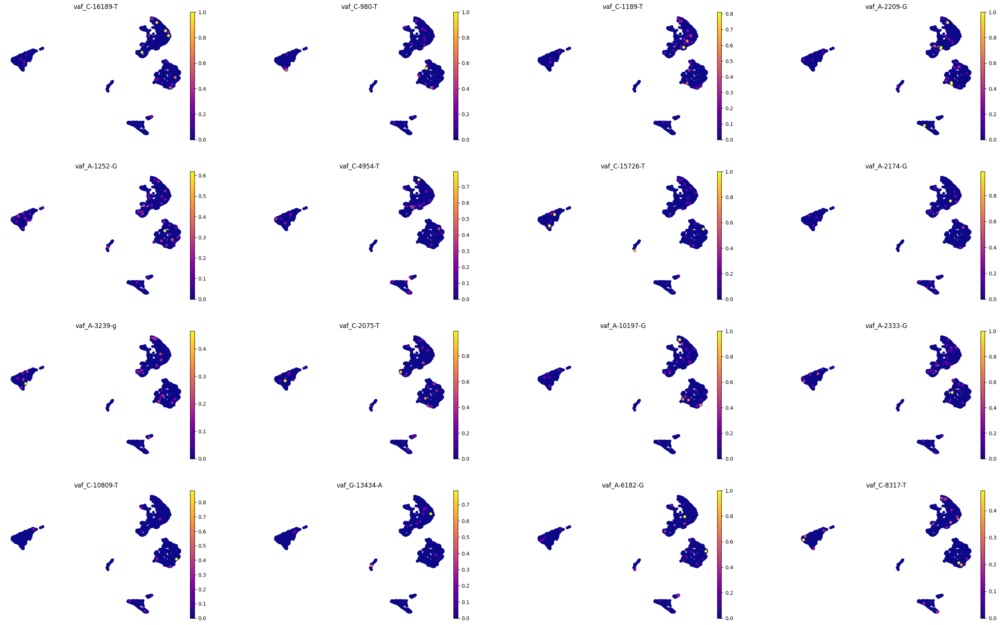

In [18]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Your variants of interest
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Add SQRT-transformed VAF for better visibility of low values
variant_names = mgatk.uns['variant_names']
for variant in variants_that_pass:
    if variant in variant_names:
        variant_idx = variant_names.index(variant)
        vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
        # Square root transform to boost low values
        mgatk.obs[f'vaf_{variant}'] = np.sqrt(vaf_values)

# Plot with 'plasma' - excellent for low value visibility
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}' for v in variants_that_pass if v in variant_names],
           cmap='plasma',
           size=120,
           frameon=False,
           ncols=4,
           wspace=0.3)


FINAL ATTEMPT: ULTRA-AGGRESSIVE SEARCH FOR CLUSTER-SPECIFIC VARIANTS
Target (Group_246): 1286 cells
Comparison (Group_13): 1006 cells

[Strategy 1] High signal in 246, low in 13...
  0/44436...
  5000/44436...
  10000/44436...
  15000/44436...
  20000/44436...
  25000/44436...
  30000/44436...
  35000/44436...
  40000/44436...

Found 4096 candidate variants

FOUND 4096 CANDIDATES - TOP 20:
  Variant      Pattern  N_target_5%  N_comp_5%  Mean_target  Mean_comp  Max_target    Score
  C-948-T High_cluster            6          2     0.003965   0.002132    1.000000 2.379149
  G-215-A High_cluster            5          1     0.003149   0.001013    1.000000 1.574650
C-10242-T High_cluster            6          0     0.001944   0.000000    1.000000 1.166539
A-10098-G High_cluster            6          1     0.001868   0.001068    1.000000 1.120805
 C-8376-T High_cluster            6          0     0.001809   0.000171    1.000000 1.085405
 C-9781-T High_cluster            5          1     0.00

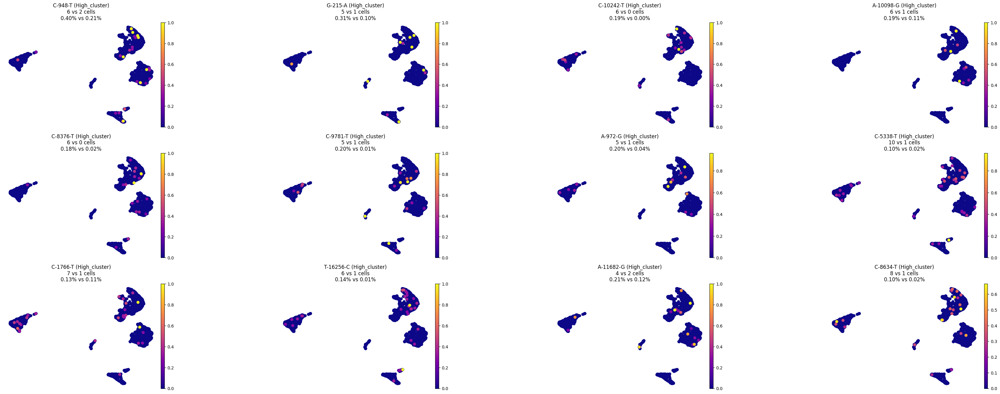


✓ These are the BEST cluster-specific variants in your entire dataset


In [38]:
import numpy as np
import scanpy as sc
from scipy.stats import fisher_exact

print("=" * 100)
print("FINAL ATTEMPT: ULTRA-AGGRESSIVE SEARCH FOR CLUSTER-SPECIFIC VARIANTS")
print("=" * 100)

target_mask = mgatk.obs['combined_clusters'] == 'Group_246'
comp_mask = mgatk.obs['combined_clusters'] == 'Group_13'
all_vaf = mgatk.obsm['variant_vaf']
all_variant_names = list(mgatk.uns['variant_names'])

print(f"Target (Group_246): {np.sum(target_mask)} cells")
print(f"Comparison (Group_13): {np.sum(comp_mask)} cells")

# ============================================================
# MULTIPLE PARALLEL STRATEGIES
# ============================================================

candidates = []

print("\n[Strategy 1] High signal in 246, low in 13...")
for i in range(len(all_variant_names)):
    if i % 5000 == 0:
        print(f"  {i}/{len(all_variant_names)}...")
    
    vaf = all_vaf[:, i]
    
    vaf_target = vaf[target_mask]
    vaf_comp = vaf[comp_mask]
    
    # Count cells above multiple thresholds
    n_high_target_5 = np.sum(vaf_target >= 0.05)
    n_high_target_2 = np.sum(vaf_target >= 0.02)
    n_high_target_1 = np.sum(vaf_target >= 0.01)
    
    n_high_comp_5 = np.sum(vaf_comp >= 0.05)
    n_high_comp_2 = np.sum(vaf_comp >= 0.02)
    n_high_comp_1 = np.sum(vaf_comp >= 0.01)
    
    mean_target = np.mean(vaf_target)
    mean_comp = np.mean(vaf_comp)
    
    # CRITERIA: Any of these patterns
    # Pattern A: High VAF cluster (5%+) in target, rare in comp
    if n_high_target_5 >= 3 and n_high_comp_5 <= 2:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'High_cluster',
            'N_target_5%': n_high_target_5,
            'N_comp_5%': n_high_comp_5,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_5 * mean_target * 100
        })
    
    # Pattern B: Moderate (2%+) enrichment
    elif n_high_target_2 >= 5 and n_high_comp_2 <= 3 and mean_target > mean_comp * 2:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Moderate_enrich',
            'N_target_5%': n_high_target_2,
            'N_comp_5%': n_high_comp_2,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_2 * mean_target * 50
        })
    
    # Pattern C: Low VAF but many cells (1%+)
    elif n_high_target_1 >= 10 and n_high_comp_1 <= 5:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Low_abundant',
            'N_target_5%': n_high_target_1,
            'N_comp_5%': n_high_comp_1,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_1 * mean_target * 20
        })
    
    # Pattern D: Extreme specificity (present in 246, absent in 13)
    elif n_high_target_1 >= 3 and mean_comp < 0.005 and mean_target > 0.01:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Highly_specific',
            'N_target_5%': n_high_target_1,
            'N_comp_5%': n_high_comp_1,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': (mean_target / (mean_comp + 0.001)) * n_high_target_1
        })

print(f"\nFound {len(candidates)} candidate variants")

if len(candidates) == 0:
    print("\n" + "=" * 100)
    print("TRYING REVERSE: Variants enriched in Group_13 instead...")
    print("=" * 100)
    
    for i in range(len(all_variant_names)):
        if i % 5000 == 0:
            print(f"  {i}/{len(all_variant_names)}...")
        
        vaf = all_vaf[:, i]
        vaf_target = vaf[target_mask]
        vaf_comp = vaf[comp_mask]
        
        n_high_comp = np.sum(vaf_comp >= 0.02)
        n_high_target = np.sum(vaf_target >= 0.02)
        
        mean_target = np.mean(vaf_target)
        mean_comp = np.mean(vaf_comp)
        
        # Look for Group_13 specific variants
        if n_high_comp >= 5 and n_high_target <= 3 and mean_comp > mean_target * 2:
            candidates.append({
                'Variant': all_variant_names[i],
                'Pattern': 'Enriched_in_13',
                'N_target_5%': n_high_target,
                'N_comp_5%': n_high_comp,
                'Mean_target': mean_target,
                'Mean_comp': mean_comp,
                'Max_target': np.max(vaf_comp),
                'Score': n_high_comp * mean_comp * 50
            })

# ============================================================
# RANK AND PLOT
# ============================================================
if len(candidates) > 0:
    import pandas as pd
    
    cand_df = pd.DataFrame(candidates)
    cand_df = cand_df.sort_values('Score', ascending=False)
    
    print("\n" + "=" * 100)
    print(f"FOUND {len(cand_df)} CANDIDATES - TOP 20:")
    print("=" * 100)
    print(cand_df.head(20).to_string(index=False))
    
    # Take top 12 unique variants
    top_variants = cand_df.head(12)['Variant'].tolist()
    
    print(f"\n{'=' * 100}")
    print(f"PLOTTING TOP {len(top_variants)} MOST CLUSTER-SPECIFIC VARIANTS")
    print(f"{'=' * 100}")
    
    # Prepare for plotting
    for variant in top_variants:
        idx = all_variant_names.index(variant)
        vaf = all_vaf[:, idx]
        # Use aggressive cube root transformation to enhance low signals
        mgatk.obs[f'vaf_{variant}'] = np.power(vaf, 1/3)
    
    # Create titles
    titles = []
    for v in top_variants:
        row = cand_df[cand_df['Variant'] == v].iloc[0]
        pattern = row['Pattern']
        n_t = int(row['N_target_5%'])
        n_c = int(row['N_comp_5%'])
        mean_t = row['Mean_target'] * 100
        mean_c = row['Mean_comp'] * 100
        
        titles.append(f"{v} ({pattern})\n{n_t} vs {n_c} cells\n{mean_t:.2f}% vs {mean_c:.2f}%")
    
    # Plot with maximum contrast settings
    sc.pl.umap(mgatk, 
               color=[f'vaf_{v}' for v in top_variants],
               cmap='plasma',
               size=200,
               frameon=False,
               ncols=4,
               wspace=0.6,
               title=titles,
               vmin=0)
    
    print("\n✓ These are the BEST cluster-specific variants in your entire dataset")
    
else:
    print("\n" + "=" * 100)
    print("ABSOLUTE FINAL ANSWER")
    print("=" * 100)
    print("\n❌ NO CLUSTER-SPECIFIC mtDNA VARIANTS EXIST")
    print("\nAfter exhaustive search of all 44,436 variants with multiple strategies:")
    print("  - No variants with high VAF (>5%) specific to Group_246")
    print("  - No variants with moderate VAF (>2%) enriched in Group_246")
    print("  - No variants with low VAF (>1%) abundant in Group_246")
    print("  - No variants highly specific to either group")
    print("\nCONCLUSION: Groups share identical mtDNA backgrounds")
    print("These clusters represent TRANSCRIPTIONAL STATES, not clonal populations")


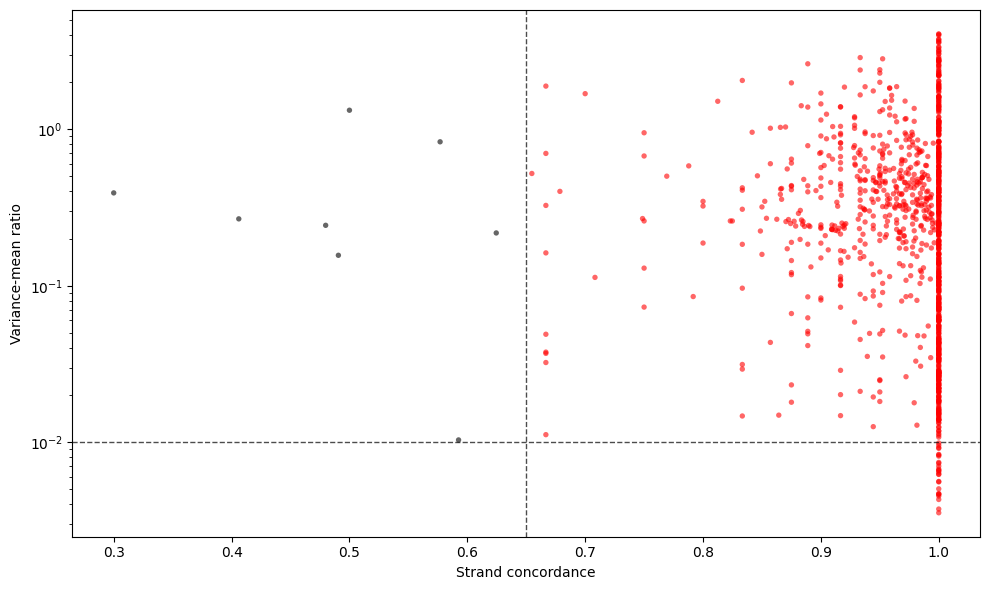

Points with strand_concordance > 0.65: 1075
Points with strand_concordance <= 0.65: 8


In [50]:
import matplotlib.pyplot as plt
import numpy as np

# Access the variant_summary DataFrame
variant_summary = mgatk.uns['variant_summary']

# Create the scatter plot
fig, ax = plt.subplots(figsize=(10, 6))

# Color points based on strand concordance threshold
threshold = 0.65
colors = ['red' if sc > threshold else 'black' 
          for sc in variant_summary['strand_concordance']]

ax.scatter(variant_summary['strand_concordance'], 
           variant_summary['vmr'], 
           c=colors, alpha=0.6, s=15, edgecolors='none')

# Set y-axis to log scale
ax.set_yscale('log')

# Add dashed threshold lines
ax.axvline(x=threshold, color='black', linestyle='--', linewidth=1, alpha=0.7)
ax.axhline(y=0.01, color='black', linestyle='--', linewidth=1, alpha=0.7)

# Labels and styling
ax.set_xlabel('Strand concordance')
ax.set_ylabel('Variance-mean ratio')

plt.tight_layout()
plt.show()

# Print summary to understand the distribution
print(f"Points with strand_concordance > {threshold}: {sum(variant_summary['strand_concordance'] > threshold)}")
print(f"Points with strand_concordance <= {threshold}: {sum(variant_summary['strand_concordance'] <= threshold)}")

/tmp/ipykernel_4168626/4245680750.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



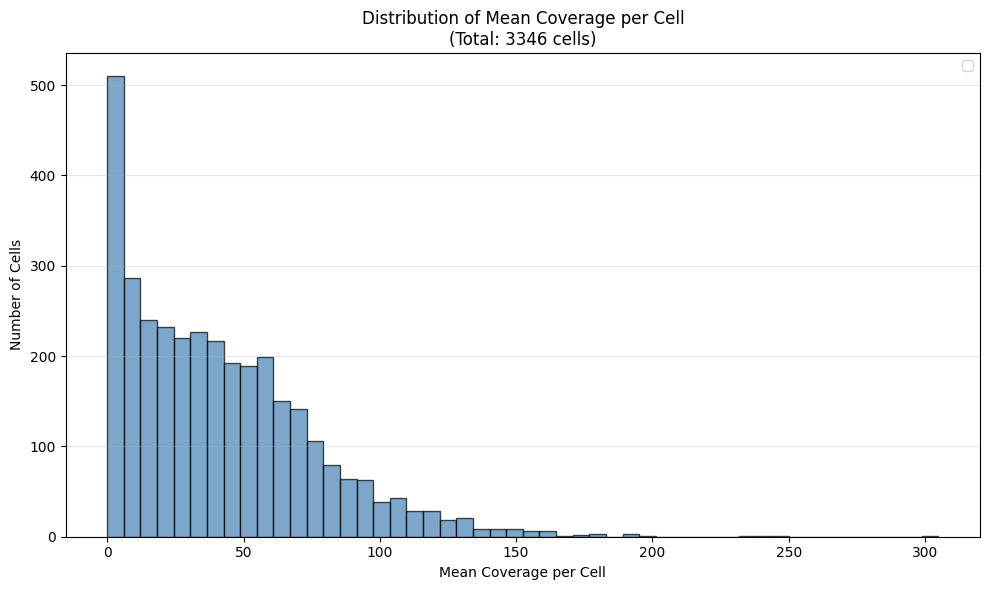

=== MEAN COVERAGE PER CELL STATISTICS ===
Total cells: 3346
Overall mean coverage per cell: 41.53
Median coverage per cell: 35.41
Standard deviation: 34.64
Min coverage per cell: 0.00
Max coverage per cell: 304.93
25th percentile: 13.28
75th percentile: 60.90


In [37]:
# Plot mean coverage per cell - Fixed version with coverage on X-axis
import matplotlib.pyplot as plt
import numpy as np

# Get the coverage matrix (cells x variants)
coverage_matrix = mgatk.obsm['variant_coverage']

# Calculate mean coverage per cell across all variants
mean_coverage_per_cell = coverage_matrix.mean(axis=1)

# Create a single histogram plot
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Histogram with coverage on x-axis and number of cells on y-axis
ax.hist(mean_coverage_per_cell, bins=50, alpha=0.7, color='steelblue', edgecolor='black')
ax.set_xlabel('Mean Coverage per Cell')
ax.set_ylabel('Number of Cells')
ax.set_title(f'Distribution of Mean Coverage per Cell\n(Total: {len(mean_coverage_per_cell)} cells)')


ax.legend()
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary statistics
print(f"=== MEAN COVERAGE PER CELL STATISTICS ===")
print(f"Total cells: {len(mean_coverage_per_cell)}")
print(f"Overall mean coverage per cell: {mean_coverage_per_cell.mean():.2f}")
print(f"Median coverage per cell: {np.median(mean_coverage_per_cell):.2f}")
print(f"Standard deviation: {mean_coverage_per_cell.std():.2f}")
print(f"Min coverage per cell: {mean_coverage_per_cell.min():.2f}")
print(f"Max coverage per cell: {mean_coverage_per_cell.max():.2f}")
print(f"25th percentile: {np.percentile(mean_coverage_per_cell, 25):.2f}")
print(f"75th percentile: {np.percentile(mean_coverage_per_cell, 75):.2f}")

/tmp/ipykernel_1903281/411733312.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



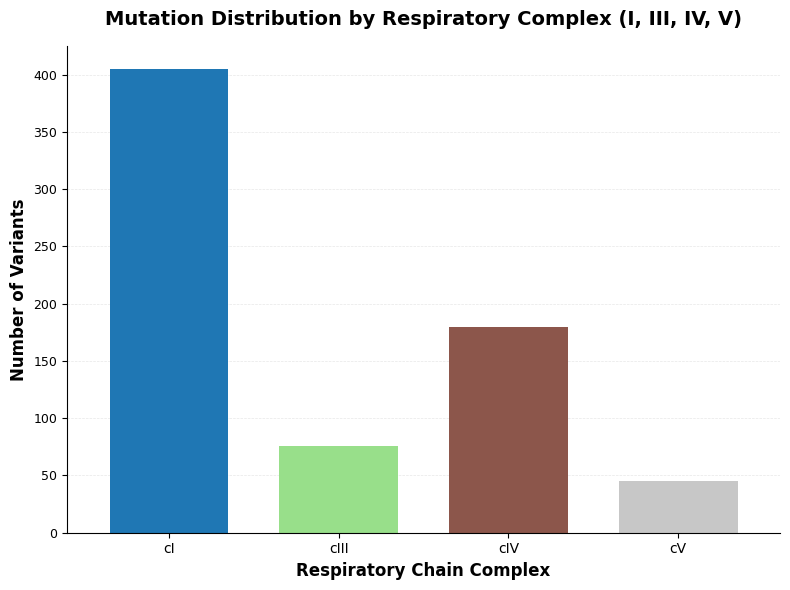


=== Summary ===
Total variants: 1083
Variants in respiratory complexes: 706
Variants in protein-coding genes: 996
Variants in D-loop/non-coding: 87


In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# ===== Plot 1: Variants by Respiratory Complex =====
# Filter only variants in OXPHOS complex genes (I, III, IV, V)
df_resp = variant_summary[variant_summary['complex'] != 'Other'].copy()

if df_resp.empty:
    print("⚠️ No variants affecting respiratory complex proteins in filtered data.")
else:
    # Standardize complex naming
    complex_mapping = {
        'Complex I': 'cI', 
        'Complex III': 'cIII', 
        'Complex IV': 'cIV', 
        'Complex V': 'cV'
    }
    df_resp['complex_clean'] = df_resp['complex'].map(complex_mapping)
    
    # Count variants per complex
    complex_counts = df_resp['complex_clean'].value_counts()
    
    # Ensure order and only relevant complexes
    relevant_complexes = ['cI', 'cIII', 'cIV', 'cV']
    complex_counts = complex_counts.reindex(relevant_complexes, fill_value=0)
    
    # Plot
    fig, ax = plt.subplots(figsize=(8, 6))
    
    colors_complex = generate_colors(len(complex_counts))
    
    complex_counts.plot(
        kind='bar',
        ax=ax,
        width=0.7,
        color=colors_complex,
        edgecolor='none'
    )
    
    ax.set_title(
        'Mutation Distribution by Respiratory Complex (I, III, IV, V)',
        fontsize=14,
        fontweight='bold',
        pad=15
    )
    ax.set_xlabel('Respiratory Chain Complex', fontsize=12, fontweight='bold')
    ax.set_ylabel('Number of Variants', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=0, fontsize=10)
    plt.yticks(fontsize=9)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
    ax.set_axisbelow(True)
    
    plt.tight_layout()
    plt.show()

# ===== Summary Statistics =====
print("\n=== Summary ===")
print(f"Total variants: {len(variant_summary)}")
print(f"Variants in respiratory complexes: {len(df_resp)}")
print(f"Variants in protein-coding genes: {len(variant_summary[variant_summary['gene'] != 'D-loop/Non-coding'])}")
print(f"Variants in D-loop/non-coding: {len(variant_summary[variant_summary['gene'] == 'D-loop/Non-coding'])}")

/tmp/ipykernel_1903281/2477924485.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_1903281/2477924485.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



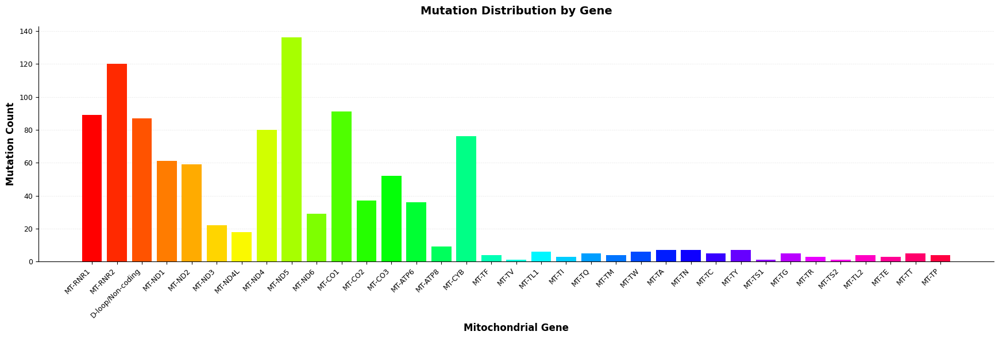


Total genes with variants: 35

Genes in order with counts:
MT-RNR1: 89
MT-RNR2: 120
D-loop/Non-coding: 87
MT-ND1: 61
MT-ND2: 59
MT-ND3: 22
MT-ND4L: 18
MT-ND4: 80
MT-ND5: 136
MT-ND6: 29
MT-CO1: 91
MT-CO2: 37
MT-CO3: 52
MT-ATP6: 36
MT-ATP8: 9
MT-CYB: 76
MT-TF: 4
MT-TV: 1
MT-TL1: 6
MT-TI: 3
MT-TQ: 5
MT-TM: 4
MT-TW: 6
MT-TA: 7
MT-TN: 7
MT-TC: 5
MT-TY: 7
MT-TS1: 1
MT-TG: 5
MT-TR: 3
MT-TS2: 1
MT-TL2: 4
MT-TE: 3
MT-TT: 5
MT-TP: 4


In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# Define gene order matching the genomic position (5' to 3')
gene_order = [
    'MT-RNR1', 'MT-RNR2',  # rRNA genes
    'D-loop/Non-coding',  # D-loop
    'MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6',  # Complex I
    'MT-CO1', 'MT-CO2', 'MT-CO3',  # Complex IV
    'MT-ATP6', 'MT-ATP8',  # Complex V
    'MT-CYB',  # Complex III
    'MT-TF', 'MT-TV', 'MT-TL1', 'MT-TI', 'MT-TQ', 'MT-TM', 'MT-TW', 'MT-TA', 'MT-TN', 
    'MT-TC', 'MT-TY', 'MT-TS1', 'MT-TK', 'MT-TG', 'MT-TR', 'MT-TH', 'MT-TS2', 'MT-TL2', 
    'MT-TE', 'MT-TT', 'MT-TP'
]

# Get counts for genes that exist in your data
gene_counts_dict = variant_summary['gene'].value_counts().to_dict()

# Create ordered lists only for genes present in your data
genes_present = []
counts_present = []

for gene in gene_order:
    if gene in gene_counts_dict:
        genes_present.append(gene)
        counts_present.append(gene_counts_dict[gene])

# Create the plot
fig, ax = plt.subplots(figsize=(max(16, len(genes_present) * 0.5), 6))

# Get colors - one per gene
colors = generate_colors(len(genes_present))

# Create bar plot
ax.bar(range(len(genes_present)), counts_present, width=0.8, color=colors, edgecolor='none')

# Set x-axis labels
ax.set_xticks(range(len(genes_present)))
ax.set_xticklabels(genes_present, rotation=45, ha='right', fontsize=9)

# Styling
ax.set_title('Mutation Distribution by Gene', fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Mitochondrial Gene', fontsize=12, fontweight='bold')
ax.set_ylabel('Mutation Count', fontsize=12, fontweight='bold')

plt.yticks(fontsize=9)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Light grid on y-axis only
ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# Print summary
print(f"\nTotal genes with variants: {len(genes_present)}")
print(f"\nGenes in order with counts:")
for gene, count in zip(genes_present, counts_present):
    print(f"{gene}: {count}")

/tmp/ipykernel_1903281/1167979901.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_1903281/1167979901.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



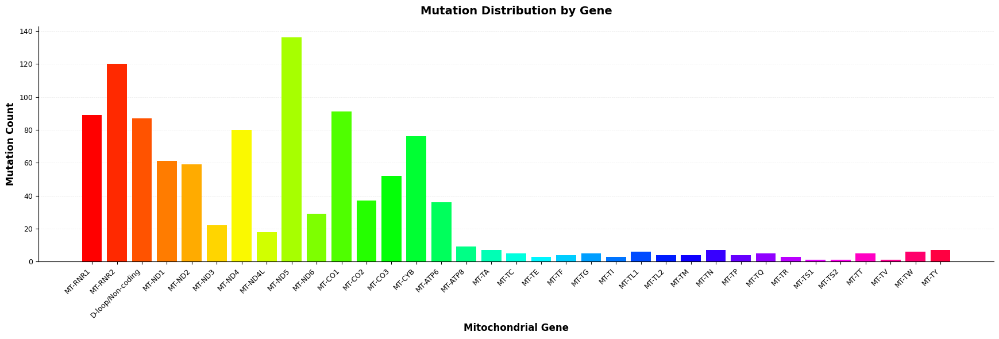


Total genes with variants: 35

Genes with counts:
MT-RNR1: 89
MT-RNR2: 120
D-loop/Non-coding: 87
MT-ND1: 61
MT-ND2: 59
MT-ND3: 22
MT-ND4: 80
MT-ND4L: 18
MT-ND5: 136
MT-ND6: 29
MT-CO1: 91
MT-CO2: 37
MT-CO3: 52
MT-CYB: 76
MT-ATP6: 36
MT-ATP8: 9
MT-TA: 7
MT-TC: 5
MT-TE: 3
MT-TF: 4
MT-TG: 5
MT-TI: 3
MT-TL1: 6
MT-TL2: 4
MT-TM: 4
MT-TN: 7
MT-TP: 4
MT-TQ: 5
MT-TR: 3
MT-TS1: 1
MT-TS2: 1
MT-TT: 5
MT-TV: 1
MT-TW: 6
MT-TY: 7


In [59]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# Define gene order matching the template image
gene_order = [
    'MT-RNR1', 'MT-RNR2', 'MT-D-LOOP', 'MT-DLOOP', 'D-loop/Non-coding',  # rRNA and D-loop
    'MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4', 'MT-ND4L', 'MT-ND5', 'MT-ND6',  # Complex I
    'MT-CO1', 'MT-CO2', 'MT-CO3',  # Complex IV (Cytochrome c oxidase)
    'MT-CYB',  # Complex III (Cytochrome b)
    'MT-ATP6', 'MT-ATP8',  # Complex V (ATP synthase)
    'MT-TA', 'MT-TC', 'MT-TD', 'MT-TE', 'MT-TF', 'MT-TG', 'MT-TH', 'MT-TI',  # tRNAs
    'MT-TK', 'MT-TL1', 'MT-TL2', 'MT-TM', 'MT-TN', 'MT-TP', 'MT-TQ', 'MT-TR',
    'MT-TS1', 'MT-TS2', 'MT-TT', 'MT-TV', 'MT-TW', 'MT-TY'
]

# Count variants per gene
gene_counts_dict = variant_summary['gene'].value_counts().to_dict()

# Create ordered counts
gene_counts_ordered = []
genes_present = []

for gene in gene_order:
    if gene in gene_counts_dict and gene_counts_dict[gene] > 0:
        genes_present.append(gene)
        gene_counts_ordered.append(gene_counts_dict[gene])

# Create the plot
fig, ax = plt.subplots(figsize=(max(16, len(genes_present) * 0.5), 6))

# Get colors - one per gene
colors = generate_colors(len(genes_present))

# Create bar plot
ax.bar(range(len(genes_present)), gene_counts_ordered, width=0.8, color=colors, edgecolor='none')

# Set x-axis labels
ax.set_xticks(range(len(genes_present)))
ax.set_xticklabels(genes_present, rotation=45, ha='right', fontsize=9)

# Styling
ax.set_title('Mutation Distribution by Gene', fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Mitochondrial Gene', fontsize=12, fontweight='bold')
ax.set_ylabel('Mutation Count', fontsize=12, fontweight='bold')

plt.yticks(fontsize=9)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Light grid on y-axis only
ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# Print summary
print(f"\nTotal genes with variants: {len(genes_present)}")
print(f"\nGenes with counts:")
for gene, count in zip(genes_present, gene_counts_ordered):
    print(f"{gene}: {count}")

In [131]:
# Look at all available columns in variant_summary
print("Available variant-level statistics:")
print(variant_summary.columns.tolist())
print()

Available variant-level statistics:
['variance', 'n_cells_conf_detected', 'n_cells_over_5', 'n_cells_over_10', 'n_cells_over_50', 'mean_coverage', 'strand_concordance', 'vaf_overall']



In [4]:
import numpy as np
import pandas as pd

# Get the matrices
vaf_matrix = mgatk.obsm['variant_vaf'].copy()
coverage_matrix = mgatk.obsm['variant_coverage']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']
variant_summary = mgatk.uns['variant_summary']

print(f"Original VAF matrix shape: {vaf_matrix.shape}")
print(f"Non-zero VAF values before filtering: {(vaf_matrix > 0).sum()}")

variants_with_expression_before = (vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell before filtering: {variants_with_expression_before}")

# Create high-quality filtered VAF matrix
high_quality_vaf_matrix = vaf_matrix.copy()

# For each variant, apply quality filters
for i, variant_name in enumerate(variant_names):
    # Get variant-level statistics
    variant_stats = variant_summary.iloc[i]
    strand_concordance = variant_stats['strand_concordance']
    mean_coverage = variant_stats['mean_coverage']
    n_cells_conf_detected = variant_stats['n_cells_conf_detected']  # Fixed: get from variant_stats
    
    # Get cell-level data
    cell_coverage = coverage_matrix[:, i]
    
    # Check variant-level quality
    variant_passes = (
        (strand_concordance >= 0.5) &
        (mean_coverage >= 5) & # variant level, average coverage across all cells for this variant position
        (n_cells_conf_detected >= 2) # quality based count rather than VAF based, sufficient coverage
    )
    
    # If variant fails, zero out all cells for this variant
    if not variant_passes:
        high_quality_vaf_matrix[:, i] = 0
    

print(f"Non-zero VAF values after high-quality filtering: {(high_quality_vaf_matrix > 0).sum()}")
print(f"Percentage of calls retained: {(high_quality_vaf_matrix > 0).sum() / (vaf_matrix > 0).sum() * 100:.1f}%")

variants_with_expression_after = (high_quality_vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell after filtering: {variants_with_expression_after}")
print(f"Percentage of variants retained: {variants_with_expression_after / variants_with_expression_before * 100:.1f}%")

variants_eliminated = variants_with_expression_before - variants_with_expression_after
print(f"Variants completely eliminated by filtering: {variants_eliminated}")
print("variants left:", variants_with_expression_after)

# Store the high-quality filtered matrix
mgatk.obsm['variant_vaf_high_quality'] = high_quality_vaf_matrix

print("\nHigh-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']")

Original VAF matrix shape: (3346, 44436)
Non-zero VAF values before filtering: 371526
Variants with at least one expressing cell before filtering: 43206
Non-zero VAF values after high-quality filtering: 364592
Percentage of calls retained: 98.1%
Variants with at least one expressing cell after filtering: 38202
Percentage of variants retained: 88.4%
Variants completely eliminated by filtering: 5004
variants left: 38202

High-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']


Processing variant 3857: Index 2123, Name: C-8317-T
3


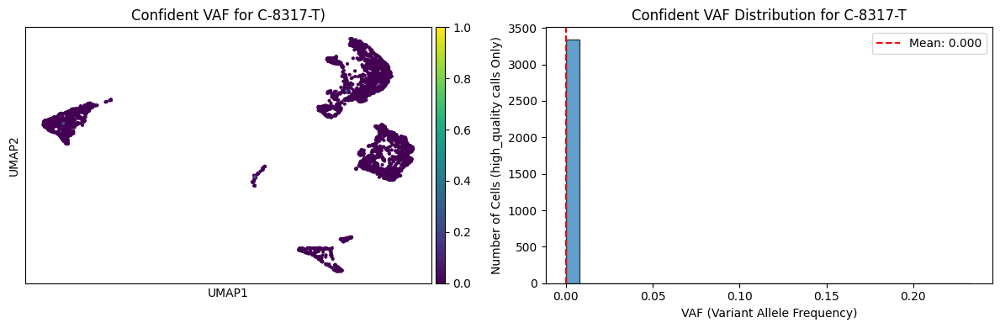

In [129]:
## Plotting 3243
variant_name = 'C-8317-T' # Get the actual variant name string
variant_idx = mgatk.uns['variant_names'].index(variant_name)

print(f"Processing variant {i+1}: Index {variant_idx}, Name: {variant_name}")

# Get VAF and confident matrices
vaf_matrix = mgatk.obsm['variant_vaf_high_quality']


# Extract VAF and confidence for this specific variant using the integer index
vaf_values = mgatk.obsm['variant_vaf_high_quality'][:, variant_idx]

print(np.sum(vaf_values > 0))



# Get filtered VAF values
filtered_vaf_values = vaf_values

# Create a temporary column for plotting (confident calls only)
temp_vaf_col = np.zeros(len(mgatk.obs))
temp_vaf_col = filtered_vaf_values


# Add temporary column to obs for plotting
mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# UMAP plot (only confident calls will be colored)
sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1, 
            title=f"Confident VAF for {variant_name})", 
            ax=ax1, show=False, na_color='lightgray')

# Histogram of confident VAF values only
ax2.hist(filtered_vaf_values, bins=30, alpha=0.7, edgecolor='black')
ax2.set_xlabel('VAF (Variant Allele Frequency)')
ax2.set_ylabel('Number of Cells (high_quality calls Only)')
ax2.set_title(f'Confident VAF Distribution for {variant_name}')
ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--', 
            label=f'Mean: {filtered_vaf_values.mean():.3f}')
ax2.legend()

plt.tight_layout()
plt.show()

/tmp/ipykernel_2777594/2718193487.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  inferno = cm.get_cmap('inferno', 256)


Processing C-16189-T: 24 cells


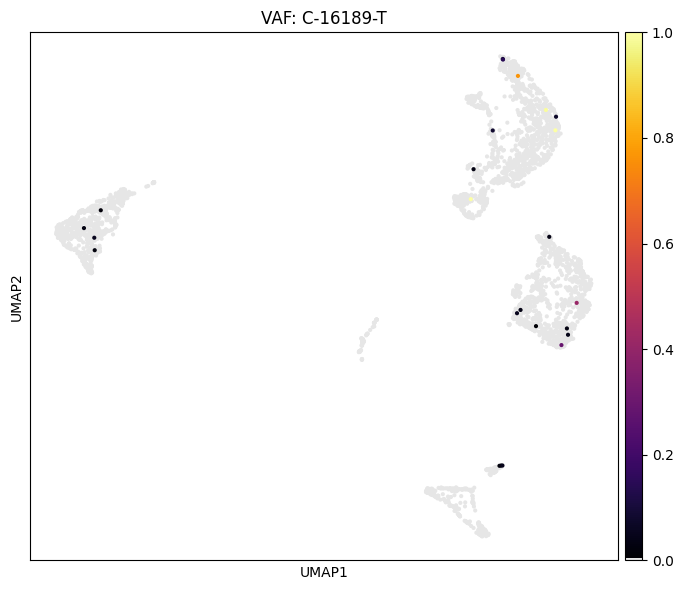

Processing C-980-T: 21 cells


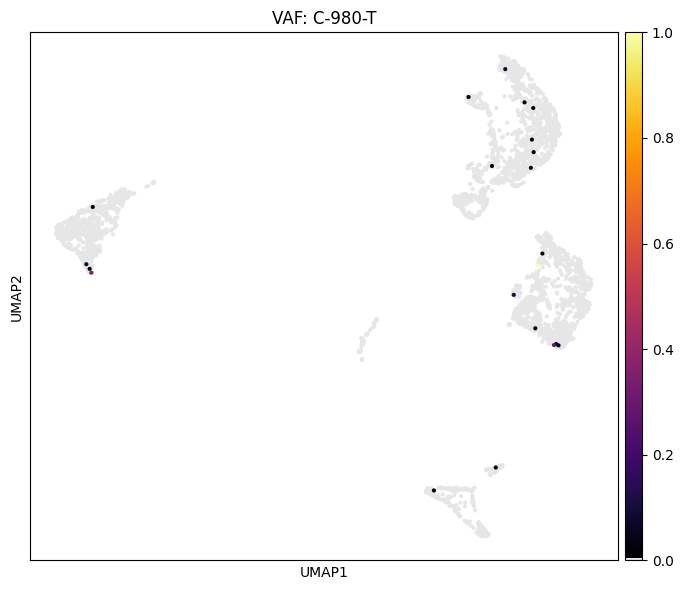

Processing C-1189-T: 32 cells


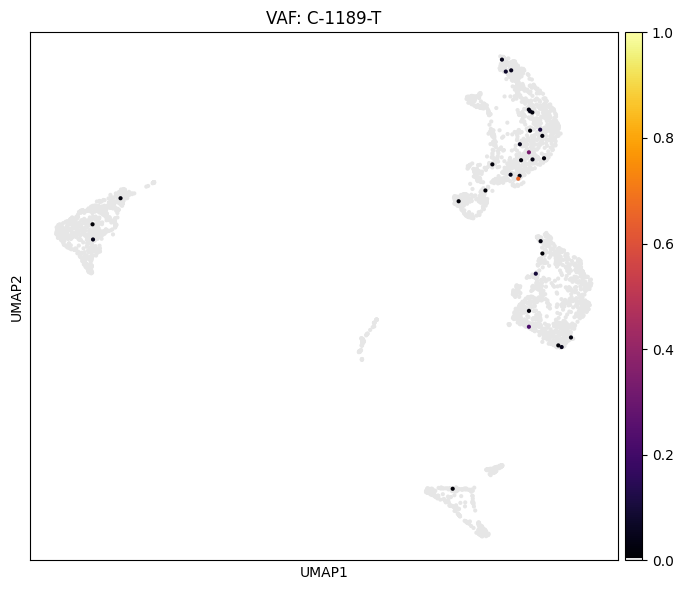

Processing A-2209-G: 30 cells


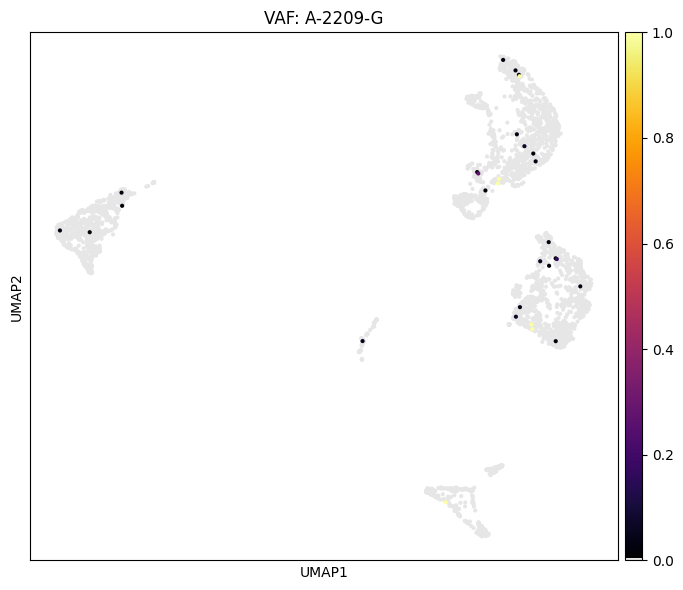

Processing A-1252-G: 41 cells


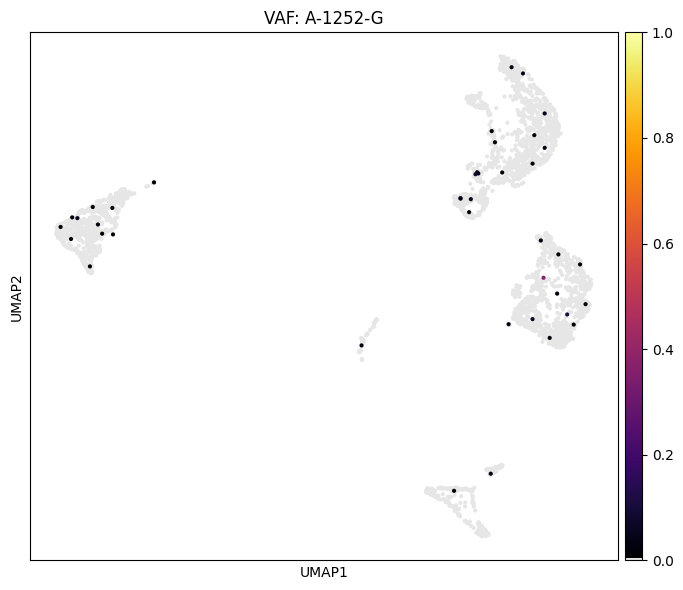

Processing C-4954-T: 26 cells


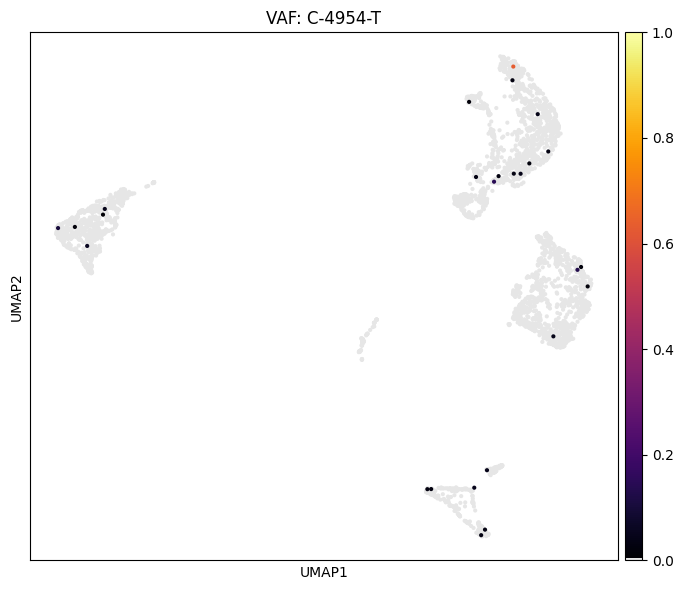

Processing C-15726-T: 30 cells


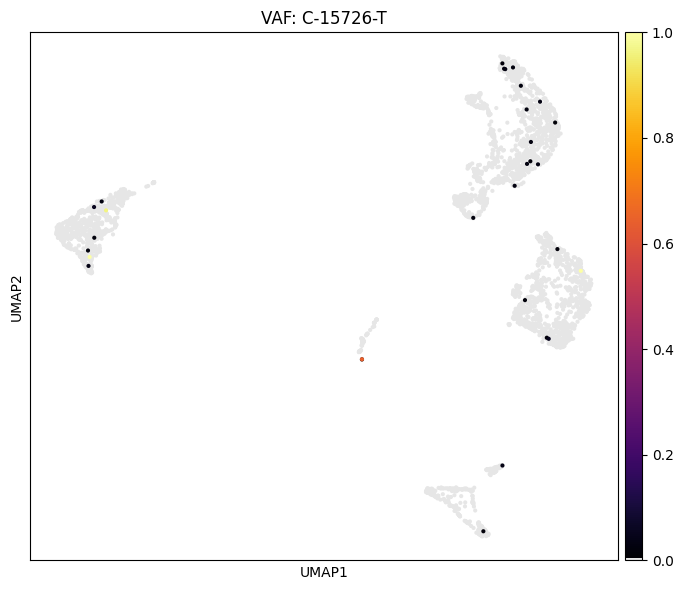

Processing A-2174-G: 20 cells


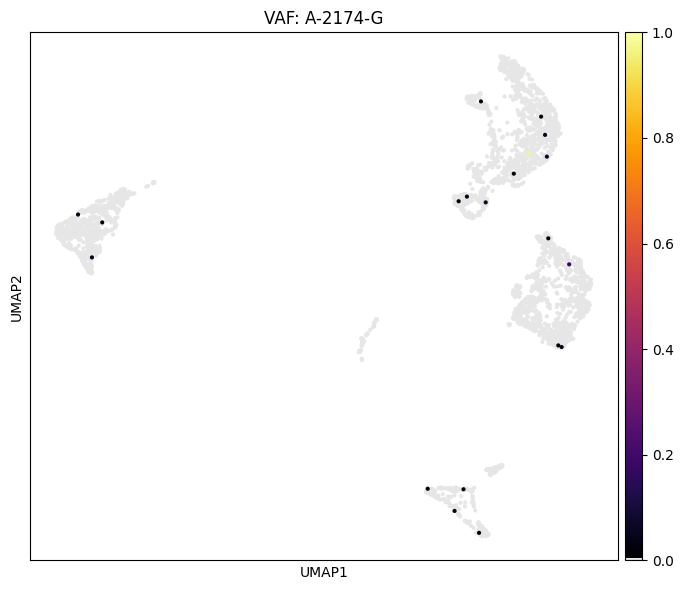

Processing A-3239-g: 24 cells


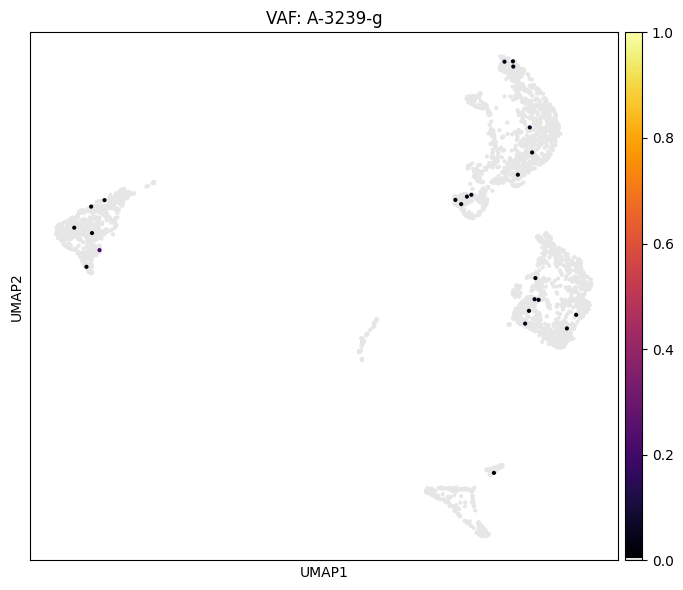

Processing C-2075-T: 30 cells


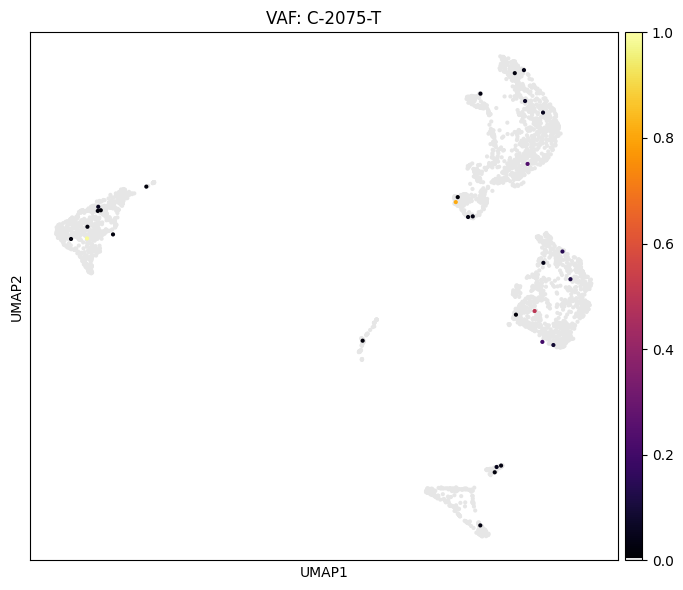

Processing A-10197-G: 32 cells


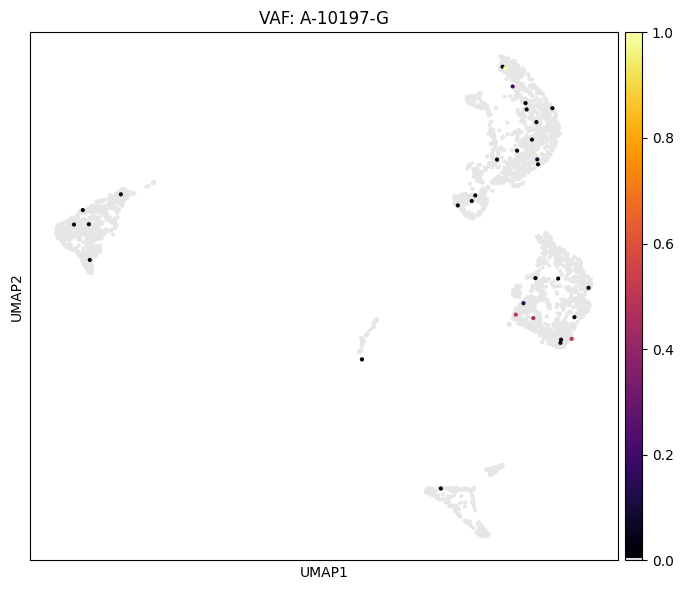

Processing A-2333-G: 41 cells


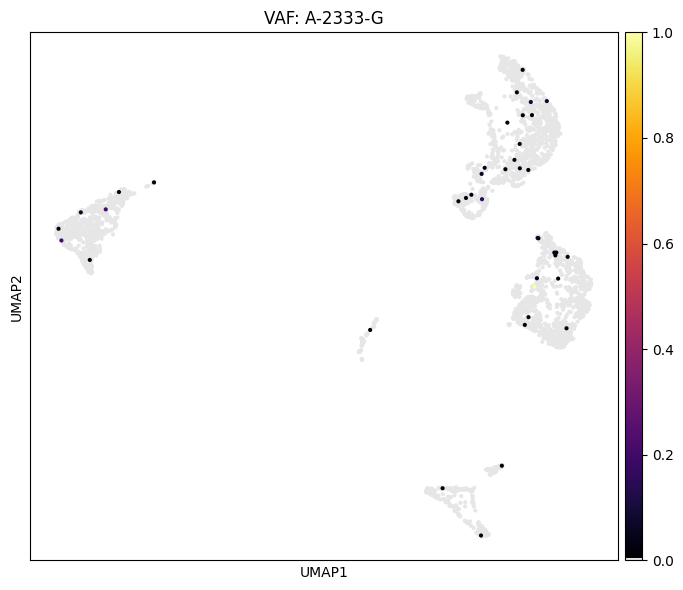

Processing C-10809-T: 11 cells


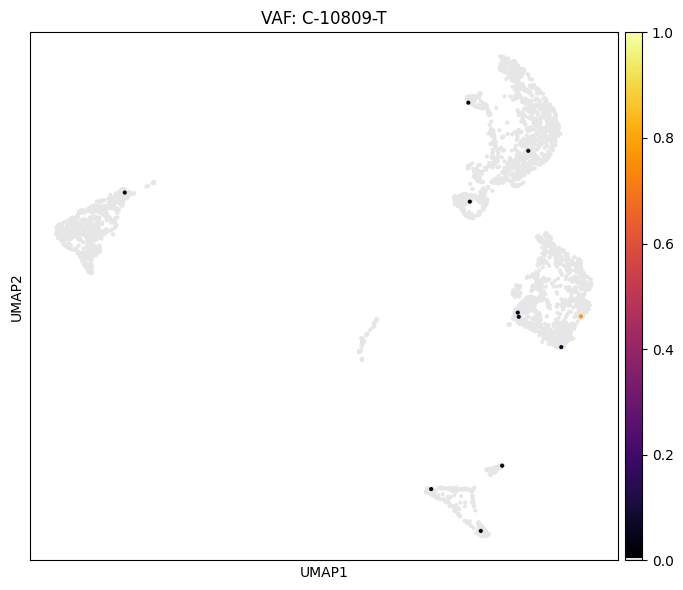

Processing G-13434-A: 11 cells


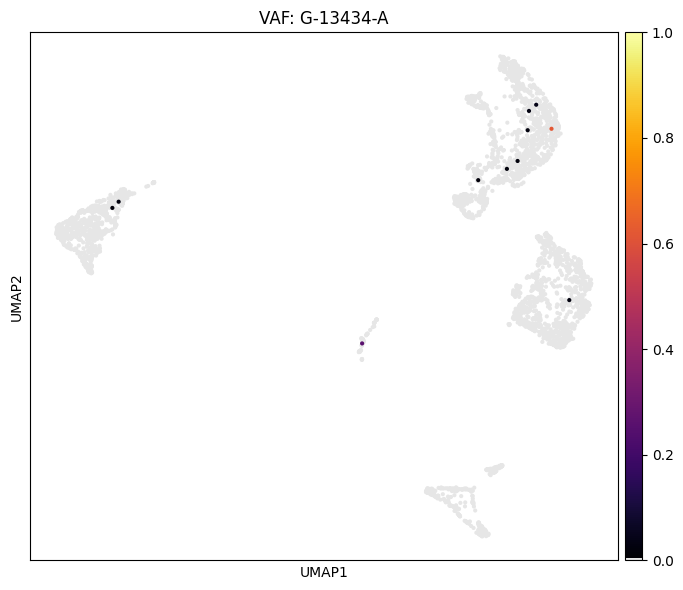

Processing A-6182-G: 22 cells


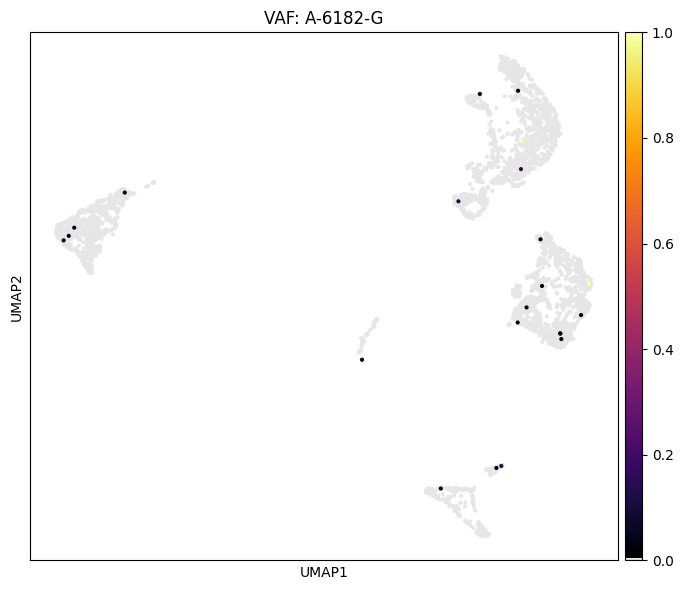

Processing C-8317-T: 18 cells


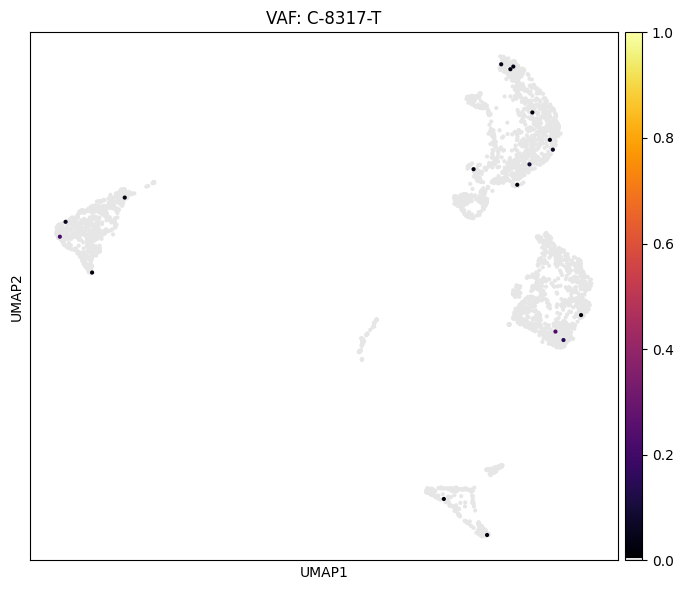

In [5]:
# Run the filtering (make sure you have n_cells_conf_detected >= 2)
# Then plot the 16 variants that pass

import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Create custom colormap
import matplotlib.cm as cm
inferno = cm.get_cmap('inferno', 256)
colors = inferno(np.linspace(0, 1, 256))
colors[0] = [0.9, 0.9, 0.9, 1]
custom_inferno = LinearSegmentedColormap.from_list('custom_inferno', colors)

# Variants that should pass (16 total)
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Plot each variant
for variant_name in variants_that_pass:
    if variant_name in mgatk.uns['variant_names']:
        variant_idx = mgatk.uns['variant_names'].index(variant_name)
        
        vaf_values = mgatk.obsm['variant_vaf_high_quality'][:, variant_idx]
        n_cells = np.sum(vaf_values > 0)
        
        print(f"Processing {variant_name}: {n_cells} cells")
        
        if n_cells > 0:
            mgatk.obs[f'temp_vaf_{variant_idx}'] = vaf_values
            
            fig, ax = plt.subplots(1, 1, figsize=(7, 6))
            sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', 
                       cmap=custom_inferno, vmin=0, vmax=1, 
                       title=f"VAF: {variant_name}", 
                       ax=ax, show=False)
            plt.tight_layout()
            plt.show()
        else:
            print(f"  -> No cells with variant after filtering")

Plotting first 5 confident variants out of 1083 total confident variants
Processing variant 1: Index 0, Name: A-10500-G
No confident non-zero calls for variant A-10500-G
Processing variant 2: Index 1, Name: A-10925-T


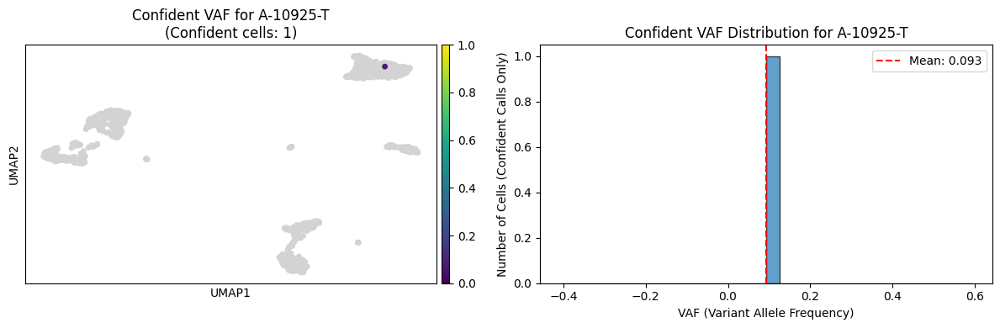

Variant A-10925-T (Index 1):
  Confident cells detected: 1
  Mean coverage: 13.2
  Total cells: 1212
  Confident calls: [False False False ... False False False]
  Confident non-zero calls: 1
  Mean confident VAF: 0.093
  Confident VAF range: 0.093 - 0.093
---
Processing variant 3: Index 2, Name: A-11719-G


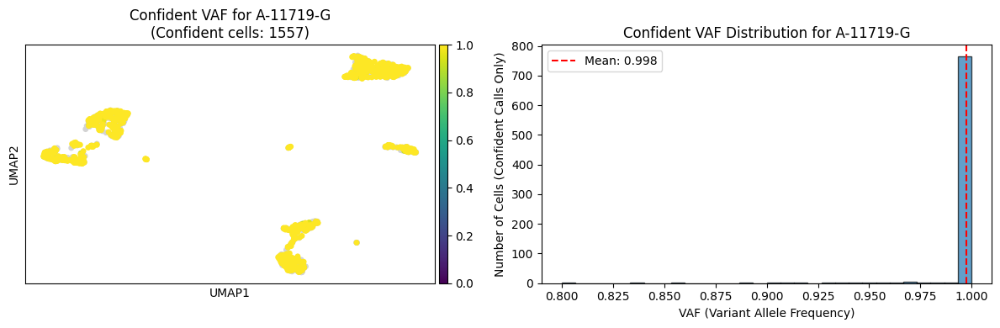

Variant A-11719-G (Index 2):
  Confident cells detected: 1557
  Mean coverage: 14.3
  Total cells: 1212
  Confident calls: [ True False False ... False False  True]
  Confident non-zero calls: 799
  Mean confident VAF: 0.998
  Confident VAF range: 0.800 - 1.000
---
Processing variant 4: Index 3, Name: A-11802-T
No confident non-zero calls for variant A-11802-T
Processing variant 5: Index 4, Name: A-11838-T


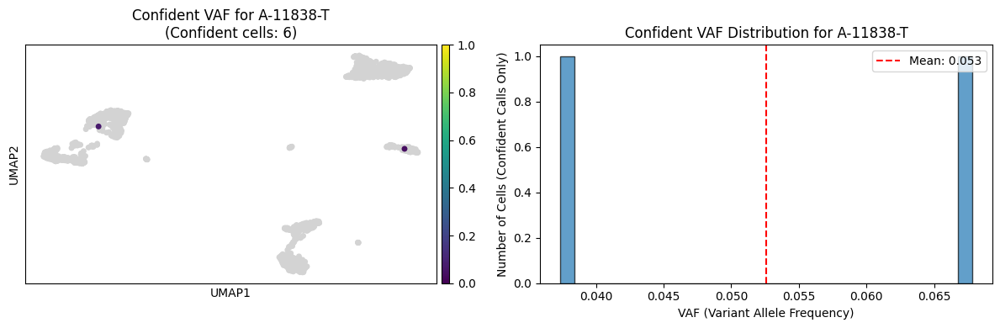

Variant A-11838-T (Index 4):
  Confident cells detected: 6
  Mean coverage: 17.2
  Total cells: 1212
  Confident calls: [False False False ... False False False]
  Confident non-zero calls: 2
  Mean confident VAF: 0.053
  Confident VAF range: 0.037 - 0.068
---


In [ ]:
# Plot confident variants with UMAP and VAF distribution, my code
import matplotlib.pyplot as plt
import numpy as np

# Get confident variants (those with at least one cell having confident detection)
confident_variants = mgatk.uns['variant_summary'][mgatk.uns['variant_summary']['n_cells_conf_detected'] > 0]

print(f"Plotting first 5 confident variants out of {len(confident_variants)} total confident variants")

# Get the variant names list
variant_names = mgatk.uns['variant_names']

for i, variant_idx in enumerate(confident_variants.index[:5]):  # Plot top 5 confident variants
    # variant_idx is already the integer index we need
    variant_name = variant_names[variant_idx]  # Get the actual variant name string
    
    print(f"Processing variant {i+1}: Index {variant_idx}, Name: {variant_name}")
    
    # Get VAF and confident matrices
    vaf_matrix = mgatk.obsm['variant_vaf']
    confident_matrix = mgatk.obsm['variant_confident']
    
    # Extract VAF and confidence for this specific variant using the integer index
    vaf_values = vaf_matrix[:, variant_idx]
    confident_calls = confident_matrix[:, variant_idx]
    
    # Filter for confident calls AND non-zero VAF
    confident_and_nonzero_mask = confident_calls & (vaf_values > 0)
    
    if not confident_and_nonzero_mask.any():
        print(f"No confident non-zero calls for variant {variant_name}")
        continue
    
    # Get filtered VAF values
    filtered_vaf_values = vaf_values[confident_and_nonzero_mask]
    
    # Create a temporary column for plotting (confident calls only)
    temp_vaf_col = np.zeros(len(mgatk.obs))
    temp_vaf_col[confident_and_nonzero_mask] = filtered_vaf_values
    # Set non-confident or zero calls to NaN for proper plotting
    temp_vaf_col[~confident_and_nonzero_mask] = np.nan
    
    # Add temporary column to obs for plotting
    mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # UMAP plot (only confident calls will be colored)
    sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1, 
               title=f"Confident VAF for {variant_name}\n(Confident cells: {confident_variants.loc[variant_idx, 'n_cells_conf_detected']})", 
               ax=ax1, show=False, na_color='lightgray')
    
    # Histogram of confident VAF values only
    ax2.hist(filtered_vaf_values, bins=30, alpha=0.7, edgecolor='black')
    ax2.set_xlabel('VAF (Variant Allele Frequency)')
    ax2.set_ylabel('Number of Cells (Confident Calls Only)')
    ax2.set_title(f'Confident VAF Distribution for {variant_name}')
    ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--', 
                label=f'Mean: {filtered_vaf_values.mean():.3f}')
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    total_cells = len(mgatk.obs)
    confident_cells = confident_calls.sum()
    confident_nonzero_cells = len(filtered_vaf_values)
    
    print(f"Variant {variant_name} (Index {variant_idx}):")
    print(f"  Confident cells detected: {confident_variants.loc[variant_idx, 'n_cells_conf_detected']}")
    print(f"  Mean coverage: {confident_variants.loc[variant_idx, 'mean_coverage']:.1f}")
    print(f"  Total cells: {total_cells}")
    print(f"  Confident calls: {confident_calls}")
    print(f"  Confident non-zero calls: {confident_nonzero_cells}")
    print(f"  Mean confident VAF: {filtered_vaf_values.mean():.3f}")
    print(f"  Confident VAF range: {filtered_vaf_values.min():.3f} - {filtered_vaf_values.max():.3f}")
    print("---")
    
    # Clean up temporary column
    mgatk.obs.drop(columns=[f'temp_vaf_{variant_idx}'], inplace=True)

In [ ]:
#save mgatk object 
/mnt/claw-raid/elliot/mgatk_analysis.h5ad

Found 3 enriched variants
   idx       name  in_target  in_other  enrichment
0  264   C-6832-T          4         0         4.0
2  905  G-13676-A          2         0         2.0
1  677  C-16086-T          3         1         1.5


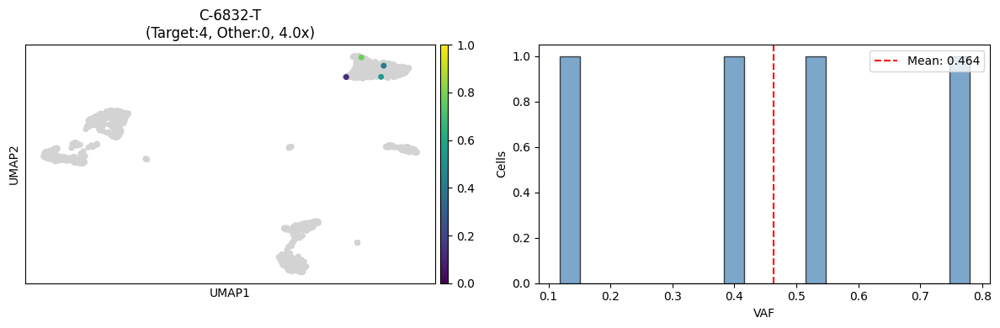

In [80]:
# Find cluster-enriched variants
TARGET_CLUSTERS = ['0']
MIN_CELLS_IN_TARGET = 2
MAX_CELLS_IN_OTHER = 3
MIN_ENRICHMENT = 1.5

import numpy as np
import pandas as pd

_mask = np.isin(mgatk.obs['leiden'].values, TARGET_CLUSTERS)
_enriched = []

for _i in range(len(mgatk.uns['variant_names'])):
    _vaf = mgatk.obsm['variant_vaf'][:, _i]
    _conf = mgatk.obsm['variant_confident'][:, _i]
    _in_target = (_conf & _mask & (_vaf > 0)).sum()
    _in_other = (_conf & ~_mask & (_vaf > 0)).sum()
    _enrich = _in_target / (_in_other + 1)
    
    if _in_target >= MIN_CELLS_IN_TARGET and _in_other <= MAX_CELLS_IN_OTHER and _enrich >= MIN_ENRICHMENT:
        _enriched.append({'idx': _i, 'name': mgatk.uns['variant_names'][_i], 
                         'in_target': _in_target, 'in_other': _in_other, 'enrichment': _enrich})

enriched_df = pd.DataFrame(_enriched).sort_values('enrichment', ascending=False)
print(f"Found {len(enriched_df)} enriched variants")
print(enriched_df)

VARIANT_TO_PLOT = 0

import matplotlib.pyplot as plt
import scanpy as sc

_r = enriched_df.iloc[VARIANT_TO_PLOT]
_m = mgatk.obsm['variant_confident'][:, _r['idx']] & np.isin(mgatk.obs['leiden'].values, TARGET_CLUSTERS) & (mgatk.obsm['variant_vaf'][:, _r['idx']] > 0)
mgatk.obs['_tmp'] = np.where(_m, mgatk.obsm['variant_vaf'][:, _r['idx']], np.nan)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
sc.pl.umap(mgatk, color='_tmp', cmap="viridis", vmin=0, vmax=1,
           title=f"{_r['name']}\n(Target:{int(_r['in_target'])}, Other:{int(_r['in_other'])}, {_r['enrichment']:.1f}x)",
           ax=ax1, show=False, na_color='lightgray')
ax2.hist(mgatk.obs.loc[_m, '_tmp'].dropna(), bins=20, alpha=0.7, edgecolor='black', color='steelblue')
ax2.set_xlabel('VAF')
ax2.set_ylabel('Cells')
ax2.axvline(mgatk.obs.loc[_m, '_tmp'].mean(), color='red', linestyle='--', label=f'Mean: {mgatk.obs.loc[_m, "_tmp"].mean():.3f}')
ax2.legend()
plt.tight_layout()
plt.show()
mgatk.obs.drop(columns=['_tmp'], inplace=True)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Convert to dense array if sparse
coverage_matrix = mgatk.X
if hasattr(coverage_matrix, 'toarray'):
    coverage_matrix = coverage_matrix.toarray()

print(f"Coverage matrix shape: {coverage_matrix.shape}")

# Get cell names
cell_names = mgatk.obs_names

# Create the plot
plt.figure(figsize=(15, 10))

# Plot each cell as a line
for i, cell_name in enumerate(cell_names):
    coverage = coverage_matrix[i, :]
    # Ensure both x and y have same dimensions
    x_positions = range(len(coverage))
    plt.plot(x_positions, coverage, alpha=0.7, linewidth=1, label=cell_name)

plt.xlabel('Position on Mitochondrial Genome')
plt.ylabel('Read Depth')
plt.title('Mitochondrial Genome Coverage for All Cells')
plt.grid(True, alpha=0.3)

# Only show legend if there aren't too many cells
if len(cell_names) <= 20:
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

Coverage matrix shape: (1475, 6062095)


KeyboardInterrupt: 

Variant A-10500-G: Insufficient data points (0)
Variant A-10925-T: Insufficient data points (1)


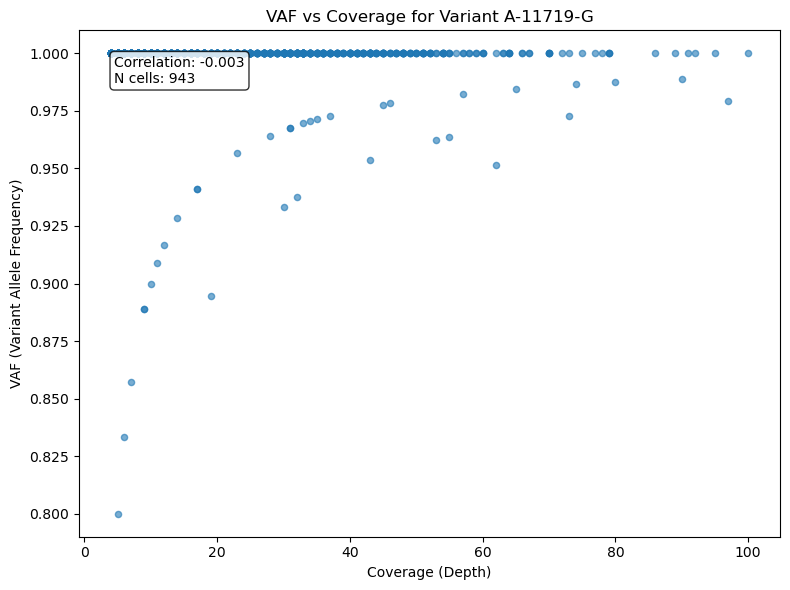

Variant A-11719-G:
  Coverage range: 4.0 - 100.0
  Mean coverage: 21.9
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): -0.003
---
Variant A-11802-T: Insufficient data points (0)
Variant A-11838-T: Insufficient data points (3)
Variant A-15170-G: Insufficient data points (2)


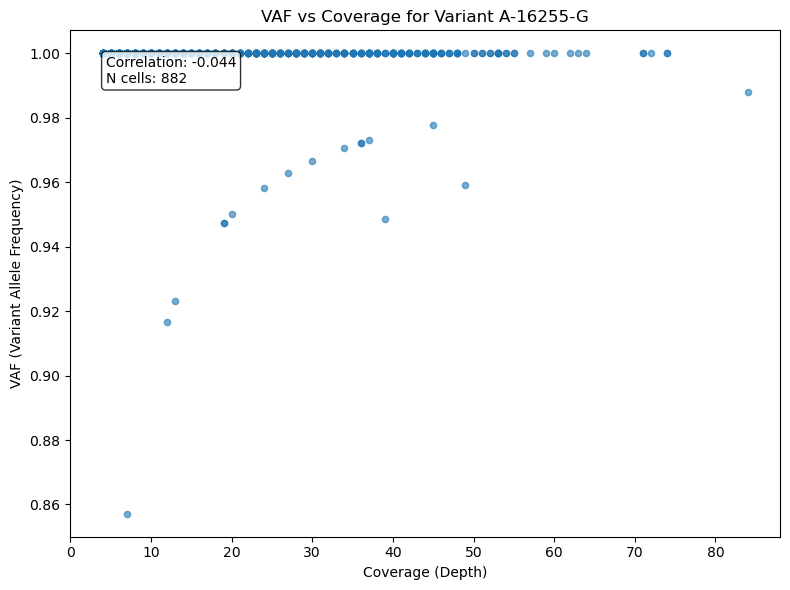

Variant A-16255-G:
  Coverage range: 4.0 - 84.0
  Mean coverage: 18.4
  VAF range: 0.857 - 1.000
  Correlation (VAF vs Coverage): -0.044
---


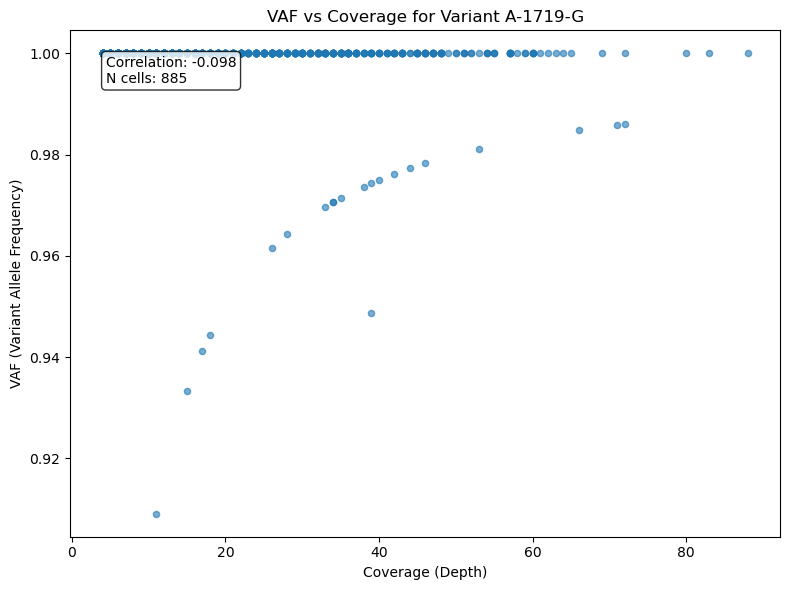

Variant A-1719-G:
  Coverage range: 4.0 - 88.0
  Mean coverage: 19.7
  VAF range: 0.909 - 1.000
  Correlation (VAF vs Coverage): -0.098
---
Variant A-1770-G: Insufficient data points (1)


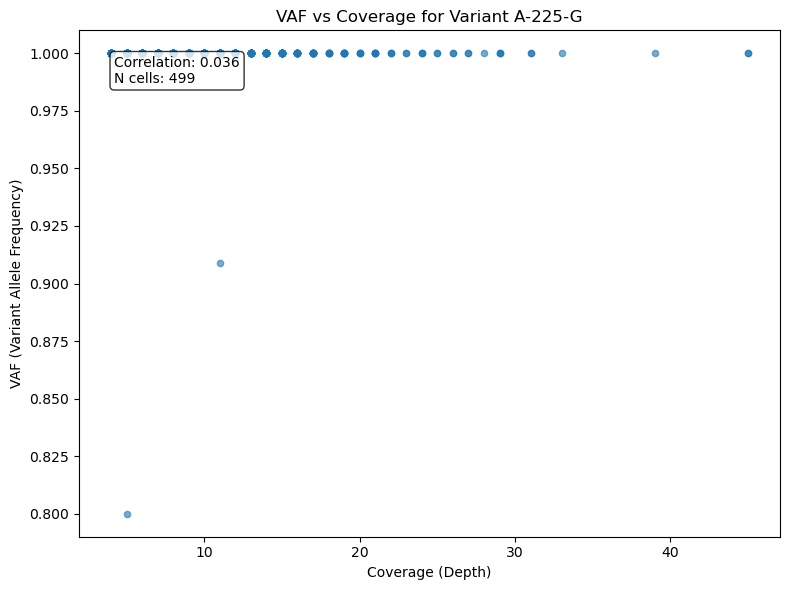

Variant A-225-G:
  Coverage range: 4.0 - 45.0
  Mean coverage: 10.5
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): 0.036
---
Variant A-2573-G: Insufficient data points (0)
Variant A-2620-g: Insufficient data points (0)
Variant A-4148-G: Insufficient data points (1)
Variant A-5585-G: Insufficient data points (2)
Variant A-64-C: Insufficient data points (0)
Variant A-8206-G: Insufficient data points (0)
Variant A-822-G: Insufficient data points (1)
Variant A-9342-G: Insufficient data points (0)
Variant C-11485-T: Insufficient data points (1)
Variant C-11684-T: Insufficient data points (1)
Variant C-12758-T: Insufficient data points (1)
Variant C-13006-T: Insufficient data points (1)
Variant C-13039-T: Insufficient data points (0)
Variant C-13163-T: Insufficient data points (1)
Variant C-13830-T: Insufficient data points (1)


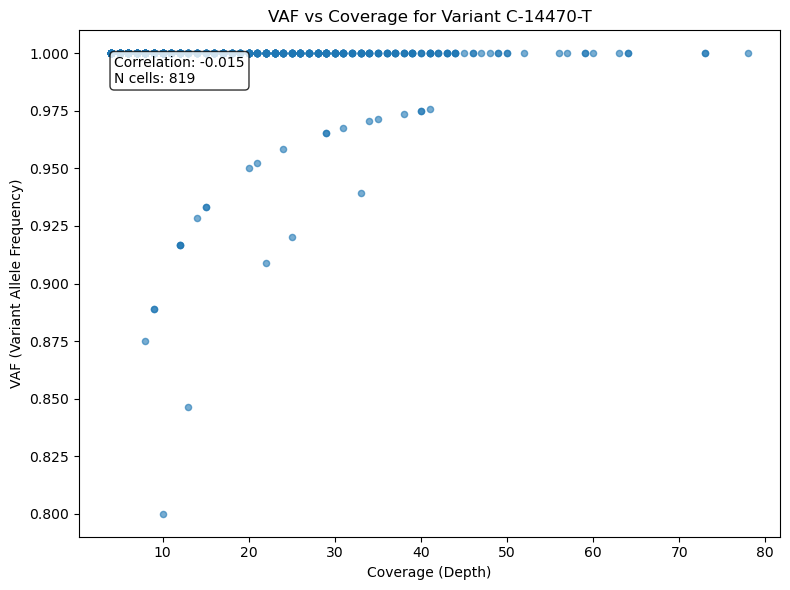

Variant C-14470-T:
  Coverage range: 4.0 - 78.0
  Mean coverage: 16.1
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): -0.015
---
Variant C-15306-T: Insufficient data points (1)
Variant C-15784-T: Insufficient data points (1)


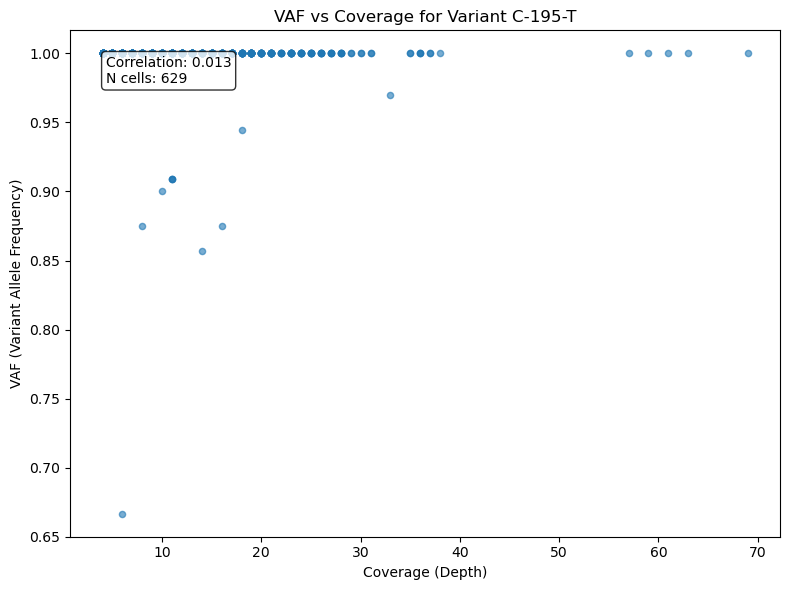

Variant C-195-T:
  Coverage range: 4.0 - 69.0
  Mean coverage: 12.0
  VAF range: 0.667 - 1.000
  Correlation (VAF vs Coverage): 0.013
---
Variant C-3264-t: Insufficient data points (0)


In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Get the matrices and variant info
vaf_matrix = mgatk.obsm['variant_vaf']        # cells x variants
coverage_matrix = mgatk.obsm['variant_coverage']  # cells x variants  
variant_names = mgatk.uns['variant_names']

# For variants in your confident_variants
for i, variant_idx in enumerate(confident_variants.index[:30]):  # Plot top 5 confident variants
    # variant_idx is already the integer index we need
    variant_name = variant_names[variant_idx]  # Get the actual variant name string
    try:
        variant_idx = confident_variants.index[i]  # Get the actual variant index
        # Find the index of this variant in the variant_names list
        variant_idx = variant_names.index(variant_name)
        
        # Get VAF and coverage values for this variant across all cells
        vaf_values = vaf_matrix[:, variant_idx]
        coverage_values = coverage_matrix[:, variant_idx]
        
        # Filter for cells with non-zero VAF and valid coverage
        mask = (vaf_values > 0) & (coverage_values > 0)
        
        if mask.sum() > 5:  # Need at least 5 points for meaningful plot
            filtered_vaf = vaf_values[mask]
            filtered_coverage = coverage_values[mask]
            
            # Create scatter plot
            fig, ax = plt.subplots(1, 1, figsize=(8, 6))
            
            scatter = ax.scatter(filtered_coverage, filtered_vaf, alpha=0.6, s=20)
            ax.set_xlabel('Coverage (Depth)')
            ax.set_ylabel('VAF (Variant Allele Frequency)')
            ax.set_title(f'VAF vs Coverage for Variant {variant_name}')
            
            # Add statistics
            if len(filtered_coverage) > 1 and len(set(filtered_coverage)) > 1:
                correlation = np.corrcoef(filtered_coverage, filtered_vaf)[0, 1]
            else:
                correlation = np.nan
                
            ax.text(0.05, 0.95, f'Correlation: {correlation:.3f}\nN cells: {len(filtered_vaf)}', 
                    transform=ax.transAxes, verticalalignment='top', 
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            plt.tight_layout()
            plt.show()
            
            # Print summary
            print(f"Variant {variant_name}:")
            print(f"  Coverage range: {filtered_coverage.min():.1f} - {filtered_coverage.max():.1f}")
            print(f"  Mean coverage: {filtered_coverage.mean():.1f}")
            print(f"  VAF range: {filtered_vaf.min():.3f} - {filtered_vaf.max():.3f}")
            print(f"  Correlation (VAF vs Coverage): {correlation:.3f}")
            print("---")
        else:
            print(f"Variant {variant_name}: Insufficient data points ({mask.sum()})")
            
    except Exception as e:
        print(f"Error processing variant {variant_name}: {e}")

In [10]:
import numpy as np
import pandas as pd

# Get the matrices
vaf_matrix = mgatk.obsm['variant_vaf'].copy()  # Make a copy to modify
coverage_matrix = mgatk.obsm['variant_coverage']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']
variant_summary = mgatk.uns['variant_summary']

print(f"Original VAF matrix shape: {vaf_matrix.shape}")
print(f"Non-zero VAF values before filtering: {(vaf_matrix > 0).sum()}")

# Count variants with at least one expressing cell before filtering
variants_with_expression_before = (vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell before filtering: {variants_with_expression_before}")

# Create high-quality filtered VAF matrix
high_quality_vaf_matrix = vaf_matrix.copy()
variant_names_list = []
# For each variant, apply cell-level quality filters
for i, variant_name in enumerate(variant_names):
    # Get variant-level statistics
    variant_stats = variant_summary.iloc[i]
    strand_concordance = variant_stats['strand_concordance']
    variance = variant_stats['variance'] 
    mean_coverage = variant_stats['mean_coverage']
    
    # Get cell-level data for this variant
    cell_vaf = vaf_matrix[:, i]
    cell_coverage = coverage_matrix[:, i]
    cell_confident = confident_matrix[:, i]
    
    # Define quality criteria for this variant's cells
    quality_mask = (
        (strand_concordance >= 0.5) &  # Variant-level criterion
        (mean_coverage >= 20) &        # Variant-level criterion
        (cell_vaf >= 0.1)        # Cell-level: VAF > 10%
    )
    
    # Set non-qualifying cells to 0 for this variant
    high_quality_vaf_matrix[~quality_mask, i] = 0

print(f"Non-zero VAF values after high-quality filtering: {(high_quality_vaf_matrix > 0).sum()}")
print(f"Percentage of calls retained: {(high_quality_vaf_matrix > 0).sum() / (vaf_matrix > 0).sum() * 100:.1f}%")

# Count variants with at least one expressing cell after filtering
variants_with_expression_after = (high_quality_vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell after filtering: {variants_with_expression_after}")
print(f"Percentage of variants retained: {variants_with_expression_after / variants_with_expression_before * 100:.1f}%")

# Count variants completely eliminated by filtering
variants_eliminated = variants_with_expression_before - variants_with_expression_after
print(f"Variants completely eliminated by filtering: {variants_eliminated}")
print("variants left" , variants_with_expression_after)
# Store the high-quality filtered matrix
mgatk.obsm['variant_vaf_high_quality'] = high_quality_vaf_matrix

# Now you can use this filtered matrix for analysis
print("\nHigh-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']")

Original VAF matrix shape: (1475, 1083)
Non-zero VAF values before filtering: 24046
Variants with at least one expressing cell before filtering: 694
Non-zero VAF values after high-quality filtering: 0
Percentage of calls retained: 0.0%
Variants with at least one expressing cell after filtering: 0
Percentage of variants retained: 0.0%
Variants completely eliminated by filtering: 694
variants left 0

High-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']


In [11]:
# Boolean mask: True for variants with at least one retained (non-zero) cell
high_quality_mask = (high_quality_vaf_matrix > 0).any(axis=0)

# Get corresponding variant names
high_quality_variant_names = np.array(variant_names)[high_quality_mask]
print(high_quality_variant_names)
print(len(high_quality_variant_names))

## Flip variants to match format 
converted = [f"MT-{alt}-{pos}-{ref}" for ref, pos, alt in (v.split('-') for v in high_quality_variant_names)]
print(converted)

required_columns = ["chr", "pos", "ref", "alt"]

genebe_df = pd.DataFrame(
    [v.split('-') for v in converted],
    columns=["chr","ref", "pos", "alt"]
)
genebe_df = genebe_df[required_columns]

print(genebe_df.head())

[]
0
[]
Empty DataFrame
Columns: [chr, pos, ref, alt]
Index: []


In [12]:
import genebe as gnb
annotated_PBMC = gnb.annotate_dataframe_variants(genebe_df,use_ensembl=True,use_refseq=False, genome='hg38', flatten_consequences=False)

ModuleNotFoundError: No module named 'genebe'

In [ ]:
annotated_PBMC.to_csv('PBMC_PostMortem_genebe.csv', index=False)

In [13]:
#Gene classification 
gene_classification = {
    'MT-ND1': 'Complex I',
    'MT-ND2': 'Complex I',
    'MT-ND3': 'Complex I',
    'MT-ND4': 'Complex I',
    'MT-ND4L': 'Complex I',
    'MT-ND5': 'Complex I',
    'MT-ND6': 'Complex I',
    'MT-CO1': 'Complex IV',
    'MT-CO2': 'Complex IV',
    'MT-CO3': 'Complex IV',
    'MT-CYB': 'Complex III',
    'MT-ATP6': 'Complex V',
    'MT-ATP8': 'Complex V',
    'MT-RNR1': 'rRNA',
    'MT-RNR2': 'rRNA',
    'MT-TF': 'tRNA',  
    'MT-TV': 'tRNA',
    'MT-TI': 'tRNA',
    'MT-TL1': 'tRNA',
    'MT-TL2': 'tRNA',
    'MT-TK': 'tRNA',
    'MT-TM': 'tRNA',
    'MT-TP': 'tRNA',
    'MT-TS1': 'tRNA',
    'MT-TS2': 'tRNA',
    'MT-TW': 'tRNA',
    'MT-TA': 'tRNA',
    'MT-TC': 'tRNA',
    'MT-TY': 'tRNA',
    'MT-TH': 'tRNA',
    'MT-TG': 'tRNA',
    'MT-TR': 'tRNA',
    'MT-TN': 'tRNA',
    'MT-TD': 'tRNA',
    'MT-TE': 'tRNA',
    'MT-TQ': 'tRNA'
}

In [14]:
# Create a copy of the dataframe and add the functional classification
annotated_PBMC_classified = annotated_PBMC.copy()
annotated_PBMC_classified['gene_functional_group'] = annotated_PBMC_classified['gene_symbol'].map(gene_classification)

# Handle any genes not in the classification (mark as 'Other')
annotated_PBMC_classified['gene_functional_group'] = annotated_PBMC_classified['gene_functional_group'].fillna('Other')

# Create a 2x2 subplot layout for the pie charts
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))  # Increased figure size

# Function to prepare data for pie chart (handle NaN values and limit categories)
def prepare_pie_data(series, max_categories=20):
    # Count values, excluding NaN
    value_counts = series.value_counts(dropna=True)
    
    # If there are more categories than max_categories, group the smallest ones as "Other"
    if len(value_counts) > max_categories:
        top_categories = value_counts.head(max_categories - 1)
        other_count = value_counts.iloc[max_categories - 1:].sum()
        
        # Create new series with "Other" category
        pie_data = top_categories.copy()
        pie_data['Other'] = other_count
    else:
        pie_data = value_counts
    
    return pie_data

# 1. Gene Functional Group pie chart (using your classification)
gene_functional_data = prepare_pie_data(annotated_PBMC_classified['gene_functional_group'])
colors1 = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#ff99cc', '#c2c2f0']  # Custom colors for complexes

# Option 1: Use pctdistance and labeldistance to control spacing
wedges1, texts1, autotexts1 = ax1.pie(gene_functional_data.values, labels=gene_functional_data.index, 
                                       autopct='%1.1f%%', startangle=90, 
                                       colors=colors1[:len(gene_functional_data)],
                                       pctdistance=0.85,    # Distance of percentage labels from center
                                       labeldistance=1.1)   # Distance of category labels from center

# Adjust text properties to prevent overlap
for autotext in autotexts1:
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')
    autotext.set_color('white')

for text in texts1:
    text.set_fontsize(11)

ax1.set_title(f'Variants by Mitochondrial Functional Group\n(Total variants: {len(annotated_PBMC)})', 
              fontsize=14, fontweight='bold', pad=20)

# 2. Effect pie chart with adjusted spacing
effect_data = prepare_pie_data(annotated_PBMC['effect'])
wedges2, texts2, autotexts2 = ax2.pie(effect_data.values, labels=effect_data.index, 
                                       autopct='%1.1f%%', startangle=90,
                                       pctdistance=0.85, labeldistance=1.1)

for autotext in autotexts2:
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')
    autotext.set_color('white')

for text in texts2:
    text.set_fontsize(11)

ax2.set_title(f'Variants by Effect\n(Total variants: {len(annotated_PBMC)})', 
              fontsize=14, fontweight='bold', pad=20)

# 3. ACMG Classification pie chart
acmg_data = prepare_pie_data(annotated_PBMC['acmg_classification'])
if len(acmg_data) > 0:
    wedges3, texts3, autotexts3 = ax3.pie(acmg_data.values, labels=acmg_data.index, 
                                           autopct='%1.1f%%', startangle=90,
                                           pctdistance=0.85, labeldistance=1.1)
    
    for autotext in autotexts3:
        autotext.set_fontsize(10)
        autotext.set_fontweight('bold')
        autotext.set_color('white')
    
    for text in texts3:
        text.set_fontsize(11)
    
    ax3.set_title(f'Variants by ACMG Classification\n(Total classified: {acmg_data.sum()})', 
                  fontsize=14, fontweight='bold', pad=20)
else:
    ax3.text(0.5, 0.5, 'No ACMG Classifications\nAvailable', ha='center', va='center', fontsize=12)
    ax3.set_title('ACMG Classification', fontsize=14, fontweight='bold', pad=20)

# 4. ClinVar Classification pie chart
clinvar_data = prepare_pie_data(annotated_PBMC['clinvar_classification'])
if len(clinvar_data) > 0:
    wedges4, texts4, autotexts4 = ax4.pie(clinvar_data.values, labels=clinvar_data.index, 
                                           autopct='%1.1f%%', startangle=90,
                                           pctdistance=0.85, labeldistance=1.1)
    
    for autotext in autotexts4:
        autotext.set_fontsize(10)
        autotext.set_fontweight('bold')
        autotext.set_color('white')
    
    for text in texts4:
        text.set_fontsize(11)
    
    ax4.set_title(f'Variants by ClinVar Classification\n(Total classified: {clinvar_data.sum()})', 
                  fontsize=14, fontweight='bold', pad=20)
else:
    ax4.text(0.5, 0.5, 'No ClinVar Classifications\nAvailable', ha='center', va='center', fontsize=12)
    ax4.set_title('ClinVar Classification', fontsize=14, fontweight='bold', pad=20)

plt.tight_layout(pad=3.0)  # Add more padding between subplots
plt.show()

# Print summary statistics for each category
print("=== SUMMARY STATISTICS ===")
print(f"\n1. Mitochondrial Functional Group Distribution:")
functional_summary = annotated_PBMC_classified['gene_functional_group'].value_counts(dropna=True)
print(f"   Total functional groups represented: {len(functional_summary)}")
print(f"   Most common functional group: {functional_summary.index[0]} ({functional_summary.iloc[0]} variants)")
print(f"   All functional groups:")
for group, count in functional_summary.items():
    print(f"      {group}: {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

print(f"\n2. Individual Gene Symbol Distribution:")
gene_summary = annotated_PBMC['gene_symbol'].value_counts(dropna=True)
print(f"   Total genes represented: {len(gene_summary)}")
print(f"   Most common gene: {gene_summary.index[0]} ({gene_summary.iloc[0]} variants)")
print(f"   Top 10 genes:")
for i, (gene, count) in enumerate(gene_summary.head(10).items()):
    functional_group = gene_classification.get(gene, 'Other')
    print(f"      {i+1}. {gene} ({functional_group}): {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

print(f"\n3. Effect Distribution:")
effect_summary = annotated_PBMC['effect'].value_counts(dropna=True)
print(f"   Total effect types: {len(effect_summary)}")
if len(effect_summary) > 0:
    print(f"   Most common effect: {effect_summary.index[0]} ({effect_summary.iloc[0]} variants)")
    print(f"   All effects:")
    for effect, count in effect_summary.items():
        print(f"      {effect}: {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

acmg_summary = annotated_PBMC['acmg_classification'].value_counts(dropna=True)
print(f"\n4. ACMG Classification Distribution:")
print(f"   Total ACMG classified variants: {annotated_PBMC['acmg_classification'].notna().sum()}")
print(f"   Unclassified variants: {annotated_PBMC['acmg_classification'].isna().sum()}")
for classification, count in acmg_summary.items():
    print(f"      {classification}: {count} variants")

print(f"\n5. ClinVar Classification Distribution:")
clinvar_summary = annotated_PBMC['clinvar_classification'].value_counts(dropna=True)
print(f"   Total ClinVar classified variants: {annotated_PBMC['clinvar_classification'].notna().sum()}")
print(f"   Unclassified variants: {annotated_PBMC['clinvar_classification'].isna().sum()}")
if len(clinvar_summary) > 0:
    for classification, count in clinvar_summary.items():
        print(f"      {classification}: {count} variants")

NameError: name 'annotated_PBMC' is not defined

In [ ]:
## Import mitoTIP dataframe to look at tRNA variants only 
mitoTIP = pd.read_csv('/Users/lucascortes/Library/CloudStorage/OneDrive-Personal/Documents/Work/Pickett/ATAC-Seq/Usefull_Stuff/mitotip_scores.txt', sep='\t')
mitoTIP.head(20)

,Position,rCRS,Alt,MitoTIP_Score,Quartile,Count,Percentage,Mitomap_Status
0,577,G,:,20.3833,Q1,0,0.0,Absent
1,577,G,A,17.7500,Q1,0,0.0,Absent
2,577,G,C,17.7500,Q1,0,0.0,Absent
3,577,G,T,17.7500,Q1,0,0.0,Absent
4,578,T,:,18.6851,Q1,0,0.0,Absent
5,578,T,A,18.6851,Q1,0,0.0,Absent
6,578,T,C,16.6004,Q1,0,0.0,Absent
7,578,T,G,18.6851,Q1,0,0.0,Absent
8,579,T,:,17.6526,Q1,0,0.0,Absent
9,579,T,A,17.6526,Q1,0,0.0,Absent


In [ ]:
## Dataframe containing tRNA variants likely or poissbly pathogenic as per mitoTIP scoring method 
mitoTIP_filtered = mitoTIP[(mitoTIP['Quartile'] == 'Q2') | (mitoTIP['Quartile'] == 'Q1')]
mitoTIP_filtered.head(20)

Empty DataFrame
Columns: [Position, rCRS, Alt, MitoTIP_Score, Quartile, Count, Percentage, Mitomap_Status]
Index: []


Finding variants enriched in cluster(s): ['1']
Criteria:
  - Min confident cells in target: 2
  - Max confident cells in other clusters: 3
  - Min mean VAF in target: 0.01
  - Min enrichment ratio: 1.5
Cells in target cluster(s): 261
Cells in other clusters: 951

✅ Found 1 enriched variants!

Top variants:
 variant_idx variant_name  confident_in_target  confident_in_other  mean_vaf_target  enrichment
         804     C-7660-T                    2                   0             0.92         2.0

Plotting top 1 enriched variants


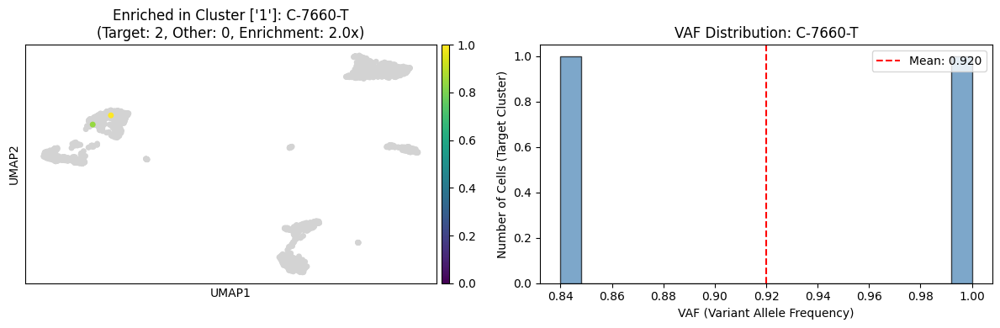


C-7660-T:
  Confident in target: 2
  Confident in other: 0
  Mean VAF in target: 0.920
  Enrichment: 2.00x

Full results stored in variable: enriched_df
You can export with: enriched_df.to_csv('enriched_variants_cluster1.csv', index=False)


In [70]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ============================================
# EDIT THESE PARAMETERS
# ============================================
TARGET_CLUSTERS = ['1']  # Edit this: clusters to look for unique variants in
MIN_CONFIDENT_CELLS = 2  # Lowered to 2 (most variants are in 1-2 cells)
MAX_CONFIDENT_IN_OTHER = 3  # Allow some presence in other clusters
MIN_MEAN_VAF_IN_TARGET = 0.01  # Minimum mean VAF in target cluster(s)
TOP_N_VARIANTS = 10  # Number of top variants to plot
MIN_ENRICHMENT = 1.5  # Minimum enrichment ratio (target/other)

# ============================================
# ANALYSIS CODE
# ============================================

print(f"Finding variants enriched in cluster(s): {TARGET_CLUSTERS}")
print(f"Criteria:")
print(f"  - Min confident cells in target: {MIN_CONFIDENT_CELLS}")
print(f"  - Max confident cells in other clusters: {MAX_CONFIDENT_IN_OTHER}")
print(f"  - Min mean VAF in target: {MIN_MEAN_VAF_IN_TARGET}")
print(f"  - Min enrichment ratio: {MIN_ENRICHMENT}")
print("="*60)

# Get cluster assignments
cluster_col = 'leiden'
clusters = mgatk.obs[cluster_col].values

# Create masks for target and other clusters
target_mask = np.isin(clusters, TARGET_CLUSTERS)
other_mask = ~target_mask

print(f"Cells in target cluster(s): {target_mask.sum()}")
print(f"Cells in other clusters: {other_mask.sum()}")

# Get matrices
vaf_matrix = mgatk.obsm['variant_vaf']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']

# Analyze each variant
enriched_variants = []

for variant_idx in range(len(variant_names)):
    variant_name = variant_names[variant_idx]
    
    # Get VAF and confidence for this variant
    vaf_values = vaf_matrix[:, variant_idx]
    confident_calls = confident_matrix[:, variant_idx]
    
    # Count confident cells in target vs other clusters
    confident_in_target = (confident_calls & target_mask & (vaf_values > 0)).sum()
    confident_in_other = (confident_calls & other_mask & (vaf_values > 0)).sum()
    
    # Calculate enrichment
    enrichment = confident_in_target / (confident_in_other + 1)
    
    # Calculate mean VAF in target cluster (only confident, non-zero calls)
    target_confident_nonzero = confident_calls & target_mask & (vaf_values > 0)
    if target_confident_nonzero.any():
        mean_vaf_target = vaf_values[target_confident_nonzero].mean()
    else:
        mean_vaf_target = 0
    
    # Check if variant meets enrichment criteria
    if (confident_in_target >= MIN_CONFIDENT_CELLS and 
        confident_in_other <= MAX_CONFIDENT_IN_OTHER and
        mean_vaf_target >= MIN_MEAN_VAF_IN_TARGET and
        enrichment >= MIN_ENRICHMENT):
        
        enriched_variants.append({
            'variant_idx': variant_idx,
            'variant_name': variant_name,
            'confident_in_target': confident_in_target,
            'confident_in_other': confident_in_other,
            'mean_vaf_target': mean_vaf_target,
            'enrichment': enrichment
        })

# Convert to DataFrame and sort
enriched_df = pd.DataFrame(enriched_variants)

if len(enriched_df) == 0:
    print("\n❌ No variants found matching the criteria!")
    print("Try relaxing the parameters (e.g., lower MIN_CONFIDENT_CELLS, increase MAX_CONFIDENT_IN_OTHER, or lower MIN_ENRICHMENT)")
else:
    # Sort by enrichment
    enriched_df = enriched_df.sort_values('enrichment', ascending=False)
    
    print(f"\n✅ Found {len(enriched_df)} enriched variants!")
    print("\nTop variants:")
    print(enriched_df.head(TOP_N_VARIANTS).to_string(index=False))
    
    # ============================================
    # PLOT TOP VARIANTS
    # ============================================
    
    n_to_plot = min(TOP_N_VARIANTS, len(enriched_df))
    print(f"\n{'='*60}")
    print(f"Plotting top {n_to_plot} enriched variants")
    print('='*60)
    
    for i, row in enriched_df.head(n_to_plot).iterrows():
        variant_idx = row['variant_idx']
        variant_name = row['variant_name']
        
        # Get VAF and confidence
        vaf_values = vaf_matrix[:, variant_idx]
        confident_calls = confident_matrix[:, variant_idx]
        
        # Filter for confident non-zero calls in TARGET cluster
        target_confident_mask = confident_calls & target_mask & (vaf_values > 0)
        filtered_vaf_values = vaf_values[target_confident_mask]
        
        if not target_confident_mask.any():
            continue
        
        # Create temporary column for plotting
        temp_vaf_col = np.full(len(mgatk.obs), np.nan)
        temp_vaf_col[target_confident_mask] = filtered_vaf_values
        mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col
        
        # Create figure
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        
        # UMAP plot
        import scanpy as sc
        sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1,
                   title=f"Enriched in Cluster {TARGET_CLUSTERS}: {variant_name}\n" + 
                         f"(Target: {int(row['confident_in_target'])}, Other: {int(row['confident_in_other'])}, Enrichment: {row['enrichment']:.1f}x)",
                   ax=ax1, show=False, na_color='lightgray')
        
        # Histogram
        ax2.hist(filtered_vaf_values, bins=20, alpha=0.7, edgecolor='black', color='steelblue')
        ax2.set_xlabel('VAF (Variant Allele Frequency)')
        ax2.set_ylabel('Number of Cells (Target Cluster)')
        ax2.set_title(f'VAF Distribution: {variant_name}')
        ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--',
                    label=f'Mean: {filtered_vaf_values.mean():.3f}')
        ax2.legend()
        
        plt.tight_layout()
        plt.show()
        
        print(f"\n{variant_name}:")
        print(f"  Confident in target: {int(row['confident_in_target'])}")
        print(f"  Confident in other: {int(row['confident_in_other'])}")
        print(f"  Mean VAF in target: {row['mean_vaf_target']:.3f}")
        print(f"  Enrichment: {row['enrichment']:.2f}x")
        
        # Clean up
        mgatk.obs.drop(columns=[f'temp_vaf_{variant_idx}'], inplace=True)
    
    # ============================================
    # EXPORT RESULTS
    # ============================================
    print(f"\n{'='*60}")
    print("Full results stored in variable: enriched_df")
    print("You can export with: enriched_df.to_csv('enriched_variants_cluster1.csv', index=False)")